## SDG 7 objective: "Ensure access to affordable, secure, sustainable and modern energy for all."

- ¿Cómo aumentar el uso de energías renovables, mejorar el acceso a la electricidad en áreas rurales o promover la eficiencia energética?

Energy Consumption Trends: Analyze the data to identify trends in global energy consumption over time. This can help governments and organizations make informed decisions about energy policies, investments, and resource allocation.

Renewable Energy Adoption: Determine the adoption rate of renewable energy sources (such as solar, wind, and hydropower) across different countries and regions. This information can be valuable for assessing progress toward sustainable energy goals.

Carbon Emissions Analysis: Investigate the relationship between energy production methods and carbon emissions. Python data analysis can help in identifying sources of high emissions and formulating strategies for reducing carbon footprints.

## 1.DATA CLEANING- DATA WRANGLING

In [487]:
#Importing libraries
import pandas as pd 
import numpy as np
import seaborn as sns
from datetime import datetime
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import pycountry_convert as pc
import plotly.graph_objects as go
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
pd.set_option('display.max_columns', None)
%matplotlib inline

In [488]:
#Loading,reading and storing dataset
df = pd.read_csv('global_data.csv')
df.head(5)

,Entity,Year,Access to electricity (% of population),Access to clean fuels for cooking,Renewable-electricity-generating-capacity-per-capita,Financial flows to developing countries (US $),Renewable energy share in the total final energy consumption (%),Electricity from fossil fuels (TWh),Electricity from nuclear (TWh),Electricity from renewables (TWh),Low-carbon electricity (% electricity),Primary energy consumption per capita (kWh/person),Energy intensity level of primary energy (MJ/$2017 PPP GDP),Value_co2_emissions_kt_by_country,Renewables (% equivalent primary energy),gdp_growth,gdp_per_capita,Density\n(P/Km2),Land Area(Km2),Latitude,Longitude
0,Afghanistan,2000,1.613591,6.2,9.22,20000.0,44.99,0.16,0.0,0.31,65.957440,302.59482,1.64,760.000000,NaN,NaN,NaN,60,652230.0,33.93911,67.709953
1,Afghanistan,2001,4.074574,7.2,8.86,130000.0,45.60,0.09,0.0,0.50,84.745766,236.89185,1.74,730.000000,NaN,NaN,NaN,60,652230.0,33.93911,67.709953
2,Afghanistan,2002,9.409158,8.2,8.47,3950000.0,37.83,0.13,0.0,0.56,81.159424,210.86215,1.40,1029.999971,NaN,NaN,179.426579,60,652230.0,33.93911,67.709953
3,Afghanistan,2003,14.738506,9.5,8.09,25970000.0,36.66,0.31,0.0,0.63,67.021280,229.96822,1.40,1220.000029,NaN,8.832278,190.683814,60,652230.0,33.93911,67.709953
4,Afghanistan,2004,20.064968,10.9,7.75,NaN,44.24,0.33,0.0,0.56,62.921350,204.23125,1.20,1029.999971,NaN,1.414118,211.382074,60,652230.0,33.93911,67.709953


### UNDERSTANDING DATA

**Entity**: The name of the country or region for which the data is reported.   
**Year**: The year for which the data is reported, ranging from 2000 to 2020.   
**Access to electricity (% of population)**: The percentage of population with access to electricity.   
**Access to clean fuels for cooking (% of population)**: The percentage of the population with primary reliance on clean fuels.   
**Renewable-electricity-generating-capacity-per-capita**: Installed Renewable energy capacity per person   
**Financial flows to developing countries (US)**: Aid and assistance from developed countries for clean energy projects.   
**Renewable energy share in total final energy consumption (%)**: Percentage of renewable energy in final energy consumption.   
**Electricity from fossil fuels (TWh)**: Electricity generated from fossil fuels (coal, oil, gas) in terawatt-hours.   
**Electricity from nuclear (TWh)**: Electricity generated from nuclear power in terawatt-hours.   
**Electricity from renewables (TWh)**: Electricity generated from renewable sources (hydro, solar, wind, etc.) in terawatt-hours.   
**Low-carbon electricity (% electricity)**: Percentage of electricity from low-carbon sources (nuclear and renewables).    
**Primary energy consumption per capita (kWh/person)**: Energy consumption per person in kilowatt-hours.   
**Energy intensity level of primary energy (MJ/$2011 PPP GDP)**: Energy use per unit of GDP at purchasing power parity.   
**Value_co2_emissions (metric tons per capita)**: Carbon dioxide emissions per person in metric tons.   
**Renewables(% equivalent primary energy)**: Equivalent primary energy that is derived from renewable sources.   
**GDP growth (annual %)**: Annual GDP growth rate based on constant local currency.   
**GDP per capita**: Gross domestic product per person.   
**Density (P/Km2)**: Population density in persons per square kilometer.   
**Land Area (Km2)**: Total land area in square kilometers.   
**Latitude**: Latitude of the country's centroid in decimal degrees.   
**Longitude**: Longitude of the country's centroid in decimal degrees.  

In [489]:
#Show the DataFrame's shape
df.shape

(3649, 21)

In [490]:
 # Standardize column names
df.columns=[e.lower().replace(' ', '').replace('-', '_') for e in df.columns]  
df.columns

Index(['entity', 'year', 'accesstoelectricity(%ofpopulation)',
       'accesstocleanfuelsforcooking',
       'renewable_electricity_generating_capacity_per_capita',
       'financialflowstodevelopingcountries(us$)',
       'renewableenergyshareinthetotalfinalenergyconsumption(%)',
       'electricityfromfossilfuels(twh)', 'electricityfromnuclear(twh)',
       'electricityfromrenewables(twh)', 'low_carbonelectricity(%electricity)',
       'primaryenergyconsumptionpercapita(kwh/person)',
       'energyintensitylevelofprimaryenergy(mj/$2017pppgdp)',
       'value_co2_emissions_kt_by_country',
       'renewables(%equivalentprimaryenergy)', 'gdp_growth', 'gdp_per_capita',
       'density\n(p/km2)', 'landarea(km2)', 'latitude', 'longitude'],
      dtype='object')

In [491]:
df = df.rename(columns = {"density\\n(p/km2)":"density(P/km2)",
                  "value_co2_emissions_kt_by_country":"CO2_emissions_value_by_country_kt",
                  "accesstocleanfuelsforcooking":"access_to_clean_fuels_for_cooking",
                  "financialflowstodevelopingcountries(us$)":"financial_flows_to_developing_countries(us$)",
                  "renewableenergyshareinthetotalfinalenergyconsumption(%)":"renewable_energy_share_in_the_total_final_energy_consumption(%)",
                  "electricityfromfossilfuels(twh)":"electricity_from_fossil_fuels(twh)",
                  "primaryenergyconsumptionpercapita(kwh/person)":"primary_energy_consumption_per_capita(kwh/person)",
                  "energyintensitylevelofprimaryenergy(mj/$2017pppgdp)":"energy_intensity_level_of_primary_energy(mj/$2017pppgdp)",
                  "renewables(%equivalentprimaryenergy)": "renewables(%equivalent_primary_energy)",
                  "accesstoelectricity(%ofpopulation)":"access_to_electricity(%_of_population)",
                  "electricityfromnuclear(twh)":"electricity_from_nuclear(twh)",   
                  "electricityfromrenewables(twh)":"electricity_from_renewables(twh)"
               
                  })

In [492]:
df.head(5)

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),latitude,longitude
0,Afghanistan,2000,1.613591,6.2,9.22,20000.0,44.99,0.16,0.0,0.31,65.957440,302.59482,1.64,760.000000,NaN,NaN,NaN,60,652230.0,33.93911,67.709953
1,Afghanistan,2001,4.074574,7.2,8.86,130000.0,45.60,0.09,0.0,0.50,84.745766,236.89185,1.74,730.000000,NaN,NaN,NaN,60,652230.0,33.93911,67.709953
2,Afghanistan,2002,9.409158,8.2,8.47,3950000.0,37.83,0.13,0.0,0.56,81.159424,210.86215,1.40,1029.999971,NaN,NaN,179.426579,60,652230.0,33.93911,67.709953
3,Afghanistan,2003,14.738506,9.5,8.09,25970000.0,36.66,0.31,0.0,0.63,67.021280,229.96822,1.40,1220.000029,NaN,8.832278,190.683814,60,652230.0,33.93911,67.709953
4,Afghanistan,2004,20.064968,10.9,7.75,NaN,44.24,0.33,0.0,0.56,62.921350,204.23125,1.20,1029.999971,NaN,1.414118,211.382074,60,652230.0,33.93911,67.709953


In [493]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3649 entries, 0 to 3648
Data columns (total 21 columns):
 #   Column                                                           Non-Null Count  Dtype  
---  ------                                                           --------------  -----  
 0   entity                                                           3649 non-null   object 
 1   year                                                             3649 non-null   int64  
 2   access_to_electricity(%_of_population)                           3639 non-null   float64
 3   access_to_clean_fuels_for_cooking                                3480 non-null   float64
 4   renewable_electricity_generating_capacity_per_capita             2718 non-null   float64
 5   financial_flows_to_developing_countries(us$)                     1560 non-null   float64
 6   renewable_energy_share_in_the_total_final_energy_consumption(%)  3455 non-null   float64
 7   electricity_from_fossil_fuels(twh)        

In [494]:
#df['year'] = pd.to_datetime(df['year'], format='%Y')

In [495]:
# Llena los valores faltantes con ceros
#df['density(P/km2)'].fillna(0, inplace=True)
#df['density(P/km2)'] = df['density(P/km2)'].str.replace(',', '', regex=True)  # Elimina las comas, si las hay
#df['density(P/km2)'] = df['density(P/km2)'].astype(int)

In [496]:
#Checking for duplicate rows in the data to remove if any
df.duplicated().sum()

0

In [497]:
##hecking null values
df.isnull().sum().sort_values(ascending=False)

renewables(%equivalent_primary_energy)                             2137
financial_flows_to_developing_countries(us$)                       2089
renewable_electricity_generating_capacity_per_capita                931
CO2_emissions_value_by_country_kt                                   428
gdp_growth                                                          317
gdp_per_capita                                                      282
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)            207
renewable_energy_share_in_the_total_final_energy_consumption(%)     194
access_to_clean_fuels_for_cooking                                   169
electricity_from_nuclear(twh)                                       126
low_carbonelectricity(%electricity)                                  42
electricity_from_renewables(twh)                                     21
electricity_from_fossil_fuels(twh)                                   21
access_to_electricity(%_of_population)                          

In [498]:
#Checking % of null values
null_percentage = [(col, 100 * sum(df[col].isnull()) / len(df[col])) for col in df.columns]

# Sort list of tuples by percentage of null values from largest to smallest
sorted_null_percentage = sorted(null_percentage, key=lambda x: x[1], reverse=True)

# Print the ordered list
print("Nulls (sorted by percentage descending):")
for col, percentage in sorted_null_percentage:
    print(f"{col} contains {percentage:.2f}%")

Nulls (sorted by percentage descending):
renewables(%equivalent_primary_energy) contains 58.56%
financial_flows_to_developing_countries(us$) contains 57.25%
renewable_electricity_generating_capacity_per_capita contains 25.51%
CO2_emissions_value_by_country_kt contains 11.73%
gdp_growth contains 8.69%
gdp_per_capita contains 7.73%
energy_intensity_level_of_primary_energy(mj/$2017pppgdp) contains 5.67%
renewable_energy_share_in_the_total_final_energy_consumption(%) contains 5.32%
access_to_clean_fuels_for_cooking contains 4.63%
electricity_from_nuclear(twh) contains 3.45%
low_carbonelectricity(%electricity) contains 1.15%
electricity_from_fossil_fuels(twh) contains 0.58%
electricity_from_renewables(twh) contains 0.58%
access_to_electricity(%_of_population) contains 0.27%
density(P/km2) contains 0.03%
landarea(km2) contains 0.03%
latitude contains 0.03%
longitude contains 0.03%
entity contains 0.00%
year contains 0.00%
primary_energy_consumption_per_capita(kwh/person) contains 0.00%


In [499]:
# Number of zero values in the dataset (in percent)
missing_values_df = df.isnull().sum() / df.shape[0] * 100.00
print(round(missing_values_df),2)

entity                                                              0.0
year                                                                0.0
access_to_electricity(%_of_population)                              0.0
access_to_clean_fuels_for_cooking                                   5.0
renewable_electricity_generating_capacity_per_capita               26.0
financial_flows_to_developing_countries(us$)                       57.0
renewable_energy_share_in_the_total_final_energy_consumption(%)     5.0
electricity_from_fossil_fuels(twh)                                  1.0
electricity_from_nuclear(twh)                                       3.0
electricity_from_renewables(twh)                                    1.0
low_carbonelectricity(%electricity)                                 1.0
primary_energy_consumption_per_capita(kwh/person)                   0.0
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)            6.0
CO2_emissions_value_by_country_kt                               

There are two feautures with a rather large number of zero values:

- Renewables (% equivalent to primary energy) - 59.0%.
- Financial flows to developing countries (US $) - 57.0%.
Cleaning can cause significant errors in the study, as more than 57% of the data will be removed.

In [500]:
df.isnull().sum().sort_values(ascending=False)

renewables(%equivalent_primary_energy)                             2137
financial_flows_to_developing_countries(us$)                       2089
renewable_electricity_generating_capacity_per_capita                931
CO2_emissions_value_by_country_kt                                   428
gdp_growth                                                          317
gdp_per_capita                                                      282
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)            207
renewable_energy_share_in_the_total_final_energy_consumption(%)     194
access_to_clean_fuels_for_cooking                                   169
electricity_from_nuclear(twh)                                       126
low_carbonelectricity(%electricity)                                  42
electricity_from_renewables(twh)                                     21
electricity_from_fossil_fuels(twh)                                   21
access_to_electricity(%_of_population)                          

In [501]:
#Añadimos columna de continente  al dataset para poder filtrar y hacer analisis 
#Creating a column 'Continent'

def country_to_continent(country_name):
    country_alpha2 = pc.country_name_to_country_alpha2(country_name)
    country_continent_code = pc.country_alpha2_to_continent_code(country_alpha2)
    country_continent_name = pc.convert_continent_code_to_continent_name(country_continent_code)
    return country_continent_name

df['continent'] = df['entity'].apply(country_to_continent)
df.head(5)

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),latitude,longitude,continent
0,Afghanistan,2000,1.613591,6.2,9.22,20000.0,44.99,0.16,0.0,0.31,65.957440,302.59482,1.64,760.000000,NaN,NaN,NaN,60,652230.0,33.93911,67.709953,Asia
1,Afghanistan,2001,4.074574,7.2,8.86,130000.0,45.60,0.09,0.0,0.50,84.745766,236.89185,1.74,730.000000,NaN,NaN,NaN,60,652230.0,33.93911,67.709953,Asia
2,Afghanistan,2002,9.409158,8.2,8.47,3950000.0,37.83,0.13,0.0,0.56,81.159424,210.86215,1.40,1029.999971,NaN,NaN,179.426579,60,652230.0,33.93911,67.709953,Asia
3,Afghanistan,2003,14.738506,9.5,8.09,25970000.0,36.66,0.31,0.0,0.63,67.021280,229.96822,1.40,1220.000029,NaN,8.832278,190.683814,60,652230.0,33.93911,67.709953,Asia
4,Afghanistan,2004,20.064968,10.9,7.75,NaN,44.24,0.33,0.0,0.56,62.921350,204.23125,1.20,1029.999971,NaN,1.414118,211.382074,60,652230.0,33.93911,67.709953,Asia


In [502]:
#Eliminamos lso dos continentes que vamos a dejar fuera del analisis y las columnas latitude y longitud
continentes_a_eliminar = ['Oceania', 'Africa']
df = df[~df['continent'].isin(continentes_a_eliminar)]

In [503]:
columnas_delete = ['latitude', 'longitude']
df = df.drop(columns=columnas_delete)
df.head(5)

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),continent
0,Afghanistan,2000,1.613591,6.2,9.22,20000.0,44.99,0.16,0.0,0.31,65.957440,302.59482,1.64,760.000000,NaN,NaN,NaN,60,652230.0,Asia
1,Afghanistan,2001,4.074574,7.2,8.86,130000.0,45.60,0.09,0.0,0.50,84.745766,236.89185,1.74,730.000000,NaN,NaN,NaN,60,652230.0,Asia
2,Afghanistan,2002,9.409158,8.2,8.47,3950000.0,37.83,0.13,0.0,0.56,81.159424,210.86215,1.40,1029.999971,NaN,NaN,179.426579,60,652230.0,Asia
3,Afghanistan,2003,14.738506,9.5,8.09,25970000.0,36.66,0.31,0.0,0.63,67.021280,229.96822,1.40,1220.000029,NaN,8.832278,190.683814,60,652230.0,Asia
4,Afghanistan,2004,20.064968,10.9,7.75,NaN,44.24,0.33,0.0,0.56,62.921350,204.23125,1.20,1029.999971,NaN,1.414118,211.382074,60,652230.0,Asia


In [504]:
df.shape

(2360, 20)

In [505]:
df.isnull().sum().sort_values(ascending=False)

financial_flows_to_developing_countries(us$)                       1527
renewables(%equivalent_primary_energy)                              974
renewable_electricity_generating_capacity_per_capita                889
CO2_emissions_value_by_country_kt                                   303
gdp_growth                                                          184
gdp_per_capita                                                      180
renewable_energy_share_in_the_total_final_energy_consumption(%)     133
access_to_clean_fuels_for_cooking                                   127
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)            118
electricity_from_nuclear(twh)                                       105
low_carbonelectricity(%electricity)                                  21
access_to_electricity(%_of_population)                                1
landarea(km2)                                                         1
density(P/km2)                                                  

In [506]:
#Vamos a agrupar los continentes elegidos para el analisis en distintos df para seguir tratando nulos y outliers según sus características especiales
# Supongamos que ya tienes un DataFrame llamado 'df' con las columnas 'Country' y 'Continent'

# Agrupar el DataFrame por la columna 'Continent'
continent_groups = df.groupby('continent')

# Crear diccionarios para almacenar DataFrames separados por continente
continents = ['Europe', 'Asia', 'North America', 'South America',]

continent_data = {}

# Iterar sobre los grupos y almacenarlos en los diccionarios
for continent in continents:
    if continent in continent_groups.groups:
        continent_data[continent] = continent_groups.get_group(continent)

In [507]:
continent_data['Europe'].head(5)

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),continent
21,Albania,2000,100.0,38.2,NaN,NaN,NaN,0.14,0.0,4.55,97.014930,9029.4375,4.13,3170.000000,NaN,6.946217,1126.683340,105,28748.0,Europe
22,Albania,2001,100.0,40.5,NaN,NaN,NaN,0.13,0.0,3.52,96.438354,8635.5320,3.89,3230.000000,NaN,8.293313,1281.659826,105,28748.0,Europe
23,Albania,2002,100.0,43.2,NaN,NaN,NaN,0.16,0.0,3.48,95.604390,9443.5550,4.10,3759.999990,NaN,4.536524,1425.124219,105,28748.0,Europe
24,Albania,2003,100.0,46.4,NaN,NaN,NaN,0.10,0.0,5.12,98.084300,10756.6120,3.80,4070.000172,NaN,5.528637,1846.120121,105,28748.0,Europe
25,Albania,2004,100.0,49.0,NaN,NaN,NaN,0.13,0.0,5.41,97.653430,11586.9510,3.96,4250.000000,NaN,5.514668,2373.581292,105,28748.0,Europe


In [508]:
continent_data['Europe'].shape

(763, 20)

In [591]:
continent_data['Europe'].isnull().sum().sort_values(ascending=False)

entity                                                             0
year                                                               0
landarea(km2)                                                      0
density(P/km2)                                                     0
gdp_per_capita                                                     0
gdp_growth                                                         0
renewables(%equivalent_primary_energy)                             0
CO2_emissions_value_by_country_kt                                  0
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)           0
primary_energy_consumption_per_capita(kwh/person)                  0
low_carbonelectricity(%electricity)                                0
electricity_from_renewables(twh)                                   0
electricity_from_nuclear(twh)                                      0
electricity_from_fossil_fuels(twh)                                 0
renewable_energy_share_in_the_tota

In [510]:
#Rellenamos columnas de nulos con 0 
continent_data['Europe']['financial_flows_to_developing_countries(us$)'].fillna(0, inplace=True)
continent_data['Europe']['renewables(%equivalent_primary_energy)'].fillna(0, inplace=True)
continent_data['Europe']['renewable_electricity_generating_capacity_per_capita'].fillna(0, inplace=True)
continent_data['Europe']['CO2_emissions_value_by_country_kt'].fillna(0, inplace=True)

C:\Users\danie\AppData\Local\Temp\ipykernel_22500\2168471866.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\danie\AppData\Local\Temp\ipykernel_22500\2168471866.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\danie\AppData\Local\Temp\ipykernel_22500\2168471866.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\danie\AppData\Local\Temp\ipykernel_22500\2168471866.py:5: SettingWithCopyWarning:


A value

In [511]:
continent_data['Europe'] = continent_data['Europe'].interpolate(method='pad')

In [512]:
continent_data['Europe']['renewable_energy_share_in_the_total_final_energy_consumption(%)'].fillna(0, inplace=True)

In [513]:
#Save numerical data of europe
df_num_europe= continent_data['Europe'].select_dtypes(exclude=["object"])
df_num_europe.head(2)

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
21,2000,100.0,38.2,0.0,0.0,0.0,0.14,0.0,4.55,97.014930,9029.4375,4.13,3170.0,0.0,6.946217,1126.683340,28748.0
22,2001,100.0,40.5,0.0,0.0,0.0,0.13,0.0,3.52,96.438354,8635.5320,3.89,3230.0,0.0,8.293313,1281.659826,28748.0


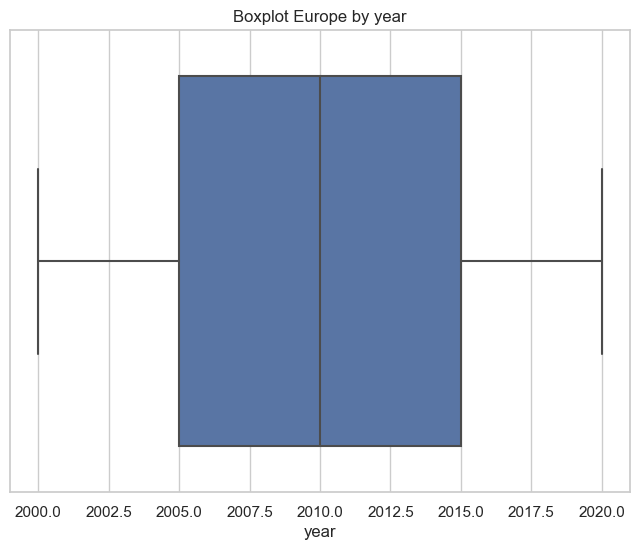

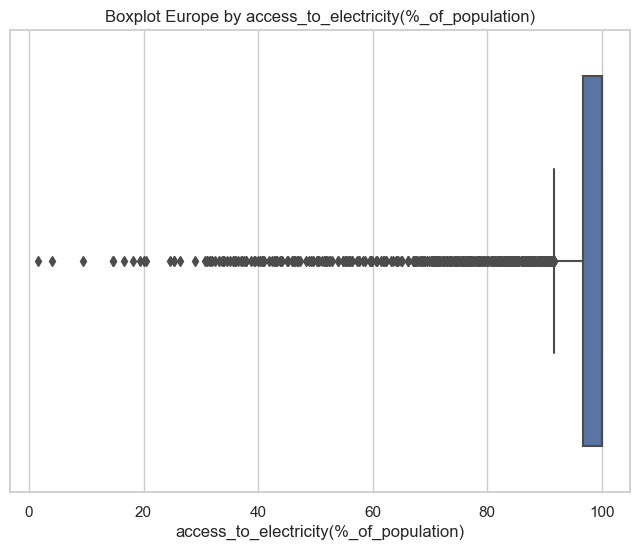

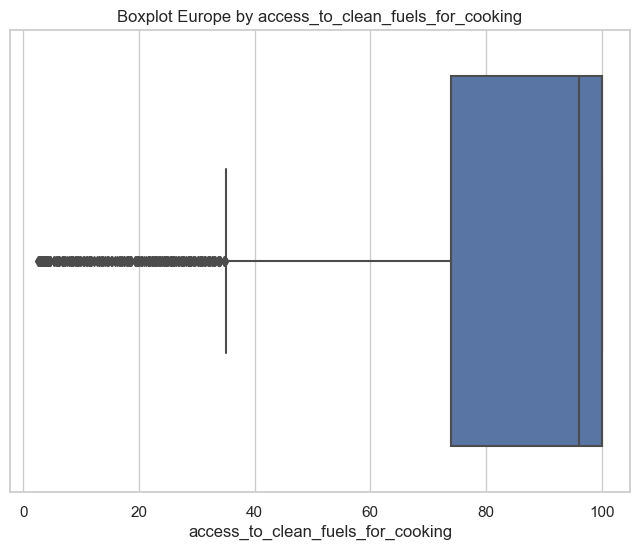

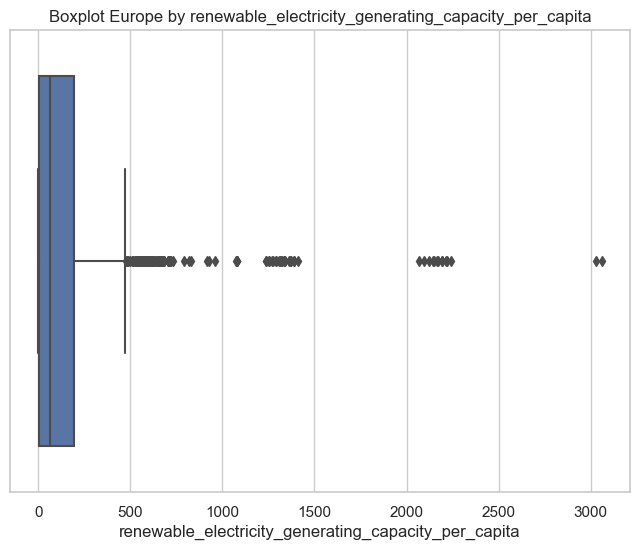

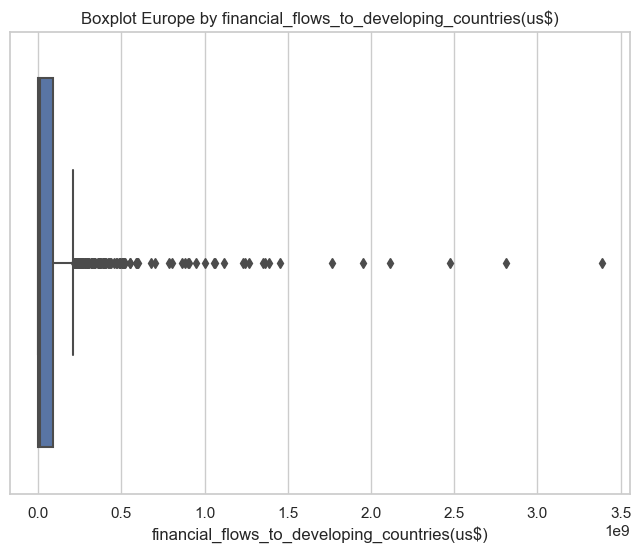

...

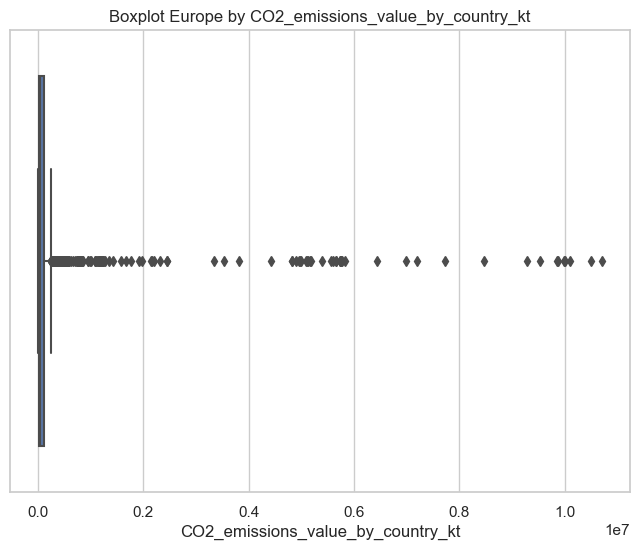

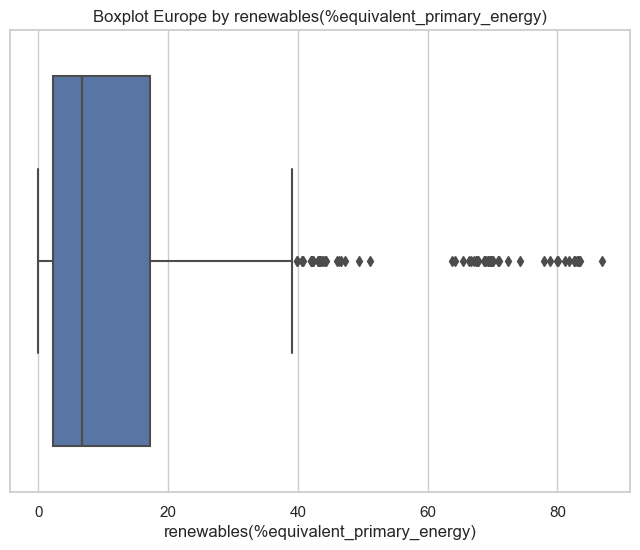

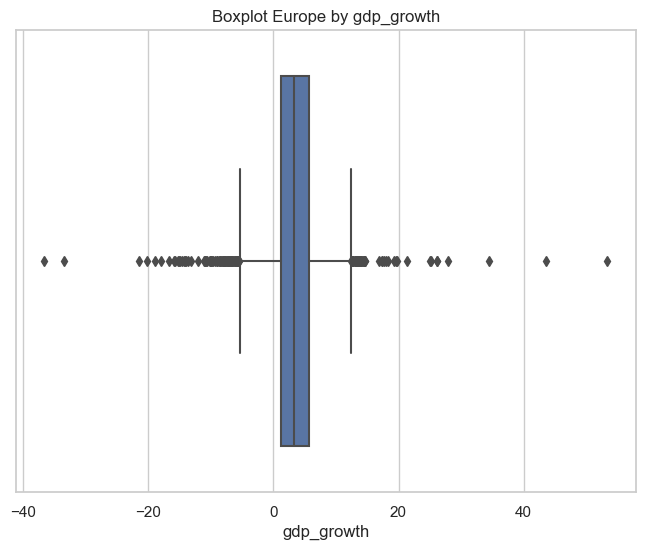

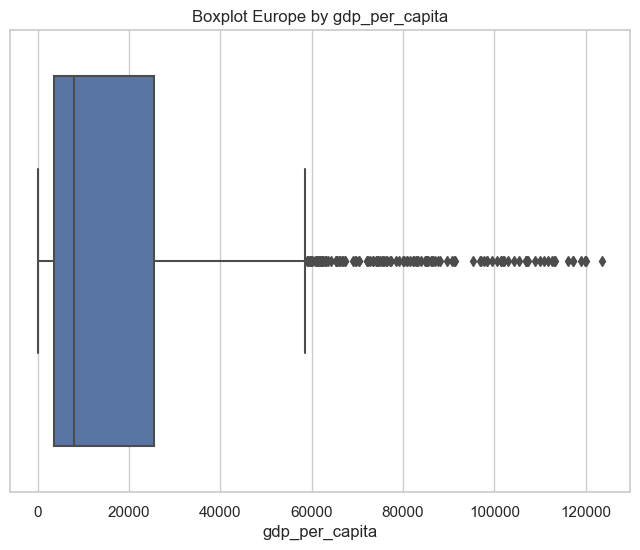

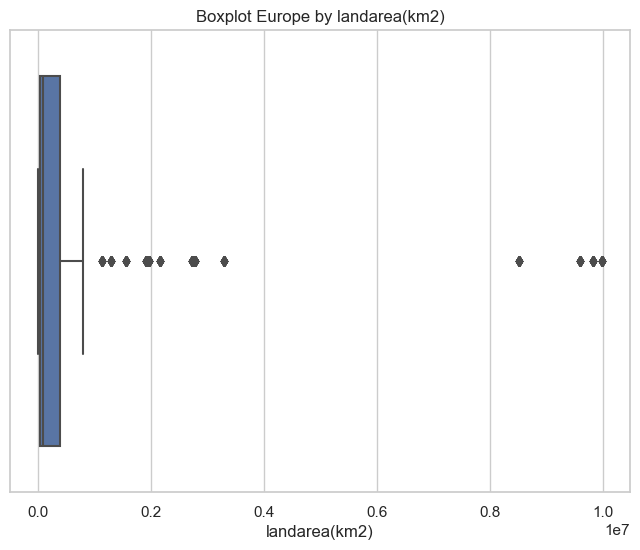

In [514]:
#CHECKING OUTLIERS
for col in df_num_europe.columns:
    # Crea un nuevo subplot para cada gráfico
    fig, ax = plt.subplots(figsize=(8, 6))
    # Crea el gráfico de boxplot utilizando seaborn
    sns.boxplot(x=df[col], ax=ax)
    # Establece el título de cada gráfico
    ax.set_title('Boxplot Europe by {}'.format(col))
    # Muestra cada gráfico
    plt.show()

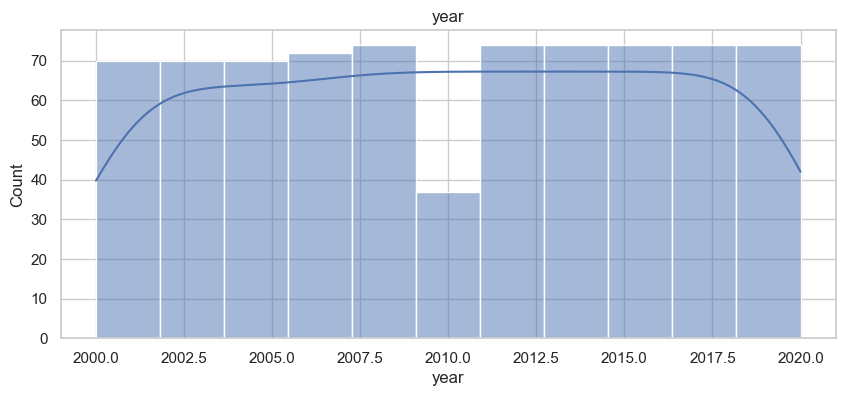

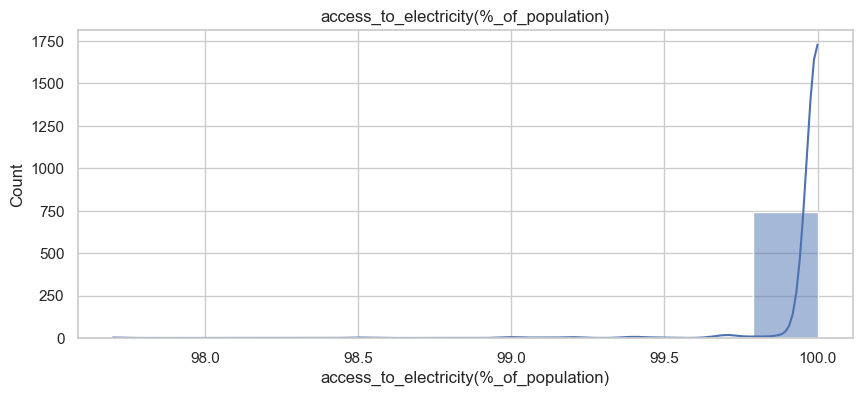

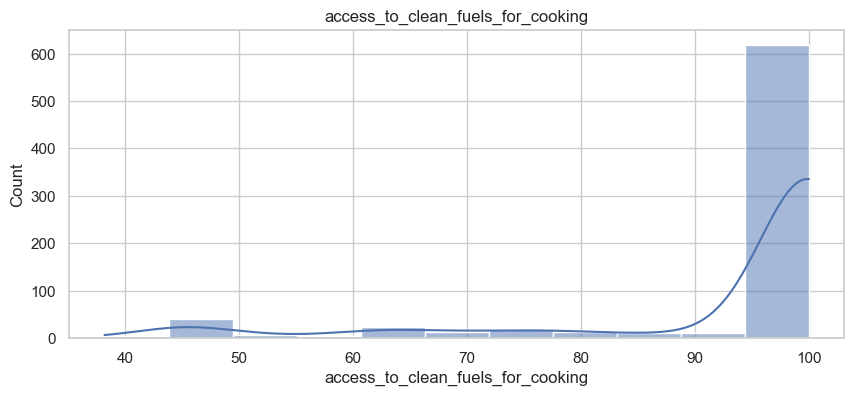

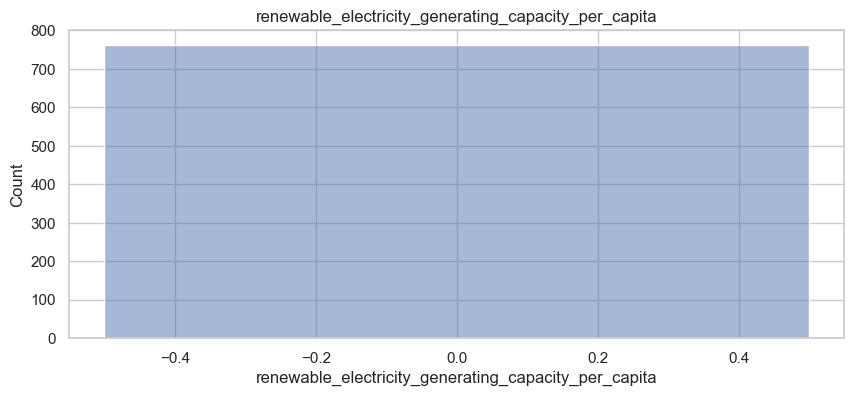

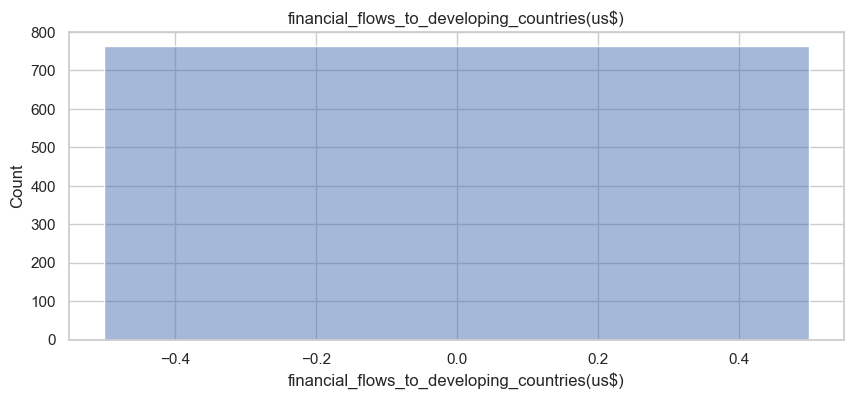

...

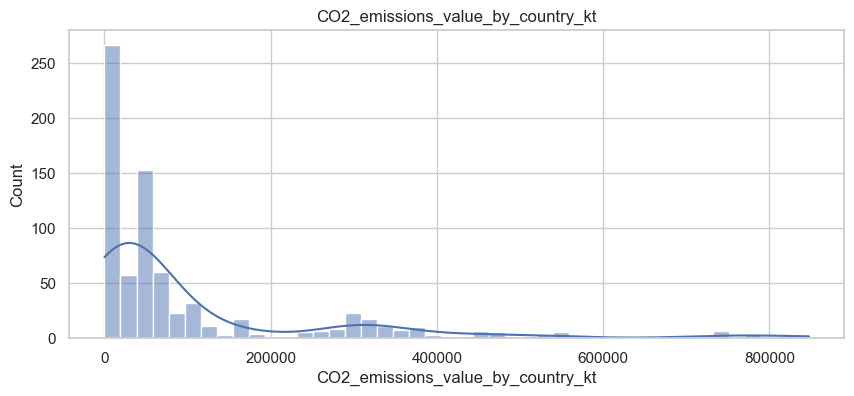

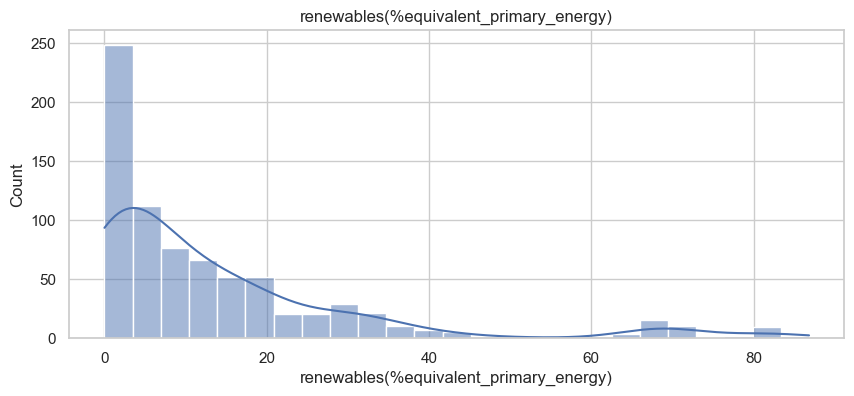

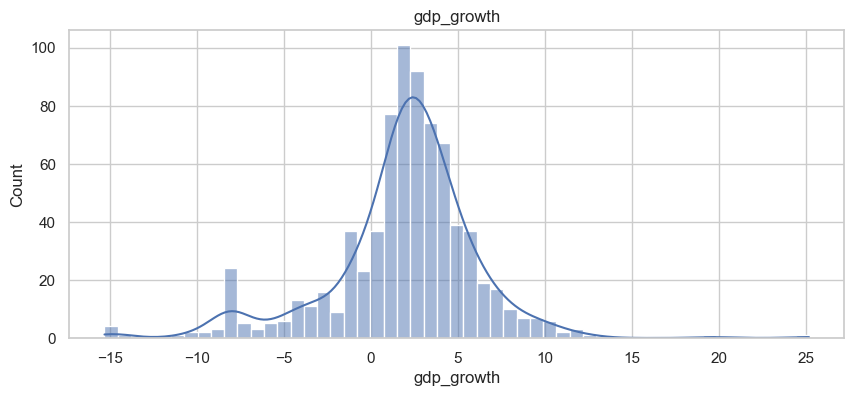

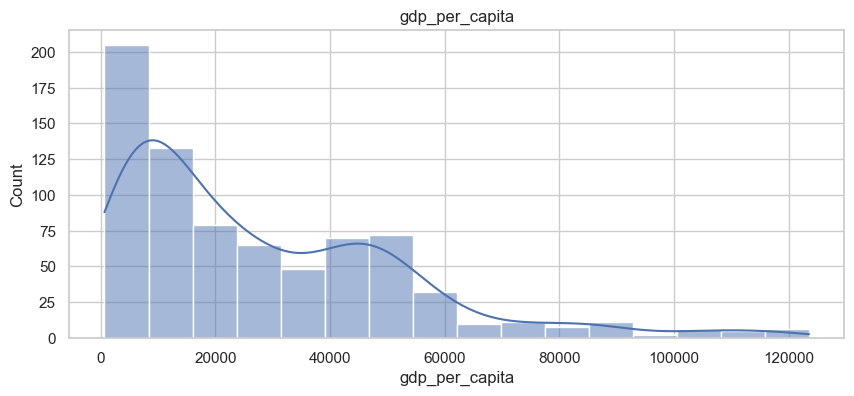

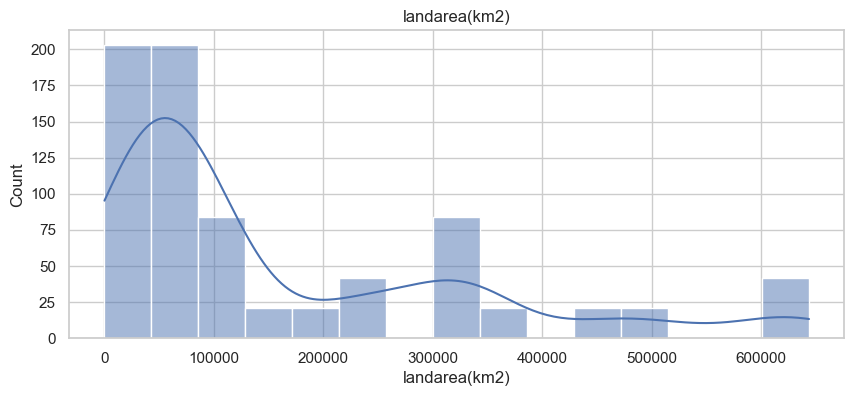

In [515]:
#CHECKING DISTRIBUTION
for c in df_num_europe.columns:
    plt.figure(figsize=(10,4))
    sns.histplot(df_num_europe[c], kde= True)
    plt.title(c)
    plt.show()

In [516]:
continent_data['Asia'].head(5)

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),continent
0,Afghanistan,2000,1.613591,6.2,9.22,20000.0,44.99,0.16,0.0,0.31,65.957440,302.59482,1.64,760.000000,NaN,NaN,NaN,60,652230.0,Asia
1,Afghanistan,2001,4.074574,7.2,8.86,130000.0,45.60,0.09,0.0,0.50,84.745766,236.89185,1.74,730.000000,NaN,NaN,NaN,60,652230.0,Asia
2,Afghanistan,2002,9.409158,8.2,8.47,3950000.0,37.83,0.13,0.0,0.56,81.159424,210.86215,1.40,1029.999971,NaN,NaN,179.426579,60,652230.0,Asia
3,Afghanistan,2003,14.738506,9.5,8.09,25970000.0,36.66,0.31,0.0,0.63,67.021280,229.96822,1.40,1220.000029,NaN,8.832278,190.683814,60,652230.0,Asia
4,Afghanistan,2004,20.064968,10.9,7.75,NaN,44.24,0.33,0.0,0.56,62.921350,204.23125,1.20,1029.999971,NaN,1.414118,211.382074,60,652230.0,Asia


In [517]:
continent_data['Asia'].shape

(819, 20)

In [592]:
continent_data['Asia'].isnull().sum().sort_values(ascending=False)

entity                                                             0
year                                                               0
landarea(km2)                                                      0
density(P/km2)                                                     0
gdp_per_capita                                                     0
gdp_growth                                                         0
renewables(%equivalent_primary_energy)                             0
CO2_emissions_value_by_country_kt                                  0
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)           0
primary_energy_consumption_per_capita(kwh/person)                  0
low_carbonelectricity(%electricity)                                0
electricity_from_renewables(twh)                                   0
electricity_from_nuclear(twh)                                      0
electricity_from_fossil_fuels(twh)                                 0
renewable_energy_share_in_the_tota

In [519]:
continent_data['Asia'] = continent_data['Asia'].interpolate(method='pad')

In [593]:
continent_data['Asia'].isnull().sum().sort_values(ascending=False)

entity                                                             0
year                                                               0
landarea(km2)                                                      0
density(P/km2)                                                     0
gdp_per_capita                                                     0
gdp_growth                                                         0
renewables(%equivalent_primary_energy)                             0
CO2_emissions_value_by_country_kt                                  0
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)           0
primary_energy_consumption_per_capita(kwh/person)                  0
low_carbonelectricity(%electricity)                                0
electricity_from_renewables(twh)                                   0
electricity_from_nuclear(twh)                                      0
electricity_from_fossil_fuels(twh)                                 0
renewable_energy_share_in_the_tota

In [521]:
continent_data['Asia']['gdp_per_capita'].fillna(0, inplace=True)
continent_data['Asia']['gdp_growth'].fillna(0, inplace=True)
continent_data['Asia']['renewables(%equivalent_primary_energy)'].fillna(0, inplace=True)

In [522]:
#Save numerical data of Asia
df_num_asia= continent_data['Asia'].select_dtypes(exclude=["object"])
df_num_asia

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
0,2000,1.613591,6.20,9.22,2.000000e+04,44.99,0.16,0.00,0.31,65.957440,302.59482,1.640000,7.600000e+02,0.000000,0.000000,0.000000,652230.0
1,2001,4.074574,7.20,8.86,1.300000e+05,45.60,0.09,0.00,0.50,84.745766,236.89185,1.740000,7.300000e+02,0.000000,0.000000,0.000000,652230.0
2,2002,9.409158,8.20,8.47,3.950000e+06,37.83,0.13,0.00,0.56,81.159424,210.86215,1.400000,1.030000e+03,0.000000,0.000000,179.426579,652230.0
3,2003,14.738506,9.50,8.09,2.597000e+07,36.66,0.31,0.00,0.63,67.021280,229.96822,1.400000,1.220000e+03,0.000000,8.832278,190.683814,652230.0
4,2004,20.064968,10.90,7.75,2.597000e+07,44.24,0.33,0.00,0.56,62.921350,204.23125,1.200000,1.030000e+03,0.000000,1.414118,211.382074,652230.0
5,2005,25.390894,12.20,7.51,9.830000e+06,33.88,0.34,0.00,0.59,63.440857,252.06912,1.410000,1.550000e+03,0.000000,11.229715,242.031313,652230.0
6,2006,30.718690,13.85,7.40,1.062000e+07,31.89,0.20,0.00,0.64,76.190475,304.42090,1.500000,1.760000e+03,0.000000,5.357403,263.733602,652230.0
7,2007,36.051010,15.30,7.25,1.575000e+07,28.78,0.20,0.00,0.75,78.947370,354.27990,1.530000,1.770000e+03,0.000000,13.826320,359.693158,652230.0
8,2008,42.400000,16.70,7.49,1.617000e+07,21.17,0.19,0.00,0.54,73.972600,607.83350,1.940000,3.560000e+03,0.000000,3.924984,364.663542,652230.0
9,2009,46.740050,18.40,7.50,9.960000e+06,16.53,0.16,0.00,0.78,82.978720,975.04816,2.250000,4.880000e+03,0.000000,21.390528,437.268740,652230.0


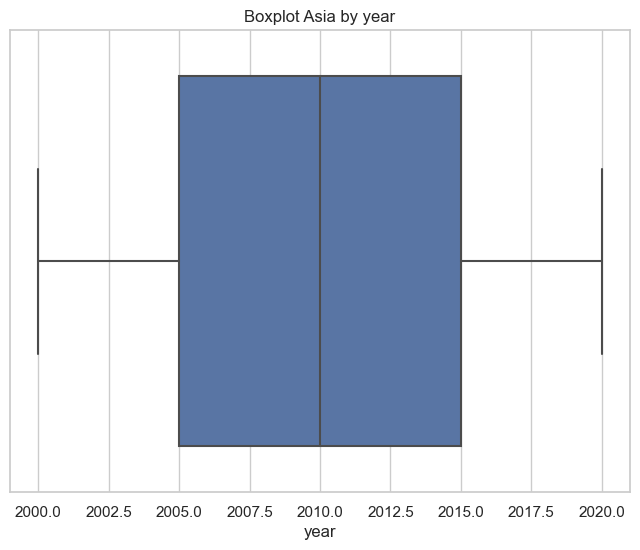

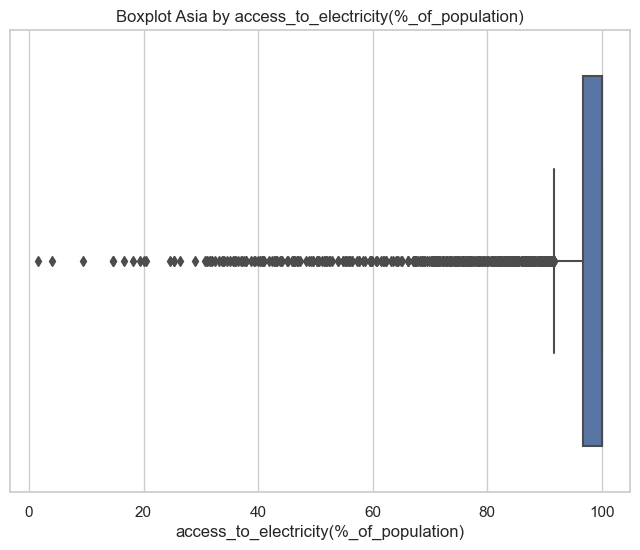

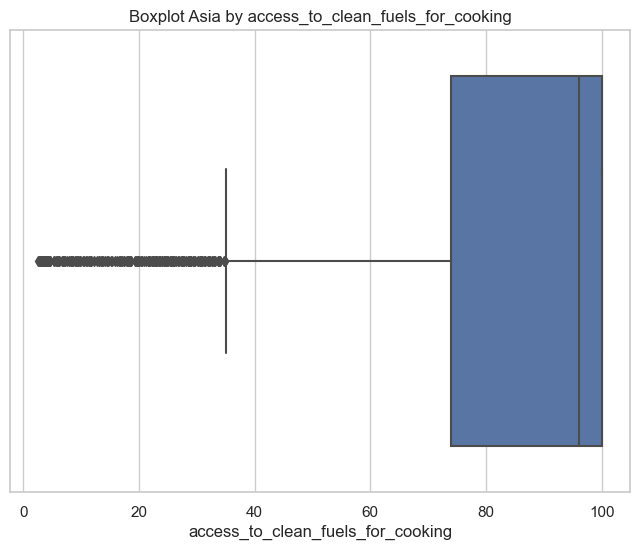

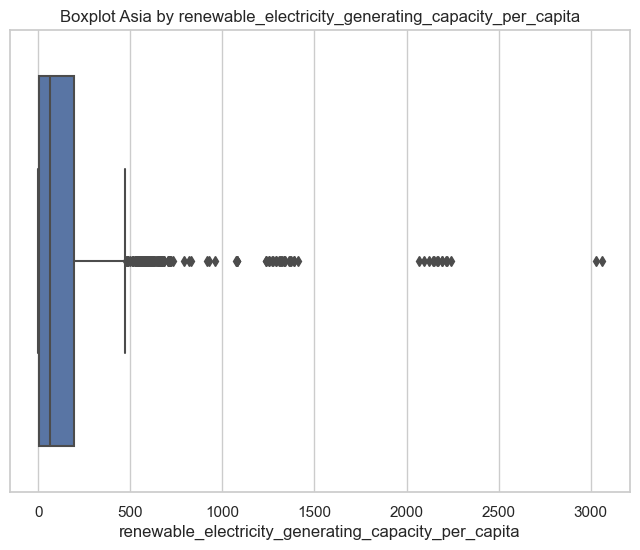

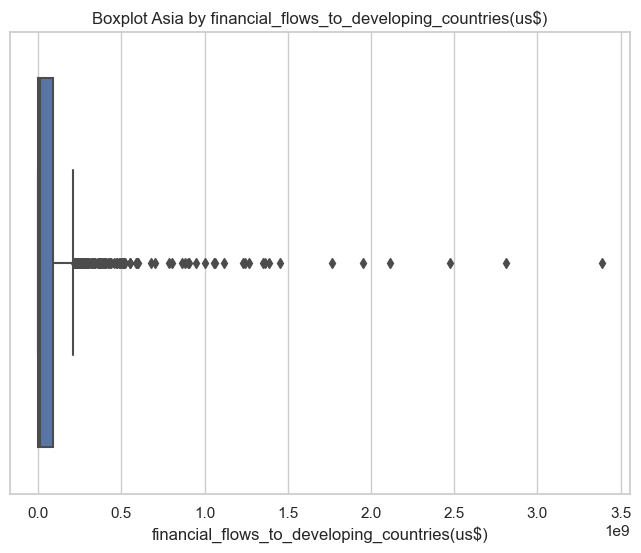

...

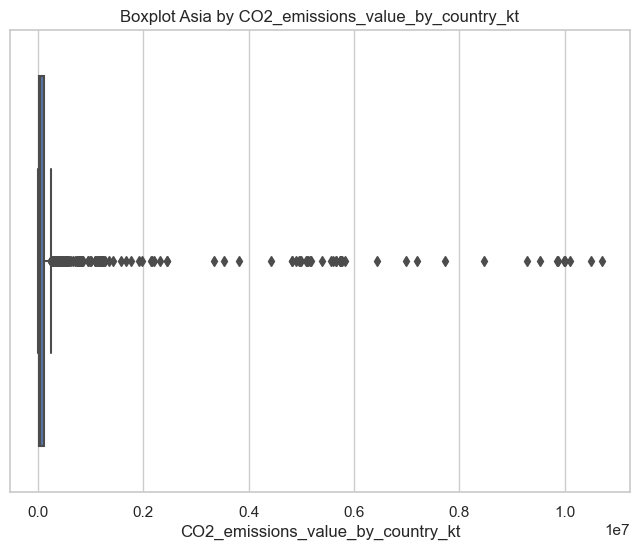

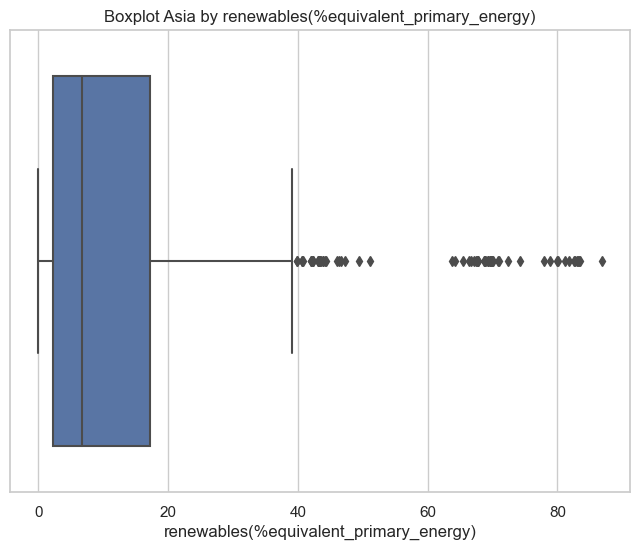

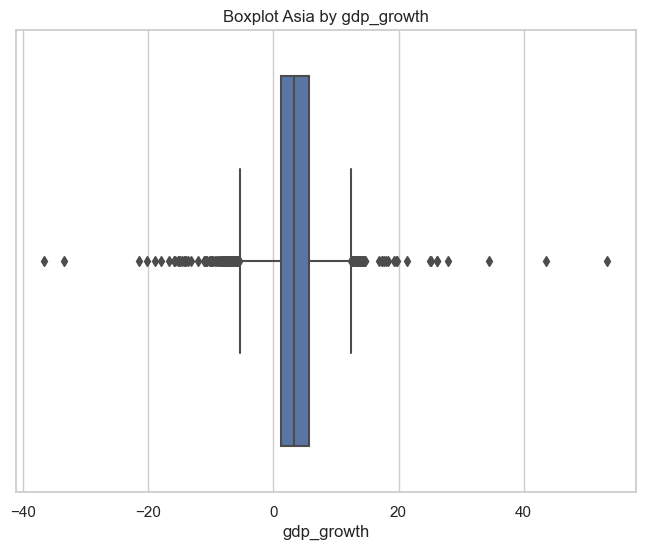

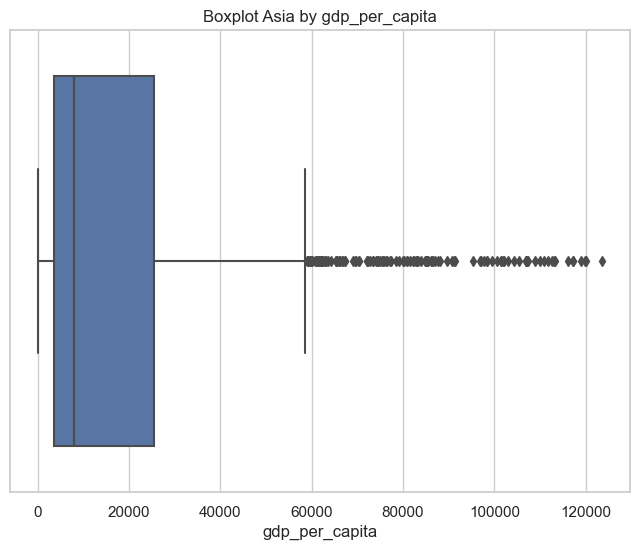

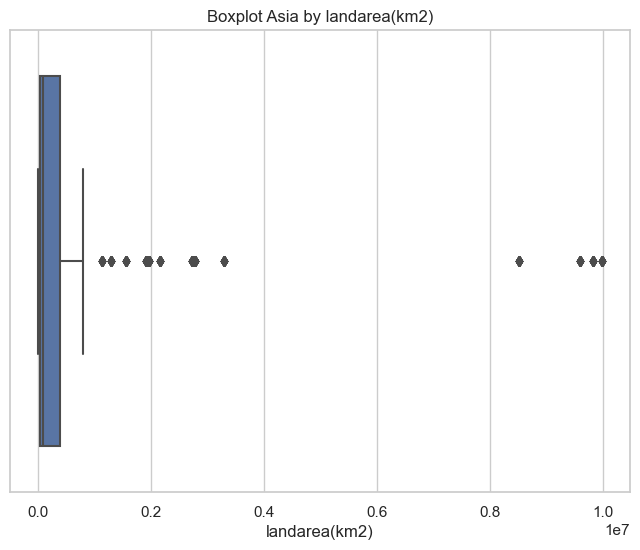

In [523]:
#CHECKING OUTLIERS
for col in df_num_asia.columns:
    # Crea un nuevo subplot para cada gráfico
    fig, ax = plt.subplots(figsize=(8, 6))
    # Crea el gráfico de boxplot utilizando seaborn
    sns.boxplot(x=df[col], ax=ax)
    # Establece el título de cada gráfico
    ax.set_title('Boxplot Asia by {}'.format(col))
    # Muestra cada gráfico
    plt.show()

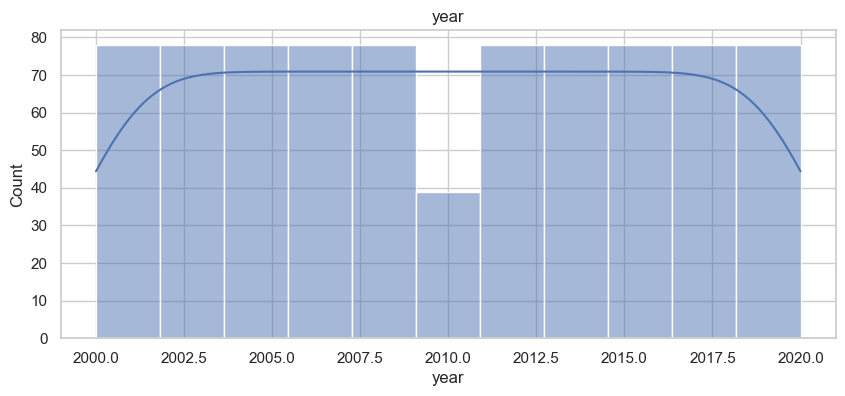

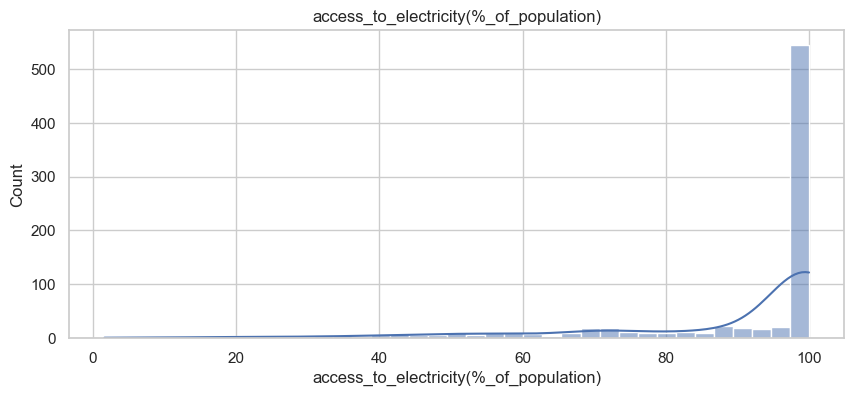

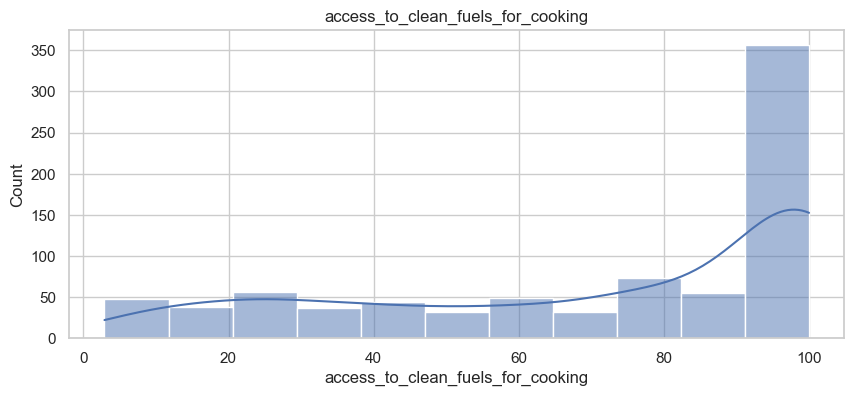

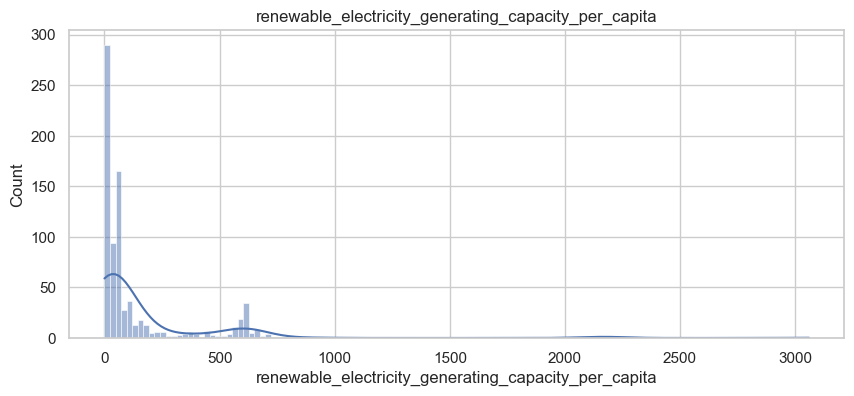

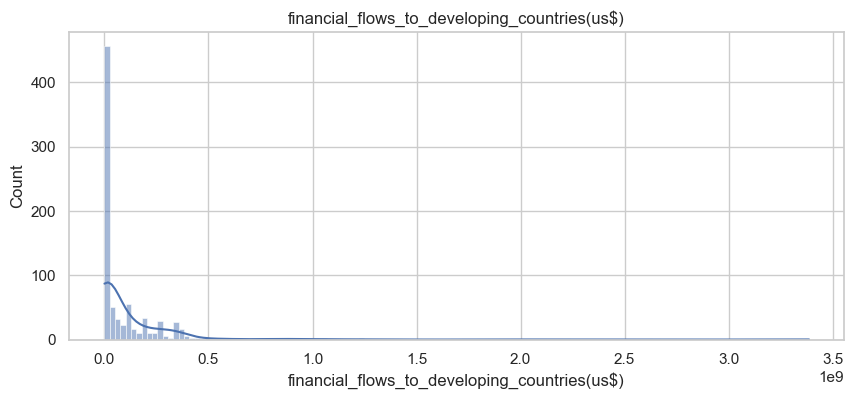

...

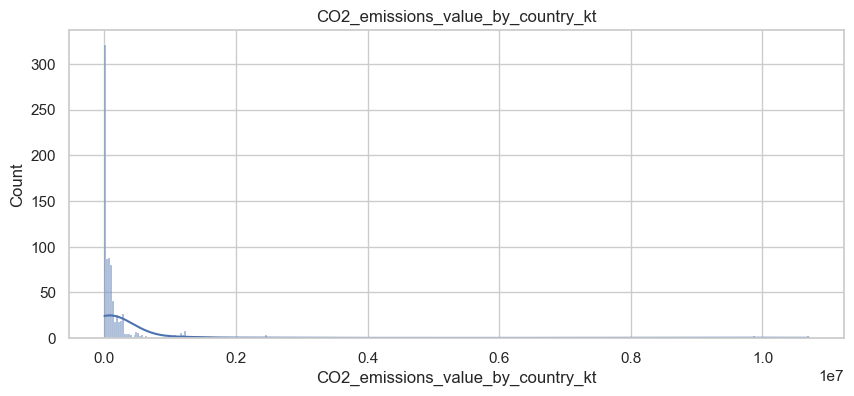

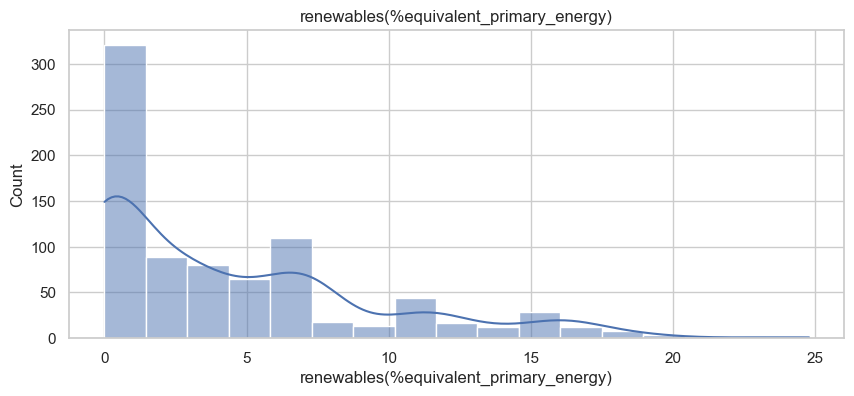

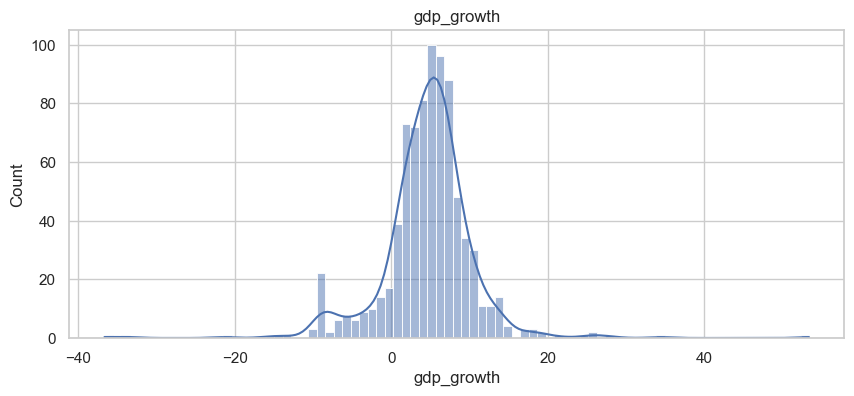

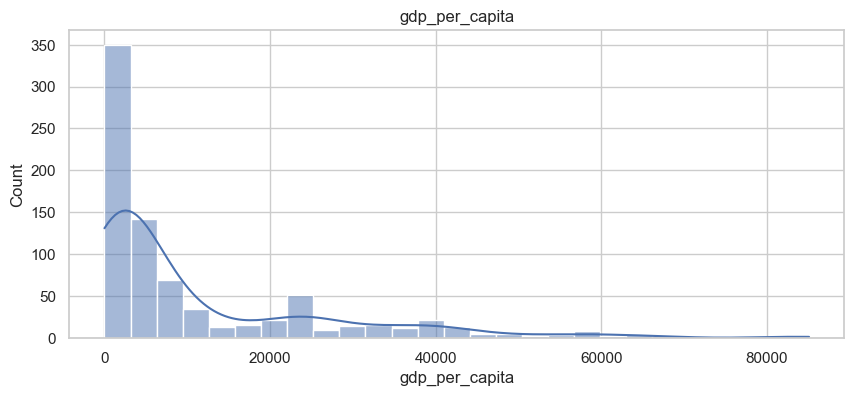

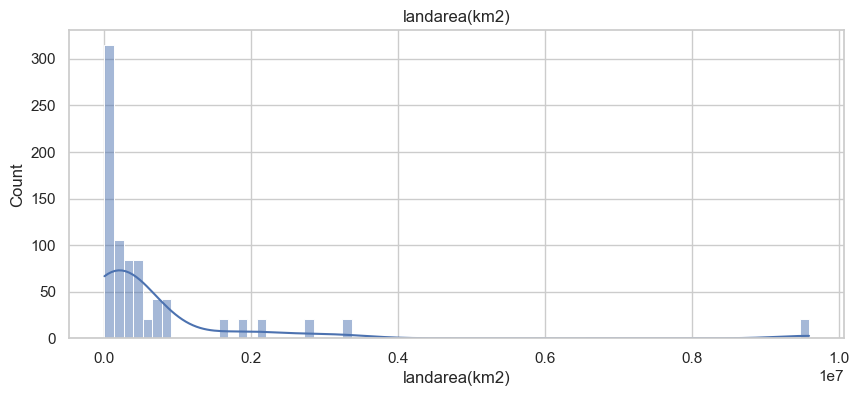

In [524]:
#CHECKING DISTRIBUTION
for c in df_num_asia.columns:
    plt.figure(figsize=(10,4))
    sns.histplot(df_num_asia[c], kde= True)
    plt.title(c)
    plt.show()

In [525]:
continent_data['North America'].head(5)

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),continent
84,Antigua and Barbuda,2000,97.689260,100.0,0.0,NaN,0.0,0.14,0.0,0.0,0.0,28457.223,3.13,330.000000,NaN,6.203431,10872.29295,223,443.0,North America
85,Antigua and Barbuda,2001,97.785255,100.0,0.0,NaN,0.0,0.16,0.0,0.0,0.0,28025.290,3.31,350.000000,NaN,-4.548003,10367.31961,223,443.0,North America
86,Antigua and Barbuda,2002,100.000000,100.0,0.0,NaN,0.0,0.18,0.0,0.0,0.0,29660.344,3.59,389.999986,NaN,1.027442,10401.05088,223,443.0,North America
87,Antigua and Barbuda,2003,97.956825,100.0,0.0,NaN,0.0,0.20,0.0,0.0,0.0,30824.252,3.63,409.999996,NaN,6.076544,10797.95106,223,443.0,North America
88,Antigua and Barbuda,2004,98.037100,100.0,0.0,NaN,0.0,0.21,0.0,0.0,0.0,31622.059,3.57,400.000006,NaN,5.767029,11446.96914,223,443.0,North America


In [526]:
continent_data['North America'].shape

(567, 20)

In [594]:
continent_data['North America'].isnull().sum().sort_values(ascending=False)

entity                                                             0
year                                                               0
landarea(km2)                                                      0
density(P/km2)                                                     0
gdp_per_capita                                                     0
gdp_growth                                                         0
renewables(%equivalent_primary_energy)                             0
CO2_emissions_value_by_country_kt                                  0
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)           0
primary_energy_consumption_per_capita(kwh/person)                  0
low_carbonelectricity(%electricity)                                0
electricity_from_renewables(twh)                                   0
electricity_from_nuclear(twh)                                      0
electricity_from_fossil_fuels(twh)                                 0
renewable_energy_share_in_the_tota

In [528]:
continent_data['North America'] = continent_data['North America'].interpolate(method='pad')
continent_data['North America']['renewables(%equivalent_primary_energy)'].fillna(0, inplace=True)
continent_data['North America']['financial_flows_to_developing_countries(us$)'].fillna(0, inplace=True)

In [529]:
continent_data['North America'].isnull().sum().sort_values(ascending=False)

entity                                                             0
year                                                               0
landarea(km2)                                                      0
density(P/km2)                                                     0
gdp_per_capita                                                     0
gdp_growth                                                         0
renewables(%equivalent_primary_energy)                             0
CO2_emissions_value_by_country_kt                                  0
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)           0
primary_energy_consumption_per_capita(kwh/person)                  0
low_carbonelectricity(%electricity)                                0
electricity_from_renewables(twh)                                   0
electricity_from_nuclear(twh)                                      0
electricity_from_fossil_fuels(twh)                                 0
renewable_energy_share_in_the_tota

In [530]:
#Save numerical data of Asia
df_num_north_america= continent_data['North America'].select_dtypes(exclude=["object"])
df_num_north_america

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
84,2000,97.689260,100.00,0.00,0.0,0.00,0.14,0.00,0.00,0.000000,28457.22300,3.13,3.300000e+02,0.000000,6.203431,10872.292950,443.0
85,2001,97.785255,100.00,0.00,0.0,0.00,0.16,0.00,0.00,0.000000,28025.29000,3.31,3.500000e+02,0.000000,-4.548003,10367.319610,443.0
86,2002,100.000000,100.00,0.00,0.0,0.00,0.18,0.00,0.00,0.000000,29660.34400,3.59,3.900000e+02,0.000000,1.027442,10401.050880,443.0
87,2003,97.956825,100.00,0.00,0.0,0.00,0.20,0.00,0.00,0.000000,30824.25200,3.63,4.100000e+02,0.000000,6.076544,10797.951060,443.0
88,2004,98.037100,100.00,0.00,0.0,0.00,0.21,0.00,0.00,0.000000,31622.05900,3.57,4.000000e+02,0.000000,5.767029,11446.969140,443.0
89,2005,92.200000,100.00,0.00,0.0,0.00,0.23,0.00,0.00,0.000000,31734.29500,3.40,4.100000e+02,0.000000,6.473831,12557.547850,443.0
90,2006,100.000000,100.00,0.00,0.0,0.00,0.24,0.00,0.00,0.000000,32290.60700,3.12,4.400000e+02,0.000000,12.708149,13995.804420,443.0
91,2007,100.000000,100.00,0.00,0.0,0.00,0.26,0.00,0.00,0.000000,33375.83600,3.02,4.600000e+02,0.000000,9.315383,15622.692870,443.0
92,2008,100.000000,100.00,0.00,0.0,0.00,0.27,0.00,0.00,0.000000,33637.07400,3.08,4.800000e+02,0.000000,-0.014341,16044.105800,443.0
93,2009,98.481280,100.00,1.15,0.0,0.00,0.31,0.00,0.00,0.000000,34709.18000,3.70,1.390000e+03,0.000000,-11.962697,14160.562000,443.0


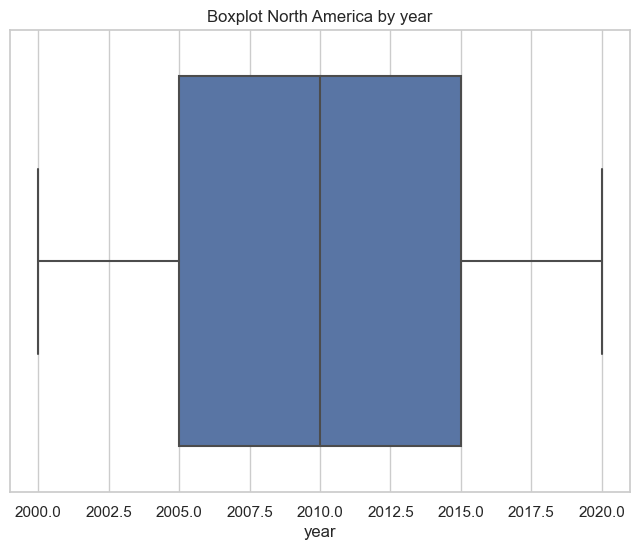

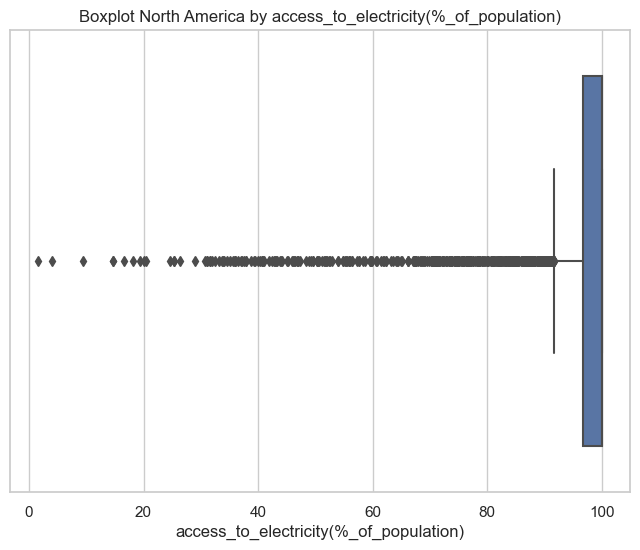

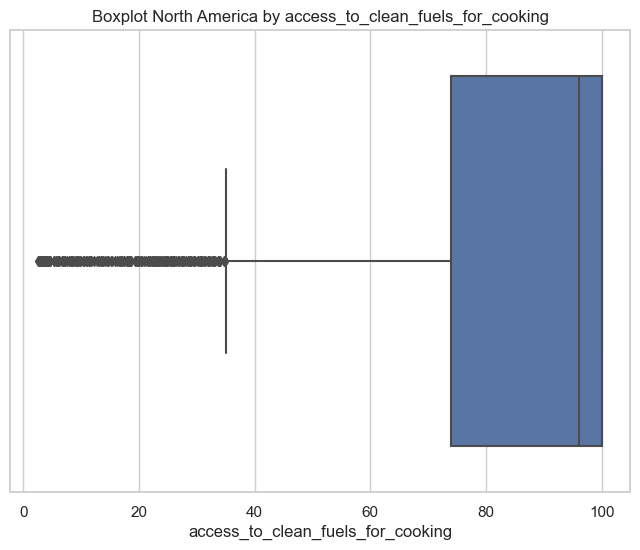

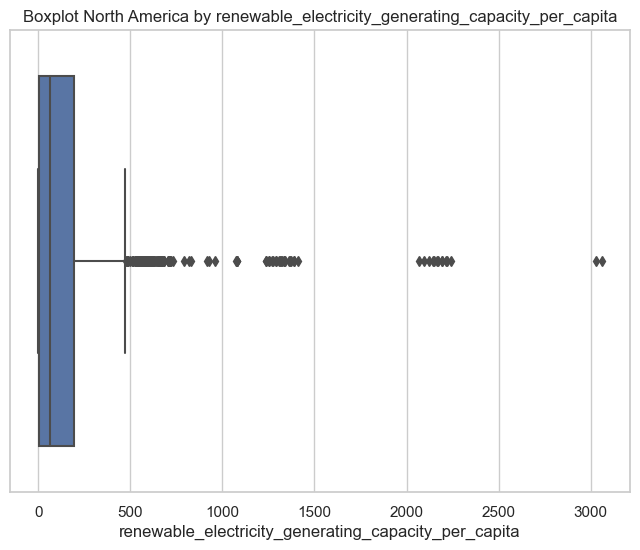

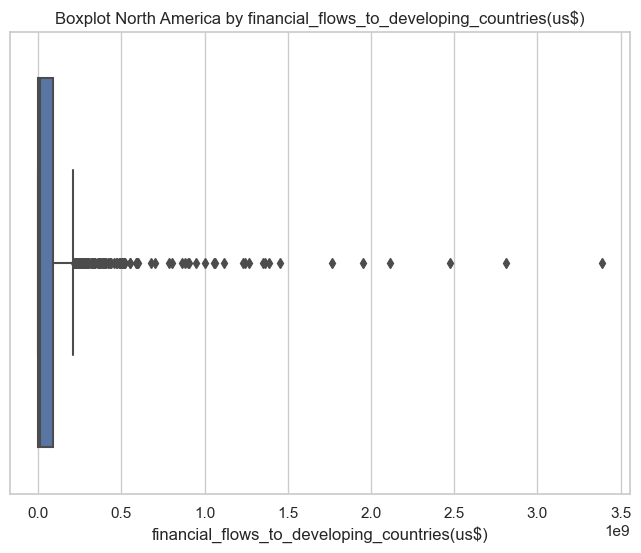

...

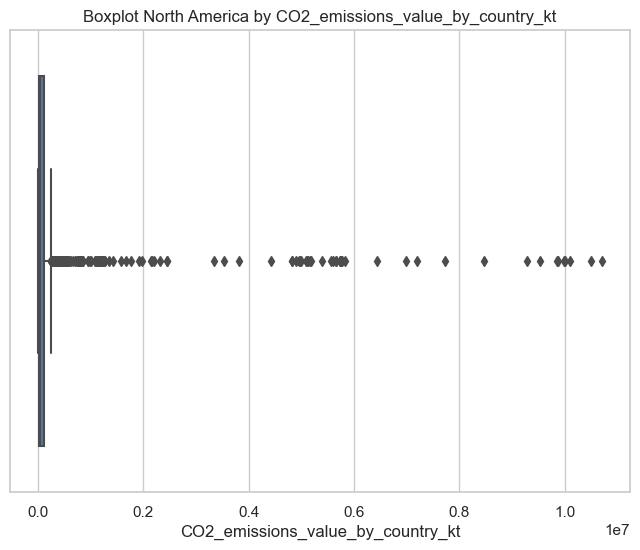

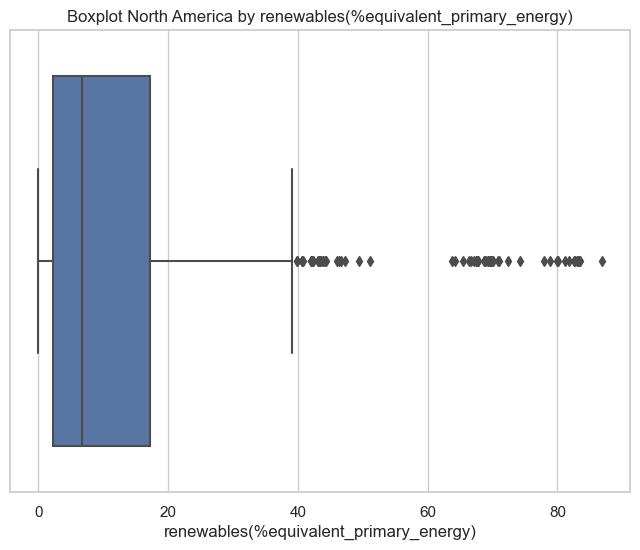

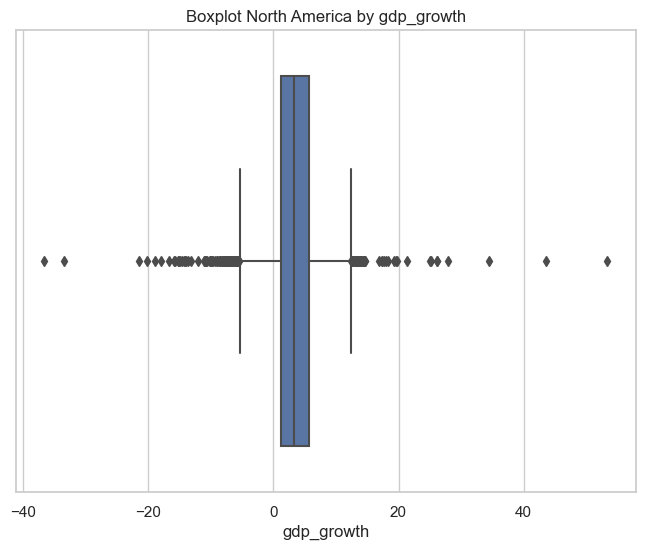

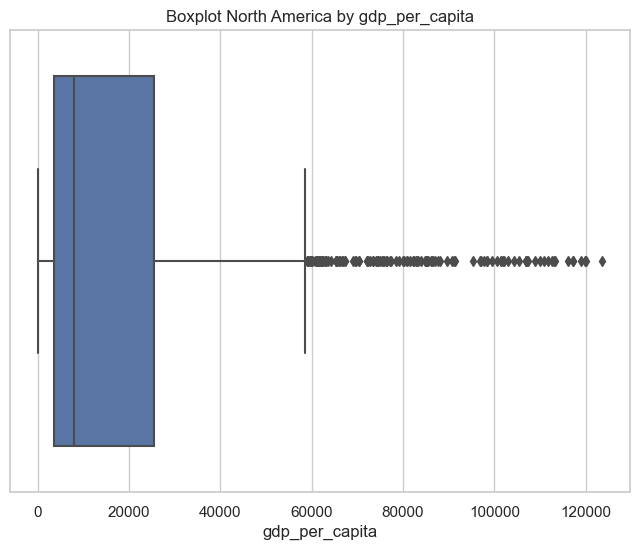

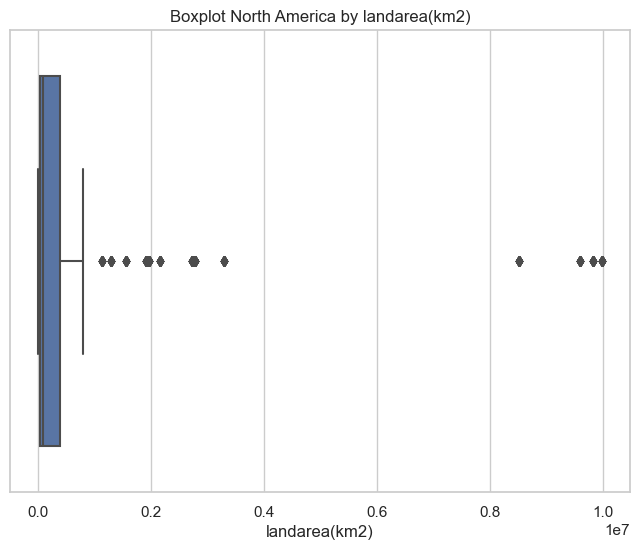

In [531]:
#CHECKING OUTLIERS
for col in df_num_north_america.columns:
    # Crea un nuevo subplot para cada gráfico
    fig, ax = plt.subplots(figsize=(8, 6))
    # Crea el gráfico de boxplot utilizando seaborn
    sns.boxplot(x=df[col], ax=ax)
    # Establece el título de cada gráfico
    ax.set_title('Boxplot North America by {}'.format(col))
    # Muestra cada gráfico
    plt.show()

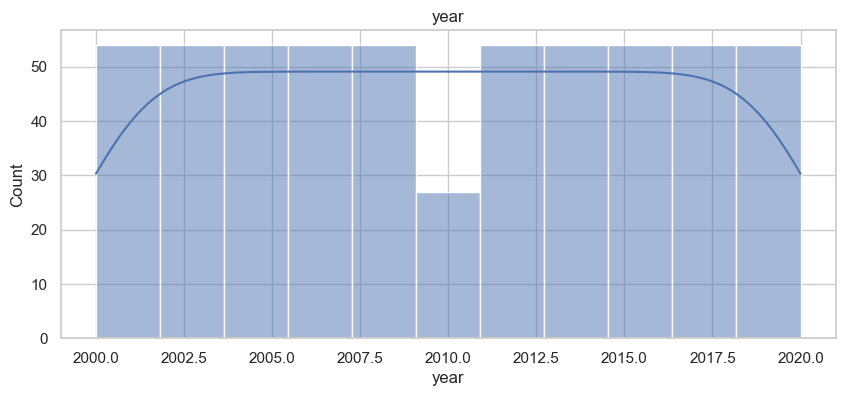

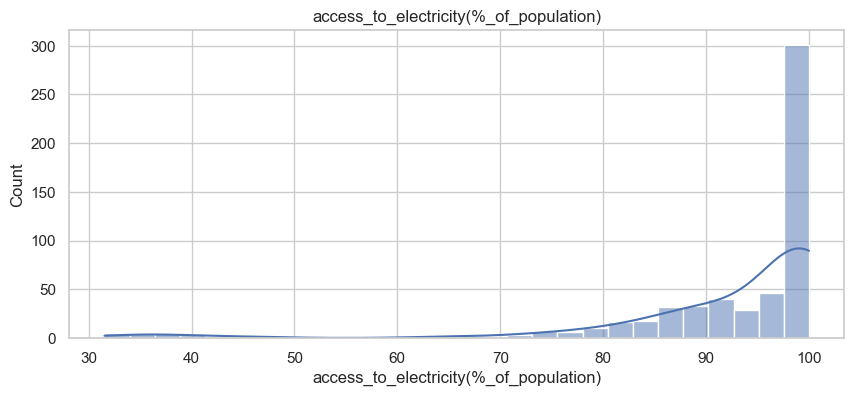

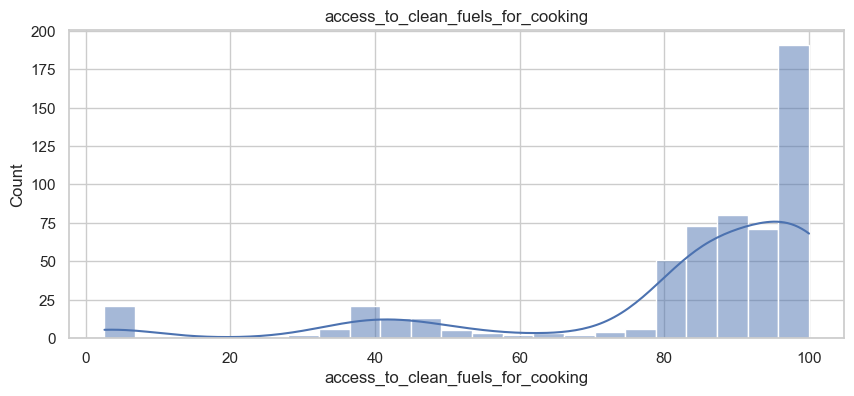

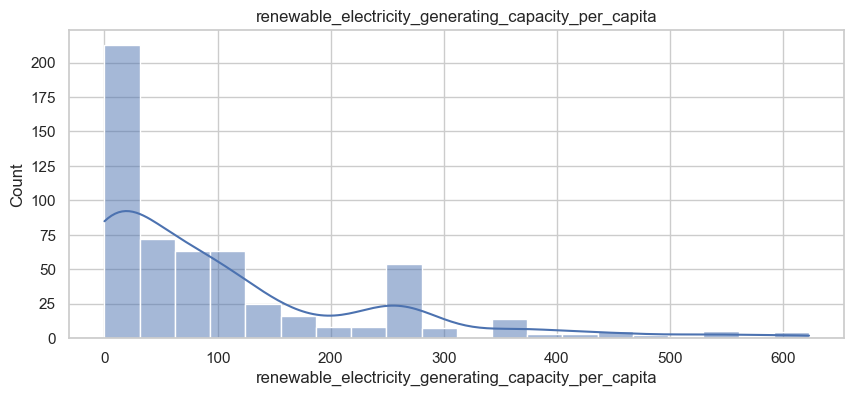

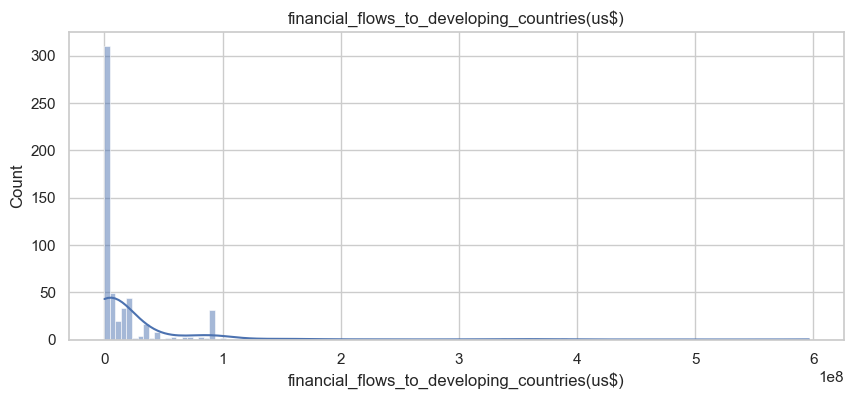

...

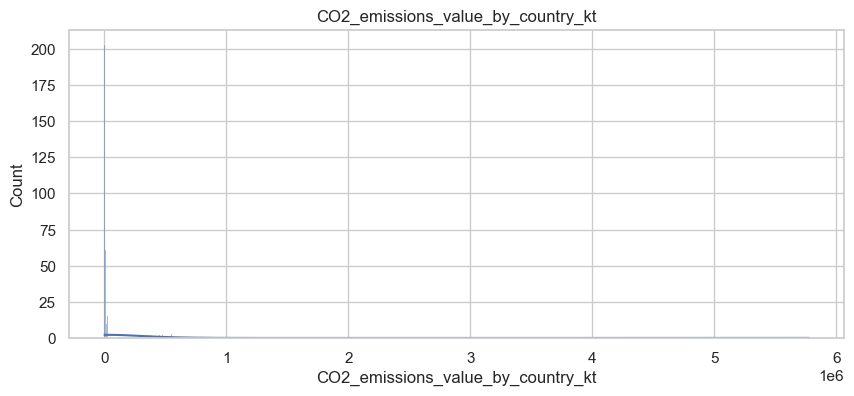

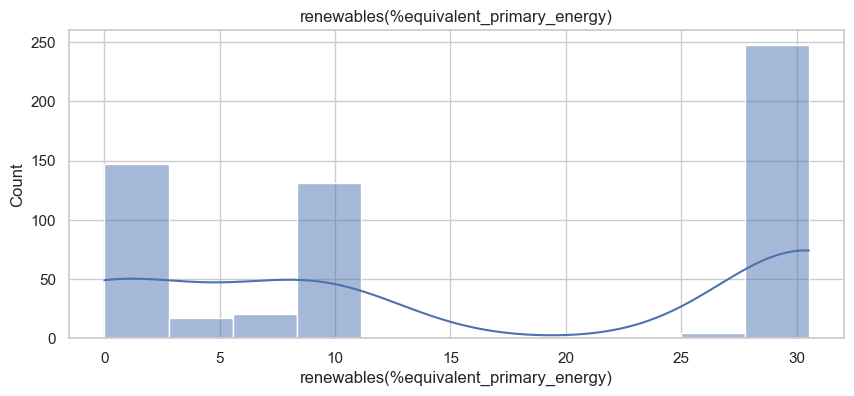

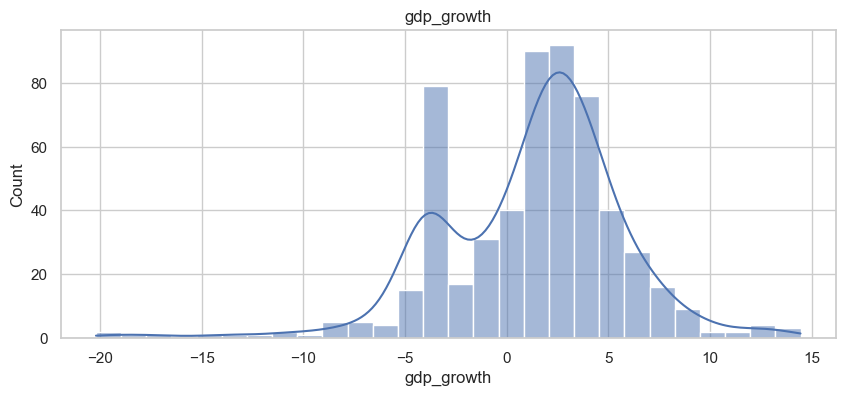

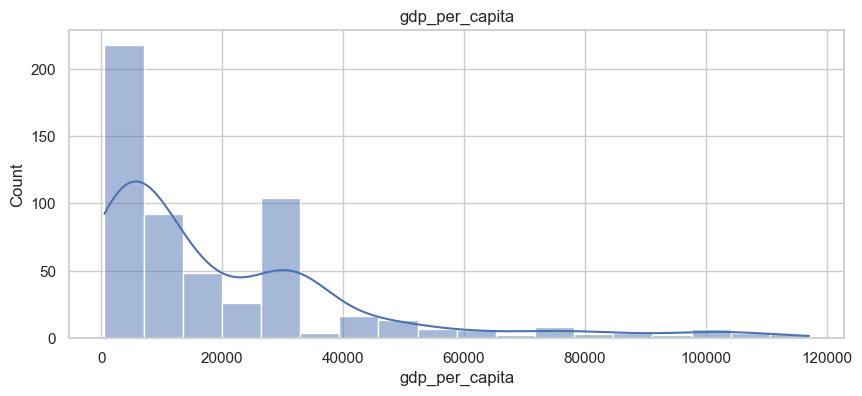

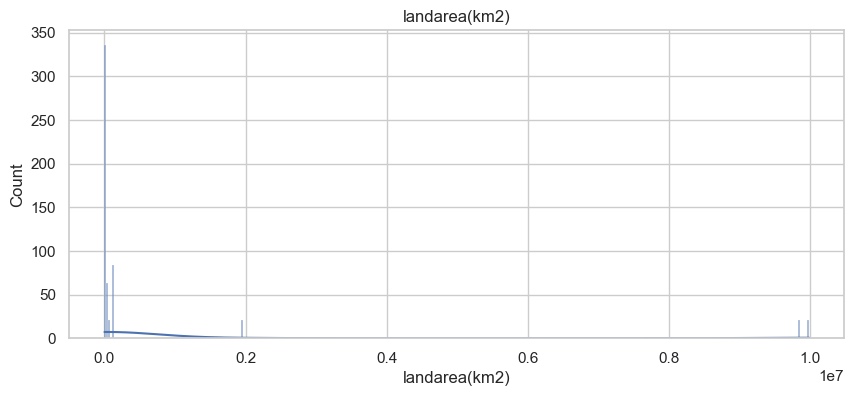

In [532]:
#CHECKING DISTRIBUTION
for c in df_num_north_america.columns:
    plt.figure(figsize=(10,4))
    sns.histplot(df_num_north_america[c], kde= True)
    plt.title(c)
    plt.show()

In [533]:
continent_data['South America'].head(5)

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),continent
105,Argentina,2000,95.783290,95.00,235.62,NaN,9.85,50.37,5.99,28.89,40.914955,18849.810,3.69,132270.0000,12.283858,-0.788999,7708.099115,17,2780400.0,South America
106,Argentina,2001,95.511060,95.60,234.09,3890000.0,11.51,42.91,6.54,37.04,50.387330,18210.120,3.59,125260.0000,15.937488,-4.408840,7208.373114,17,2780400.0,South America
107,Argentina,2002,96.228870,96.10,236.78,NaN,11.62,39.70,5.39,36.06,51.078250,17275.256,3.99,117470.0012,16.249306,-10.894485,2593.404563,17,2780400.0,South America
108,Argentina,2003,96.442635,96.45,234.82,50000.0,10.82,46.73,7.03,34.38,46.982075,18326.521,3.97,127660.0037,14.408259,8.837041,3349.806300,17,2780400.0,South America
109,Argentina,2004,96.653500,97.20,236.15,40960000.0,9.29,57.35,7.31,31.03,40.066883,19261.457,4.04,141380.0049,12.185576,9.029573,4277.721573,17,2780400.0,South America


In [534]:
continent_data['South America'].shape

(211, 20)

In [535]:
continent_data['South America'].isnull().sum().sort_values(ascending=False)

renewables(%equivalent_primary_energy)                             85
financial_flows_to_developing_countries(us$)                       60
electricity_from_nuclear(twh)                                      21
CO2_emissions_value_by_country_kt                                  11
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)           11
renewable_energy_share_in_the_total_final_energy_consumption(%)    10
access_to_electricity(%_of_population)                              1
access_to_clean_fuels_for_cooking                                   1
landarea(km2)                                                       1
density(P/km2)                                                      1
gdp_per_capita                                                      1
gdp_growth                                                          1
entity                                                              0
low_carbonelectricity(%electricity)                                 0
primary_energy_consu

In [536]:
continent_data['South America'] = continent_data['South America'].interpolate(method='pad')

In [537]:
continent_data['South America'].isnull().sum().sort_values(ascending=False)

financial_flows_to_developing_countries(us$)                       1
entity                                                             0
primary_energy_consumption_per_capita(kwh/person)                  0
landarea(km2)                                                      0
density(P/km2)                                                     0
gdp_per_capita                                                     0
gdp_growth                                                         0
renewables(%equivalent_primary_energy)                             0
CO2_emissions_value_by_country_kt                                  0
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)           0
low_carbonelectricity(%electricity)                                0
year                                                               0
electricity_from_renewables(twh)                                   0
electricity_from_nuclear(twh)                                      0
electricity_from_fossil_fuels(twh)

In [538]:
continent_data['South America']['financial_flows_to_developing_countries(us$)'].fillna(0, inplace=True)

In [586]:
#Save numerical data of Asia
df_num_south_america= continent_data['South America'].select_dtypes(exclude=["object"])
df_num_south_america.head(5)

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
105,2000,95.783290,95.00,235.62,0.0,9.85,50.37,5.99,28.89,40.914955,18849.810,3.69,132270.0000,12.283858,-0.788999,7708.099115,2780400.0
106,2001,95.511060,95.60,234.09,3890000.0,11.51,42.91,6.54,37.04,50.387330,18210.120,3.59,125260.0000,15.937488,-4.408840,7208.373114,2780400.0
107,2002,96.228870,96.10,236.78,3890000.0,11.62,39.70,5.39,36.06,51.078250,17275.256,3.99,117470.0012,16.249306,-10.894485,2593.404563,2780400.0
108,2003,96.442635,96.45,234.82,50000.0,10.82,46.73,7.03,34.38,46.982075,18326.521,3.97,127660.0037,14.408259,8.837041,3349.806300,2780400.0
109,2004,96.653500,97.20,236.15,40960000.0,9.29,57.35,7.31,31.03,40.066883,19261.457,4.04,141380.0049,12.185576,9.029573,4277.721573,2780400.0


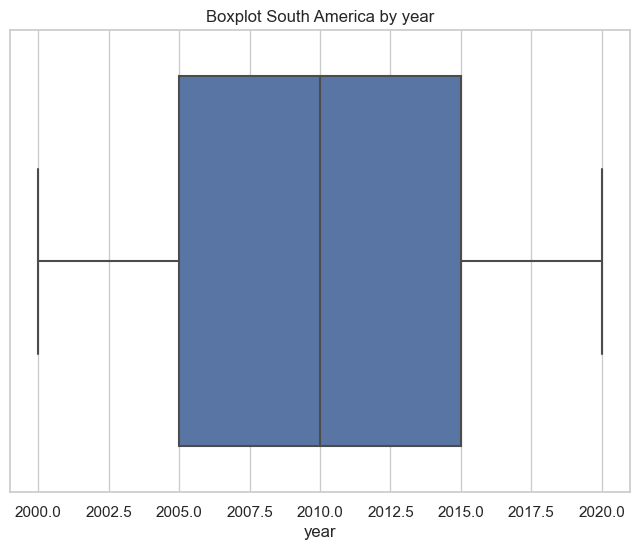

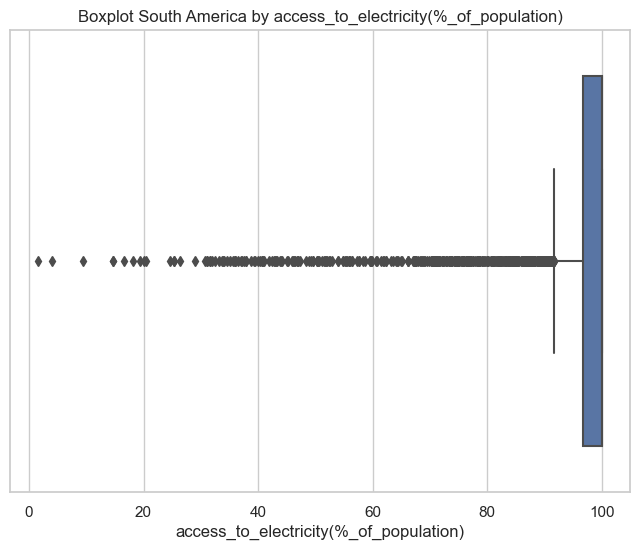

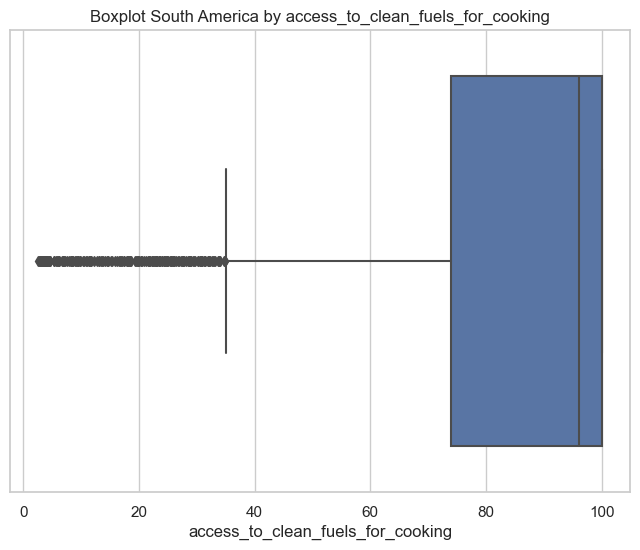

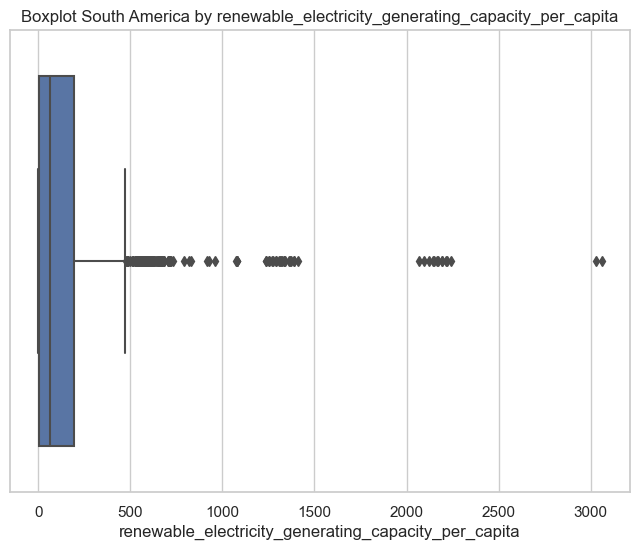

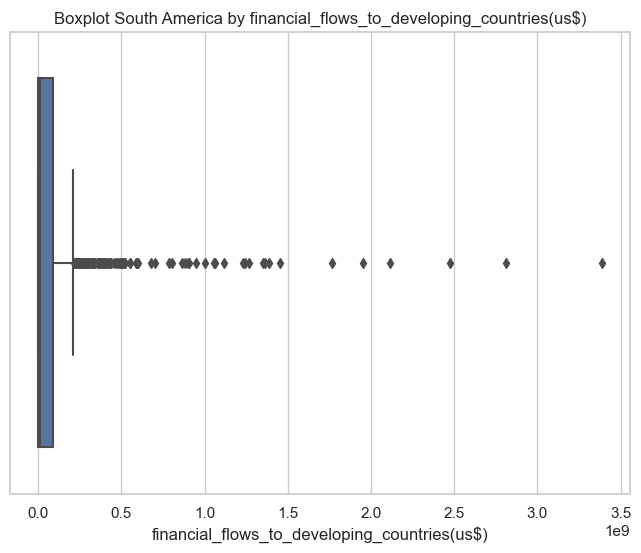

...

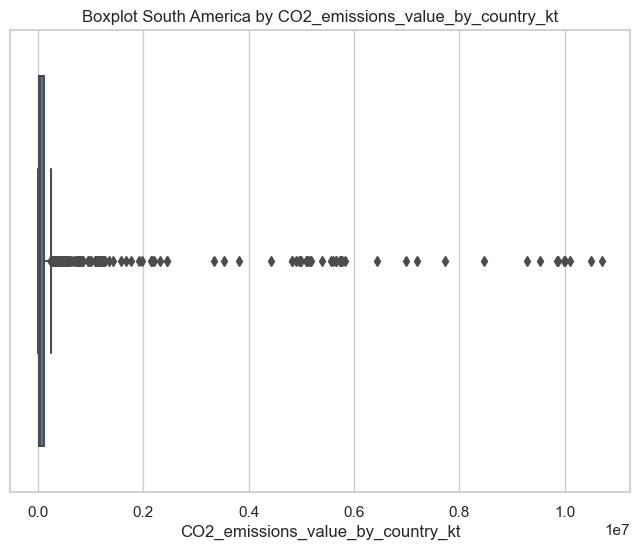

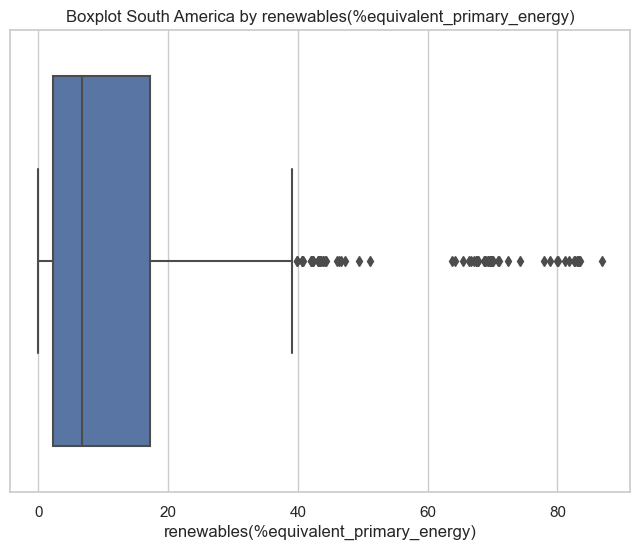

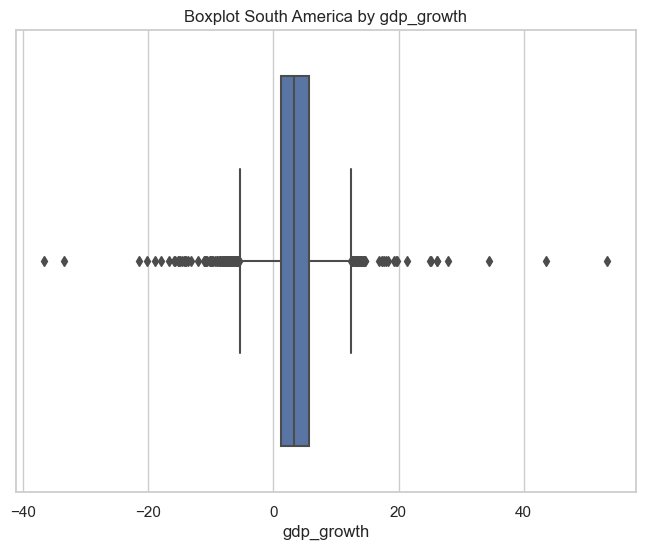

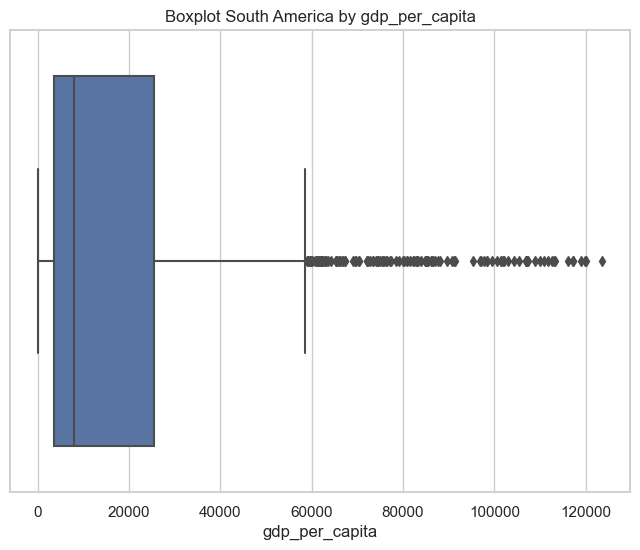

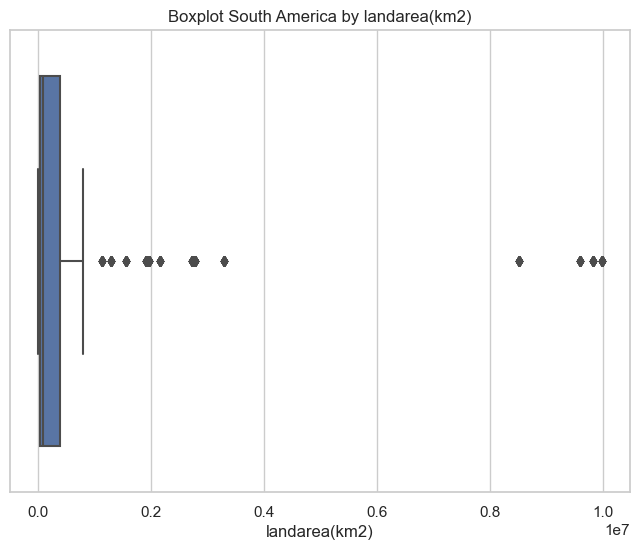

In [540]:
#CHECKING OUTLIERS
for col in df_num_south_america.columns:
    # Crea un nuevo subplot para cada gráfico
    fig, ax = plt.subplots(figsize=(8, 6))
    # Crea el gráfico de boxplot utilizando seaborn
    sns.boxplot(x=df[col], ax=ax)
    # Establece el título de cada gráfico
    ax.set_title('Boxplot South America by {}'.format(col))
    # Muestra cada gráfico
    plt.show()

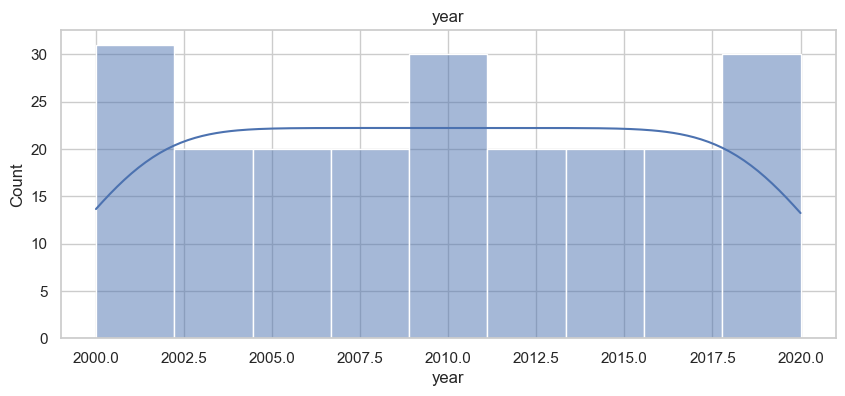

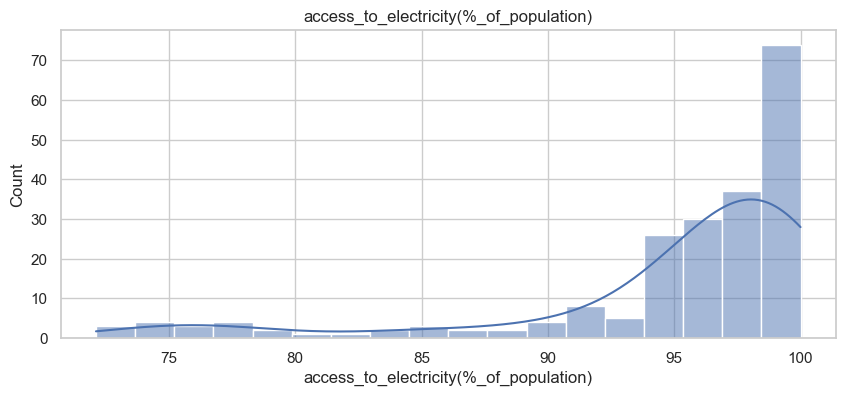

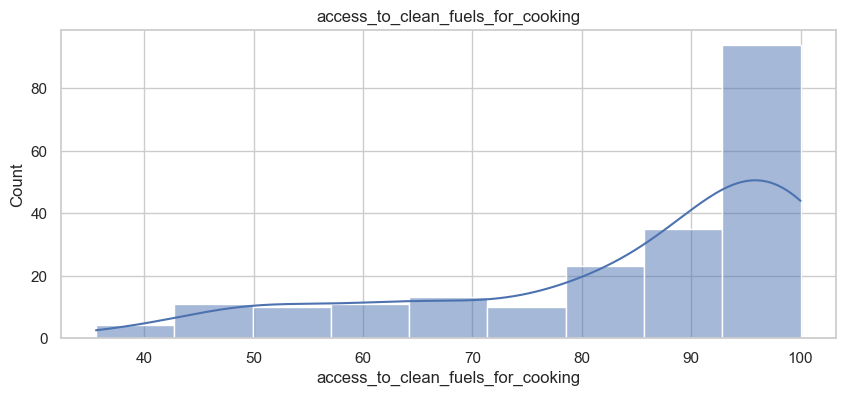

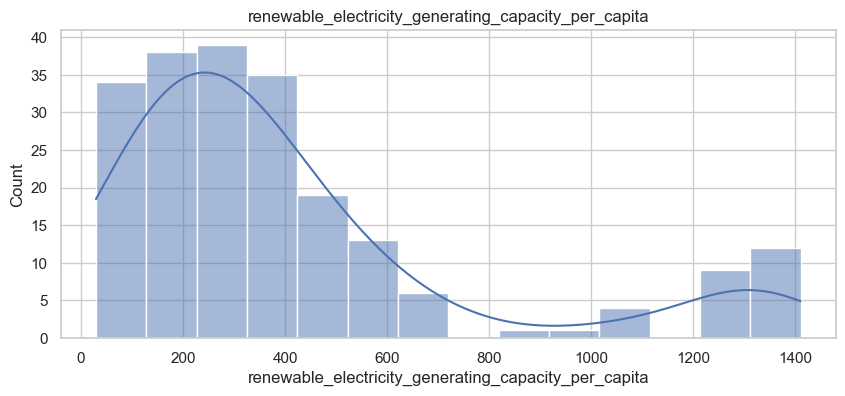

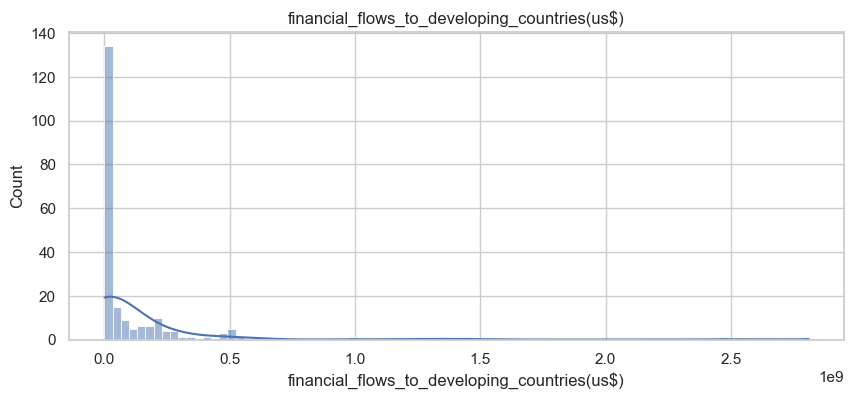

...

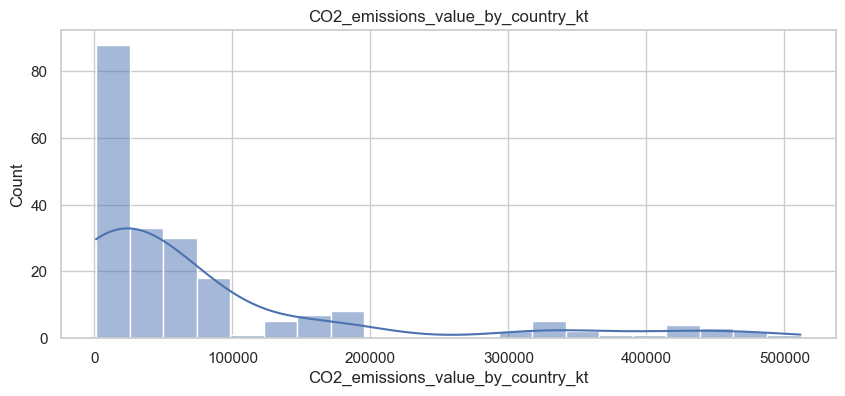

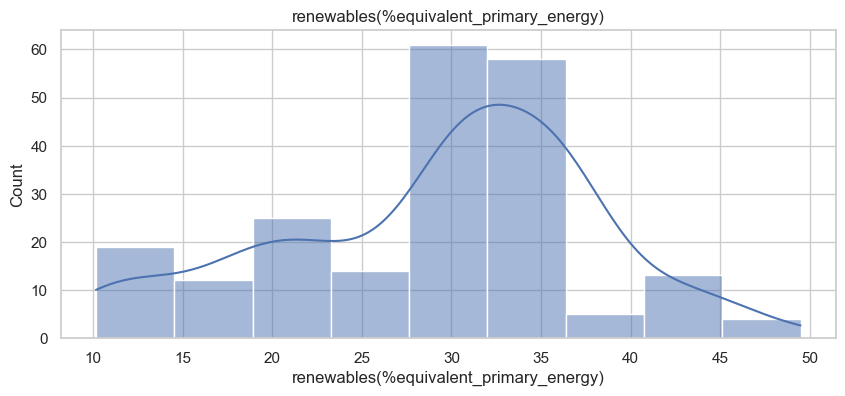

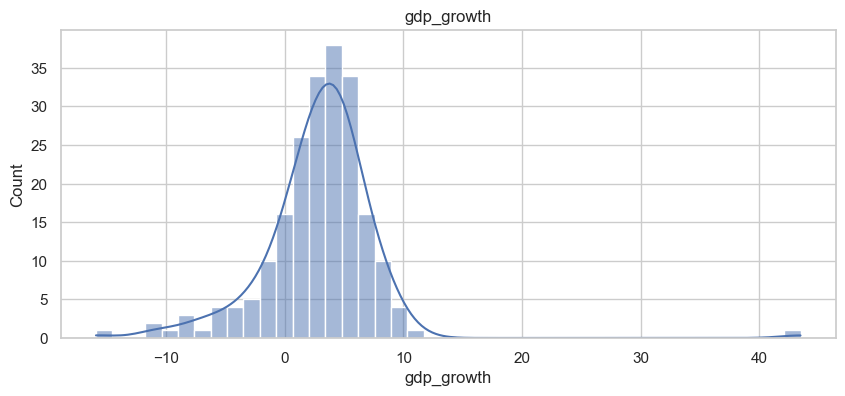

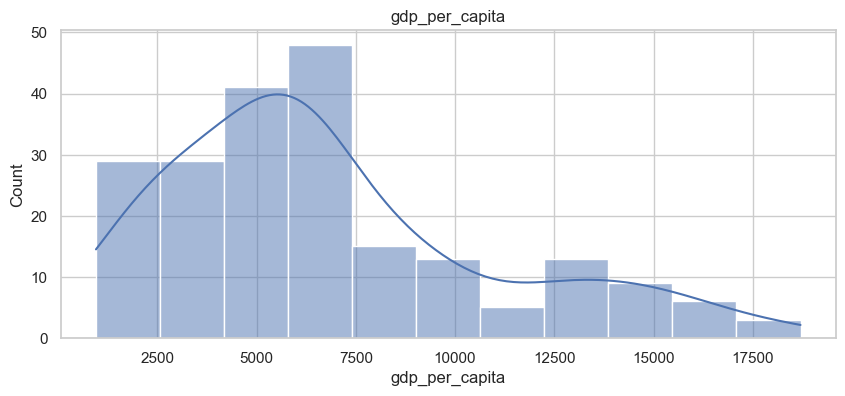

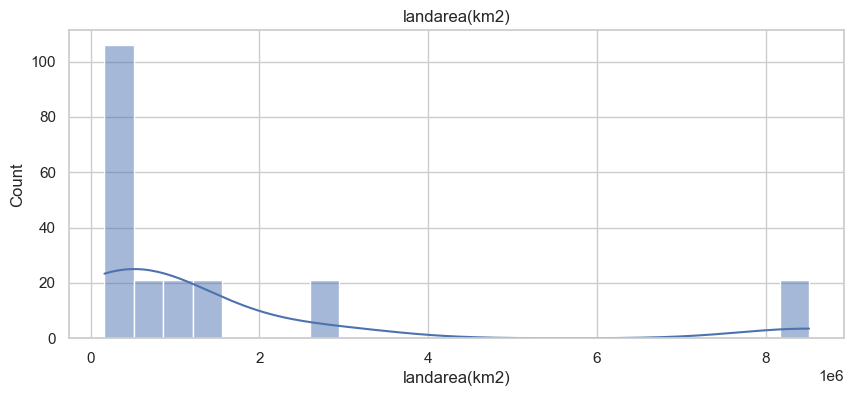

In [541]:
#CHECKING DISTRIBUTION
for c in df_num_south_america.columns:
    plt.figure(figsize=(10,4))
    sns.histplot(df_num_south_america[c], kde= True)
    plt.title(c)
    plt.show()

In [542]:
#Comparison of general statistics of developed and undeveloped countries

In [543]:
df_num_europe.describe()

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
count,763.00000,763.000000,763.000000,763.0,763.0,763.000000,763.000000,763.000000,763.000000,763.000000,763.000000,763.000000,763.000000,763.000000,763.000000,763.000000,763.000000
mean,2010.12844,99.981129,93.207208,0.0,0.0,19.317562,48.174312,27.969607,25.303159,49.372587,44210.969233,4.546501,106907.784899,13.861321,1.879952,28176.672033,163231.055046
std,6.03309,0.133596,15.455930,0.0,0.0,16.230322,79.439466,73.085619,38.363014,30.038828,28823.516551,2.313840,163332.797851,17.628652,4.162349,24575.676710,171894.594116
min,2000.00000,97.700000,38.200000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,8635.532000,1.320000,0.000000,0.000000,-15.306894,658.348608,316.000000
25%,2005.00000,100.000000,100.000000,0.0,0.0,7.430000,3.750000,0.000000,2.970000,25.060795,26771.296000,3.095000,11129.999830,1.936145,0.476020,7720.510572,43094.000000
50%,2010.00000,100.000000,100.000000,0.0,0.0,16.310000,19.970000,0.000000,8.540000,49.702663,36881.977000,3.890000,44959.999080,7.619621,2.269487,21083.277150,83871.000000
75%,2015.00000,100.000000,100.000000,0.0,0.0,25.290000,47.975000,23.090000,28.405000,69.311150,50603.181500,5.340000,100315.002450,18.366333,4.004610,43749.049040,243610.000000
max,2020.00000,100.000000,100.000000,0.0,0.0,81.070000,402.400000,451.530000,251.480000,100.000000,188294.000000,15.780000,847680.000000,86.836586,25.176245,123514.196700,643801.000000


In [544]:
df_num_south_america.describe()

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
count,211.000000,211.000000,211.000000,211.000000,2.110000e+02,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,2.110000e+02
mean,2009.952607,94.909058,84.102607,407.628246,1.177523e+08,32.320142,21.702844,3.296919,60.482891,60.880731,15559.032864,3.397630,78358.056732,29.222492,2.876778,6781.960312,1.566064e+06
std,6.094309,6.642774,17.304756,361.159236,3.224945e+08,16.456433,29.913366,5.395672,118.431827,27.034127,5742.932373,0.720454,117395.860239,8.874942,4.917957,4108.842005,2.438872e+06
min,2000.000000,72.113110,35.600000,29.400000,0.000000e+00,7.650000,0.000000,0.000000,0.000000,0.000000,5345.900400,2.140000,1120.000005,10.167007,-15.907951,954.400318,1.638200e+05
25%,2005.000000,94.480274,75.250000,172.795000,4.600000e+05,18.305000,0.870000,0.000000,7.230000,41.926115,9918.690500,2.790000,4550.000191,22.571669,1.115547,3745.501842,2.149690e+05
50%,2010.000000,97.194930,91.200000,300.290000,5.030000e+06,30.420000,8.360000,0.000000,22.500000,60.827293,16220.931000,3.360000,38290.000920,30.744228,3.283446,5919.012338,4.067520e+05
75%,2015.000000,99.097675,99.000000,467.900000,9.778500e+07,43.025000,32.355000,6.525000,44.565000,83.380697,21089.465000,3.855000,79715.000155,36.035774,5.230067,8762.026548,1.285216e+06
max,2020.000000,100.000000,100.000000,1410.110000,2.811680e+09,70.410000,136.580000,15.170000,520.010000,100.000000,25234.633000,6.250000,511619.995100,49.471880,43.479556,18703.860290,8.515770e+06


In [545]:
df_num_asia.describe()

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
count,819.000000,819.000000,819.000000,819.000000,8.190000e+02,819.000000,819.000000,819.000000,819.000000,819.000000,819.00000,819.000000,8.190000e+02,819.000000,819.000000,819.000000,8.190000e+02
mean,2010.000000,89.540016,70.617277,167.388669,1.099556e+08,20.984762,161.661331,9.334151,38.174103,25.889534,36163.68892,5.803985,3.540682e+05,4.477346,4.630280,11352.759007,7.493200e+05
std,6.059001,18.919985,31.708110,346.710720,2.395457e+08,26.365989,571.158550,41.483333,179.314413,32.790328,50354.61042,4.048257,1.313613e+06,4.951117,5.880122,15502.219185,1.626458e+06
min,2000.000000,1.613591,2.900000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,204.23125,1.200000,2.100000e+02,0.000000,-36.658153,0.000000,2.980000e+02
25%,2005.000000,87.550000,42.450000,7.095000,8.100000e+05,1.115000,3.175000,0.000000,0.040000,0.109167,5777.91030,3.445000,1.240500e+04,0.040307,2.175678,1286.232553,3.839400e+04
50%,2010.000000,99.604300,82.900000,55.080000,1.117000e+07,6.490000,21.950000,0.000000,2.240000,10.663012,16075.37400,4.820000,6.055000e+04,2.907140,5.007683,4021.743306,1.999510e+05
75%,2015.000000,100.000000,100.000000,120.570000,1.200950e+08,34.405000,73.460000,0.000000,11.510000,37.677067,36441.39650,6.660000,1.502500e+05,7.163172,7.298275,16551.940215,6.522300e+05
max,2020.000000,100.000000,100.000000,3060.190000,3.386850e+09,93.460000,5184.130000,366.200000,2184.940000,100.000010,262585.70000,32.570000,1.070722e+07,24.803470,53.381794,85075.986540,9.596960e+06


## SOSTENIBILIDAD PAISES DESARROLLADOS VS NO DESARROLLADOS

El Objetivo de Desarrollo Sostenible 7 (Objetivo 7 o ODS 7) trata sobre alianzas para los objetivos y es uno de los 17 Objetivos de Desarrollo Sostenible (ODS) establecidos por las Naciones Unidas en 2015.

- El ODS 7 es: "Garantizar el acceso a una energía asequible, segura, sostenible y moderna para todos". El Objetivo tiene metas que deben alcanzarse para 2030. El progreso hacia las metas se medirá mediante indicadores.

El principal problema que busca erradicar es la contaminación a causa de las energías fósiles y la ineficacia de los gobiernos para implementar energías limpias y renovables​

El acceso a fuentes de energía modernas y sostenibles es esencial no solo para hacer frente al cambio climático, sino también para el crecimiento económico de los países.

La combinación de energía primaria de la región está dominada por los combustibles fósiles, y el carbón, el petróleo y el gas natural representan más del 80% del consumo total. Esta dependencia de los combustibles fósiles ha provocado altos niveles de emisiones de CO2, que contribuyen al cambio climático.

En los últimos años, ha habido una creciente conciencia sobre la necesidad de reducir las emisiones de CO2 en el Sudeste Asiático. Los gobiernos de toda la región han fijado objetivos ambiciosos para el despliegue de energía renovable y hay una inversión creciente en medidas de eficiencia energética.

Este análisis examinará las tendencias en el consumo de electricidad, el consumo de energía primaria y las emisiones de CO2 DE 4 continentes.

In [546]:
# concatenamos todos los dataframes en uno, recordando que cada dataframde esta dividdo por continente y ademas tien su data numerica en su respectivo dataset
dataframes = [continent_data['Europe'], continent_data['Asia'], continent_data['North America'], continent_data['South America']]

In [547]:
df_all = pd.concat(dataframes, ignore_index=True)

In [548]:
df_all.head()

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),continent
0,Albania,2000,100.0,38.2,0.0,0.0,0.0,0.14,0.0,4.55,97.014930,9029.4375,4.13,3170.000000,0.0,6.946217,1126.683340,105,28748.0,Europe
1,Albania,2001,100.0,40.5,0.0,0.0,0.0,0.13,0.0,3.52,96.438354,8635.5320,3.89,3230.000000,0.0,8.293313,1281.659826,105,28748.0,Europe
2,Albania,2002,100.0,43.2,0.0,0.0,0.0,0.16,0.0,3.48,95.604390,9443.5550,4.10,3759.999990,0.0,4.536524,1425.124219,105,28748.0,Europe
3,Albania,2003,100.0,46.4,0.0,0.0,0.0,0.10,0.0,5.12,98.084300,10756.6120,3.80,4070.000172,0.0,5.528637,1846.120121,105,28748.0,Europe
4,Albania,2004,100.0,49.0,0.0,0.0,0.0,0.13,0.0,5.41,97.653430,11586.9510,3.96,4250.000000,0.0,5.514668,2373.581292,105,28748.0,Europe


In [549]:
df_all.shape

(2360, 20)

In [590]:
df_all.isnull().sum().sort_values(ascending=False)

entity                                                             0
year                                                               0
landarea(km2)                                                      0
density(P/km2)                                                     0
gdp_per_capita                                                     0
gdp_growth                                                         0
renewables(%equivalent_primary_energy)                             0
CO2_emissions_value_by_country_kt                                  0
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)           0
primary_energy_consumption_per_capita(kwh/person)                  0
low_carbonelectricity(%electricity)                                0
electricity_from_renewables(twh)                                   0
electricity_from_nuclear(twh)                                      0
electricity_from_fossil_fuels(twh)                                 0
renewable_energy_share_in_the_tota

# PRIMARY ENERGY COMSUPTION ANALASYS AND ENERGY COMSUPTION TRENDS

## CONSUMO DE ENERGIA POR CONTINENTE

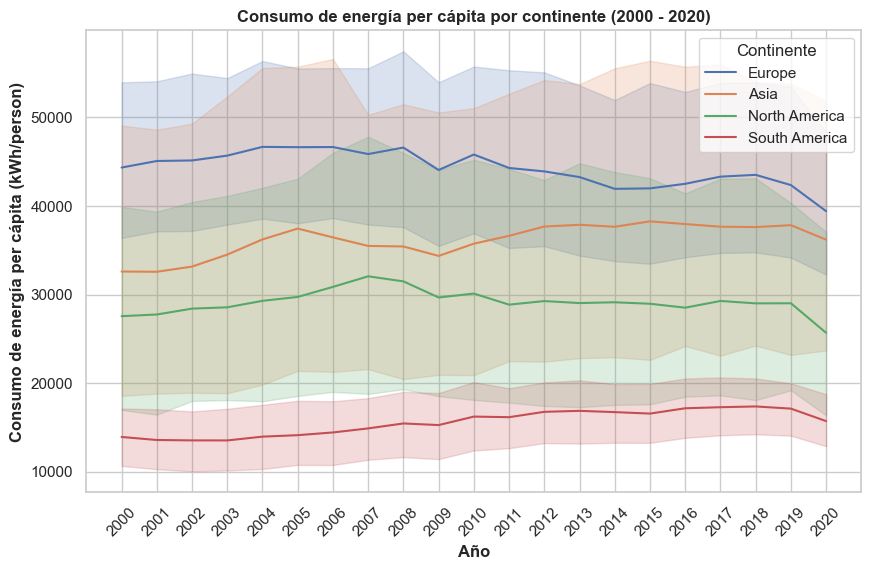

In [551]:
import matplotlib.pyplot as plt
import seaborn as sns

# Establecer el estilo de gráfico
sns.set(style='whitegrid')

# Crear un gráfico de líneas para cada continente
plt.figure(figsize=(10, 6))

# Iterar a través de los nombres únicos de los continentes en df_all
for continente in df_all['continent'].unique():
    df_continente = df_all[df_all['continent'] == continente]
    
    # Crear el gráfico de líneas para el continente actual
    sns.lineplot(data=df_continente, x='year', y='primary_energy_consumption_per_capita(kwh/person)', label=continente)

# Personalizar el diseño del gráfico
plt.xlabel('Año', fontweight='bold')
plt.ylabel('Consumo de energía per cápita (kWh/person)', fontweight='bold')
plt.title('Consumo de energía per cápita por continente (2000 - 2020)', fontweight='bold')
plt.legend(title='Continente')
plt.xticks(rotation=45, ticks=df_all['year'].unique())
# Mostrar el gráfico
plt.show()

The above graph clearly shows the trends in per capita egergy consumption by continent. The graphs are quite different from each other.

Top continents in terms of energy consumption:

Europe
Asia
North America
South America

Europe has the highest rates, which is quite expected, however, it can be seen that since 2008 the amount of energy consumption per capita has been gradually decreasing as in North America, while the countries of Asia have moderately increasing rates, and perhaps soon they will have the highest rates, thereby overtaking the countries of Europe*

Mientras que asia y sudamerica hsan incrementado el consumo a partir de 2009.
Las tendencias en el consumo de energía per cápita pueden estar influenciadas por una variedad de factores económicos, sociales y ambientales. Aunque no puedo proporcionar datos específicos actualizados después de mi fecha de conocimiento en septiembre de 2021, puedo mencionar algunas posibles explicaciones generales para las tendencias observadas en Europa, América del Norte, Asia y Sudamérica:

Europa y América del Norte (Decrecimiento):

Mayor Eficiencia Energética: Estos continentes han estado trabajando en la mejora de la eficiencia energética, lo que significa que pueden lograr más producción y servicios con menos consumo de energía. La adopción de tecnologías más eficientes, la renovación de edificios y la modernización de infraestructuras pueden contribuir a un menor consumo de energía per cápita.

Cambio en la Composición de la Energía: La transición hacia fuentes de energía más limpias y renovables puede llevar a un menor consumo de energía per cápita, ya que estas fuentes pueden ser más eficientes y menos intensivas en energía.

Políticas de Sostenibilidad: Europa y América del Norte a menudo tienen políticas más estrictas en cuanto a sostenibilidad y reducción de emisiones. Esto puede llevar a una menor demanda de energía en ciertos sectores y promover prácticas de consumo más sostenibles.

Asia y Sudamérica (Crecimiento):

Crecimiento Económico: El crecimiento económico en estos continentes puede estar impulsando un aumento en el consumo de energía a medida que más personas acceden a servicios y tecnología que requieren energía.

Industrialización: La industrialización y el aumento de la producción manufacturera a menudo conducen a un aumento en el consumo de energía. Esto puede ser especialmente relevante en Asia, que es conocida por su rápido desarrollo industrial.

Urbanización: El aumento de la urbanización puede llevar a un mayor consumo de energía a medida que las personas se mudan a ciudades y utilizan más energía en el transporte y la vivienda.

Cambios en el Estilo de Vida: Cambios en el estilo de vida, como el aumento en la propiedad de automóviles y electrodomésticos, pueden aumentar el consumo de energía per cápita.

Disponibilidad de Recursos: La disponibilidad de recursos energéticos también puede influir en las tendencias de consumo. Por ejemplo, la presencia de recursos energéticos abundantes, como el petróleo o el gas natural, puede impulsar el consumo.

Es importante tener en cuenta que estas son explicaciones generales y que las tendencias en el consumo de energía son el resultado de una interacción compleja de múltiples factores. Cada región y país puede experimentar variaciones significativas en función de sus políticas, economía y desarrollo. Además, las tendencias pueden cambiar con el tiempo a medida que se implementan políticas y tecnologías nuevas. Por lo tanto, es importante examinar los datos específicos y considerar el contexto local para comprender completamente las tendencias en el consumo de energía.

## Electricity generated from fossil fuels 

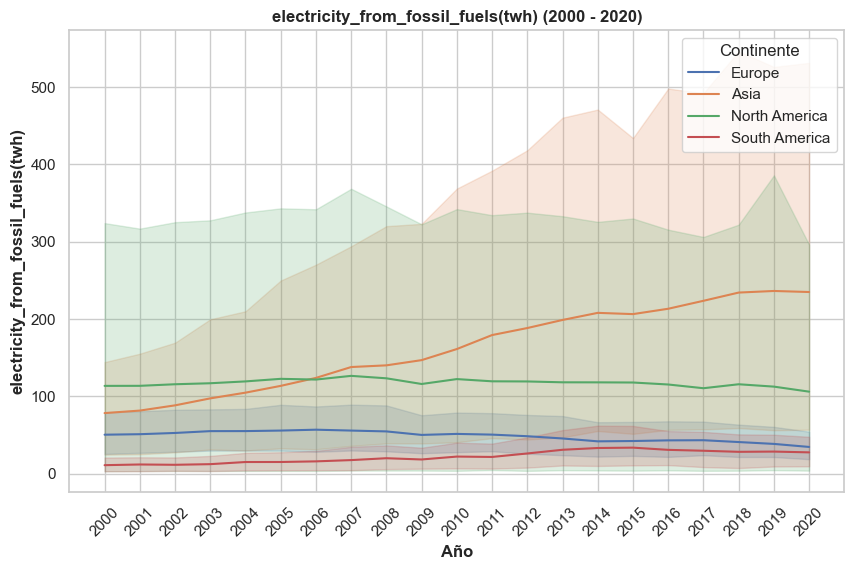

In [552]:
#import matplotlib.pyplot as plt
import seaborn as sns

# Establecer el estilo de gráfico
sns.set(style='whitegrid')

# Crear un gráfico de líneas para cada continente
plt.figure(figsize=(10, 6))

# Iterar a través de los nombres únicos de los continentes en df_all
for continente in df_all['continent'].unique():
    df_continente = df_all[df_all['continent'] == continente]
    
    # Crear el gráfico de líneas para el continente actual
    sns.lineplot(data=df_continente, x='year', y='electricity_from_fossil_fuels(twh)', label=continente)

# Personalizar el diseño del gráfico
plt.xlabel('Año', fontweight='bold')
plt.ylabel('electricity_from_fossil_fuels(twh)', fontweight='bold')
plt.title('electricity_from_fossil_fuels(twh) (2000 - 2020)', fontweight='bold')
plt.legend(title='Continente')
plt.xticks(rotation=45, ticks=df_all['year'].unique())

# Mostrar el gráfico
plt.show()

 ## Electricity generated from nuclear

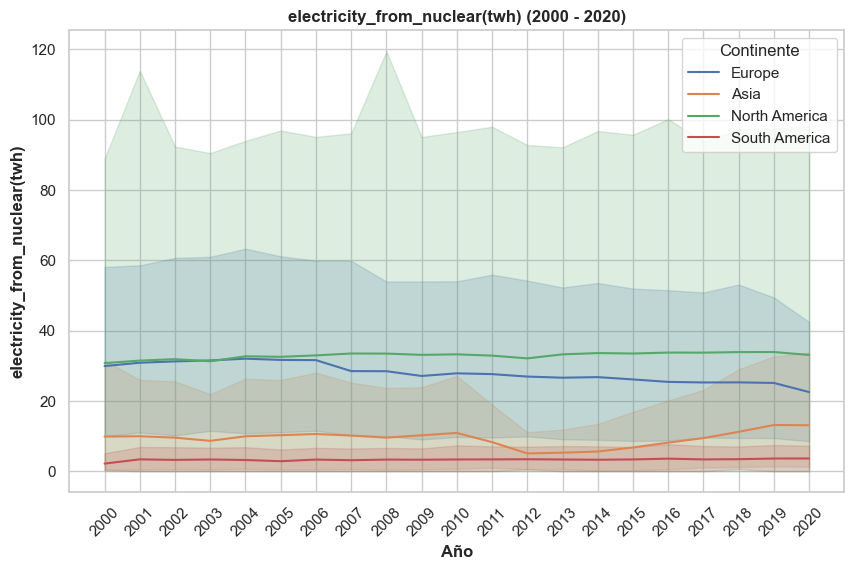

In [553]:
# Establecer el estilo de gráfico
sns.set(style='whitegrid')

# Crear un gráfico de líneas para cada continente
plt.figure(figsize=(10, 6))

# Iterar a través de los nombres únicos de los continentes en df_all
for continente in df_all['continent'].unique():
    df_continente = df_all[df_all['continent'] == continente]
    
    # Crear el gráfico de líneas para el continente actual
    sns.lineplot(data=df_continente, x='year', y='electricity_from_nuclear(twh)', label=continente)

# Personalizar el diseño del gráfico
plt.xlabel('Año', fontweight='bold')
plt.ylabel('electricity_from_nuclear(twh)', fontweight='bold')
plt.title('electricity_from_nuclear(twh) (2000 - 2020)', fontweight='bold')
plt.legend(title='Continente')
plt.xticks(rotation=45, ticks=df_all['year'].unique())

# Mostrar el gráfico
plt.show()

## Electricity generated from renewables

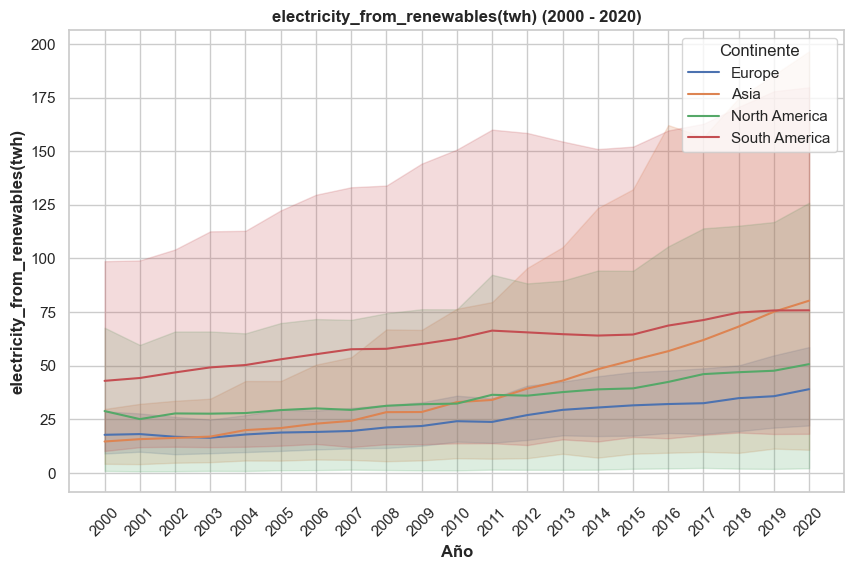

In [554]:
## Electricity generated from renewables
sns.set(style='whitegrid')

# Crear un gráfico de líneas para cada continente
plt.figure(figsize=(10, 6))

# Iterar a través de los nombres únicos de los continentes en df_all
for continente in df_all['continent'].unique():
    df_continente = df_all[df_all['continent'] == continente]
    
    # Crear el gráfico de líneas para el continente actual
    sns.lineplot(data=df_continente, x='year', y='electricity_from_renewables(twh)', label=continente)

# Personalizar el diseño del gráfico
plt.xlabel('Año', fontweight='bold')
plt.ylabel('electricity_from_renewables(twh)', fontweight='bold')
plt.title('electricity_from_renewables(twh) (2000 - 2020)', fontweight='bold')
plt.legend(title='Continente')
plt.xticks(rotation=45, ticks=df_all['year'].unique())
plt.show()

### Top 10 countries of  energy primary energy consumption  per capita as of 2020

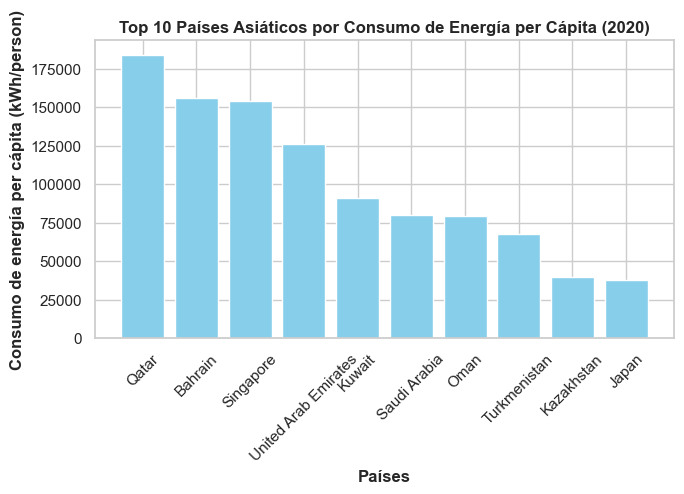

In [555]:
import matplotlib.pyplot as plt

# Filtrar los datos para incluir solo países de Asia en el año 2020
asia_2020 = df_all[(df_all['continent'] == 'Asia') & (df_all['year'] == 2020)]

# Ordenar los países por consumo de energía per cápita en orden descendente
top_10_asian_countries = asia_2020.sort_values(by='primary_energy_consumption_per_capita(kwh/person)', ascending=False).head(10)

# Crear un gráfico de barras
plt.figure(figsize=(7, 5))
plt.bar(top_10_asian_countries['entity'], top_10_asian_countries['primary_energy_consumption_per_capita(kwh/person)'], color='skyblue')
plt.ylabel('Consumo de energía per cápita (kWh/person)', fontweight='bold')
plt.xlabel('Países', fontweight='bold')
plt.title('Top 10 Países Asiáticos por Consumo de Energía per Cápita (2020)', fontweight='bold')
plt.xticks(rotation=45)  # Rotar etiquetas del eje x para una mejor visualización

# Mostrar el gráfico
plt.tight_layout()
plt.show()

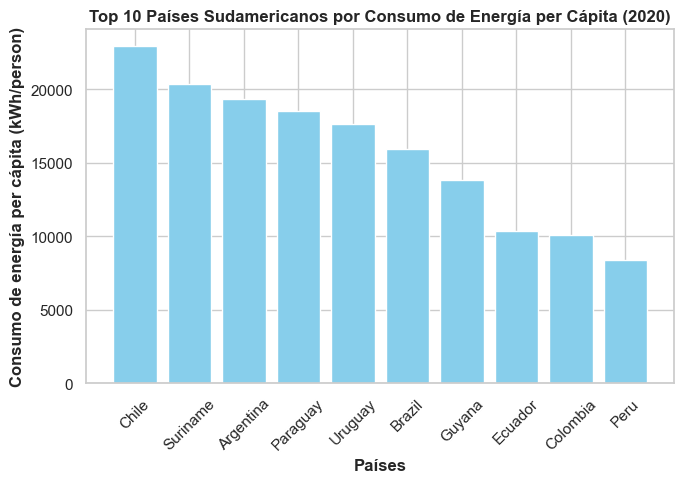

In [556]:
# Top 10 South America countries by energy consumption per capita as of 2020

sa_2020 = df_all[(df_all['continent'] == 'South America') & (df_all['year'] == 2020)]
top_10_sa = sa_2020.sort_values(by='primary_energy_consumption_per_capita(kwh/person)', ascending=False).head(10)
plt.figure(figsize=(7, 5))
plt.bar(top_10_sa['entity'], top_10_sa['primary_energy_consumption_per_capita(kwh/person)'], color='skyblue')
plt.ylabel('Consumo de energía per cápita (kWh/person)', fontweight='bold')
plt.xlabel('Países', fontweight='bold')
plt.title('Top 10 Países Sudamericanos por Consumo de Energía per Cápita (2020)', fontweight='bold')
plt.xticks(rotation=45)  
plt.tight_layout()
plt.show()

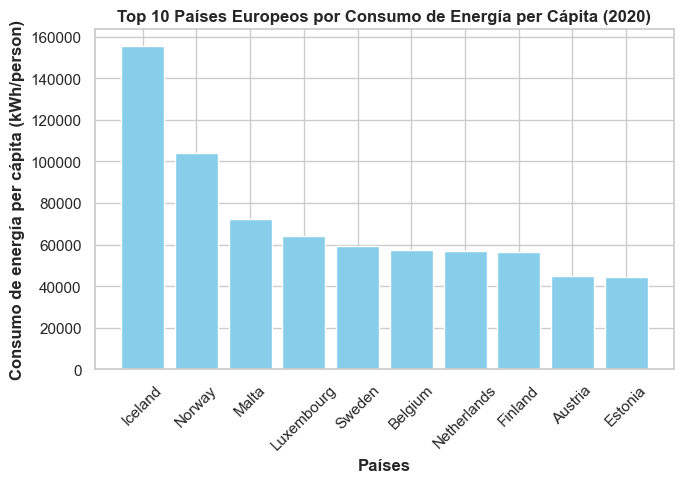

In [557]:
# Top 10 Europe countries by energy consumption per capita as of 2020
eu_2020 = df_all[(df_all['continent'] == 'Europe') & (df_all['year'] == 2020)]
top_10_eu = eu_2020.sort_values(by='primary_energy_consumption_per_capita(kwh/person)', ascending=False).head(10)
plt.figure(figsize=(7, 5))
plt.bar(top_10_eu['entity'], top_10_eu['primary_energy_consumption_per_capita(kwh/person)'], color='skyblue')
plt.ylabel('Consumo de energía per cápita (kWh/person)', fontweight='bold')
plt.xlabel('Países', fontweight='bold')
plt.title('Top 10 Países Europeos por Consumo de Energía per Cápita (2020)', fontweight='bold')
plt.xticks(rotation=45)  
plt.tight_layout()
plt.show()

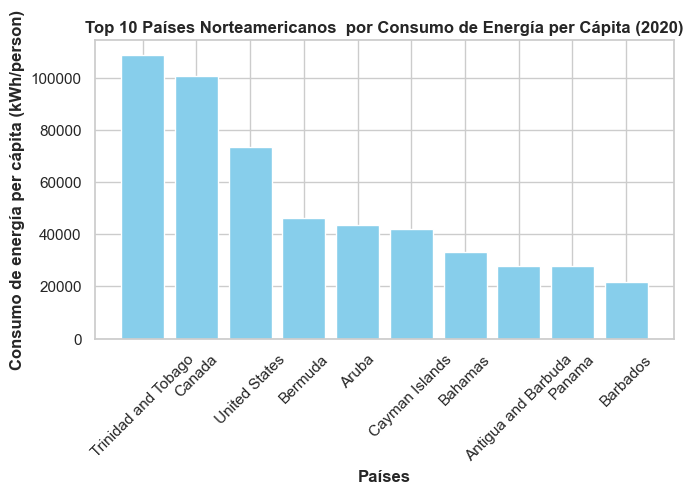

In [558]:
# Top 10 North America countries by energy consumption per capita as of 2020

na_2020 = df_all[(df_all['continent'] == 'North America') & (df_all['year'] == 2020)]
top_10_na = na_2020.sort_values(by='primary_energy_consumption_per_capita(kwh/person)', ascending=False).head(10)
plt.figure(figsize=(7, 5))
plt.bar(top_10_na['entity'], top_10_na['primary_energy_consumption_per_capita(kwh/person)'], color='skyblue')
plt.ylabel('Consumo de energía per cápita (kWh/person)', fontweight='bold')
plt.xlabel('Países', fontweight='bold')
plt.title('Top 10 Países Norteamericanos  por Consumo de Energía per Cápita (2020)', fontweight='bold')
plt.xticks(rotation=45)  
plt.tight_layout()
plt.show()

La tendencia en la generación de electricidad a partir de fuentes renovables puede verse influenciada por una serie de factores. Algunos de los factores que podrían contribuir a la tendencia observada de mayor generación de electricidad renovable en Sudamérica y Asia en comparación con Europa y América del Norte incluyen:

Recursos Renovables Disponibles: La disponibilidad de recursos renovables, como la radiación solar, el viento, la hidroenergía y la biomasa, puede variar significativamente de una región a otra. Sudamérica y algunas partes de Asia pueden tener un acceso más abundante a estos recursos, lo que facilita la generación de electricidad a partir de fuentes renovables.

Políticas Energéticas y Subvenciones: Las políticas gubernamentales y las subvenciones pueden jugar un papel importante en la promoción de la energía renovable. Si los gobiernos de Sudamérica y Asia han implementado políticas que favorecen la inversión en energías renovables, esto podría explicar un mayor crecimiento en la generación renovable.

Inversiones en Infraestructura: La inversión en infraestructura de energías renovables, como parques eólicos y plantas solares, puede impulsar la generación de electricidad renovable. Es posible que se hayan realizado más inversiones en Sudamérica y Asia en estos proyectos.

Demanda Energética: La demanda de energía también puede influir en la generación de electricidad renovable. Si la demanda de energía está aumentando más rápidamente en Sudamérica y Asia en comparación con Europa y América del Norte, esto podría explicar un mayor crecimiento en la generación renovable en esas regiones.

Costos de Tecnología: Los costos de tecnologías renovables, como paneles solares y turbinas eólicas, han disminuido en los últimos años. Esto hace que la generación de electricidad renovable sea más accesible y rentable en muchas regiones.

Conciencia Ambiental: La conciencia ambiental y la preocupación por el cambio climático también pueden influir en las decisiones de inversión y en la preferencia por fuentes de energía más limpias.

fuentes

Sudamérica:

Organización Latinoamericana de Energía (OLADE): Proporciona datos y estadísticas sobre energía en los países de América Latina y el Caribe. (Sitio web: https://www.olade.org/)
Banco Interamericano de Desarrollo (BID): Publica informes y análisis sobre el desarrollo energético en América Latina. (Sitio web: https://www.iadb.org/es)
Asia:

Agencia Internacional de Energías Renovables (IRENA): Ofrece datos y estadísticas sobre energía renovable en Asia y en todo el mundo. (Sitio web: https://www.irena.org/)
Asia Clean Energy Forum (ACEF): Realiza conferencias y proporciona información sobre energías limpias en Asia. (Sitio web: https://www.asiacleanenergyforum.org/)
Europa:

Agencia Internacional de Energía (IEA): Publica informes y análisis sobre el sector energético en Europa y otros continentes. (Sitio web: https://www.iea.org/)
Agencia Europea de Medio Ambiente (EEA): Ofrece datos sobre energía renovable y medio ambiente en Europa. (Sitio web: https://www.eea.europa.eu/)
América del Norte:

Administración de Información de Energía (EIA) de EE. UU.: Proporciona estadísticas y análisis sobre la energía en Estados Unidos. (Sitio web: https://www.eia.gov/)
Comisión de Energía de California: Ofrece información sobre políticas de energía renovable y regulaciones en California, EE. UU. (Sitio web: https://www.energy.ca.gov/)

"Among Asian countries, Qatar, Bahrain, Singapore, and the United Arab Emirates have the highest scores. This can be explained, if it is appropriate to say so, by the disproportion of the country's energy resources and the number of its inhabitants. In addition, these countries are very developed in terms of economy and infrastructure. They have a high level of industrialization, technological progress and a high standard of living. In addition, Qatar and the United Arab Emirates have significant deposits of natural fuel resources (gas and oil fields), which may also explain their leading positions to some extent.
The countries of South America and Africa have the lowest scores among all. This can be explained by poor infrastructure development and limited natural resources. In addition to this, low economic development goes hand in hand with a high level of crime, which further aggravates the current situation within the countries and complicates the processes of creating and consuming public goods.
The countries of Oceania cannot be reduced to a common feature. After all, the difference in energy consumption per capita varies from country to country. For example, New Caledonia, Australia and New Zealand have the highest rates among Oceania, but after the 3rd place (New Zealand), the rates decrease almost twice and tend to fall rapidly.
In general, among the European countries (which, for the most part, do not have significant deposits of natural resources), it can be argued that everything is based on economic ties and international cooperation. Energy imports are commonplace among European countries. In addition, well-developed infrastructure and high concentration of capital make it possible to almost offset the problems associated with limited energy reserves."

### BARRAS APILADAS COMPARATIVA FUENTES DE ELECTRICIDAD: FOSIL, NUCLEAR, RENOVABLE POR CONTINENTE

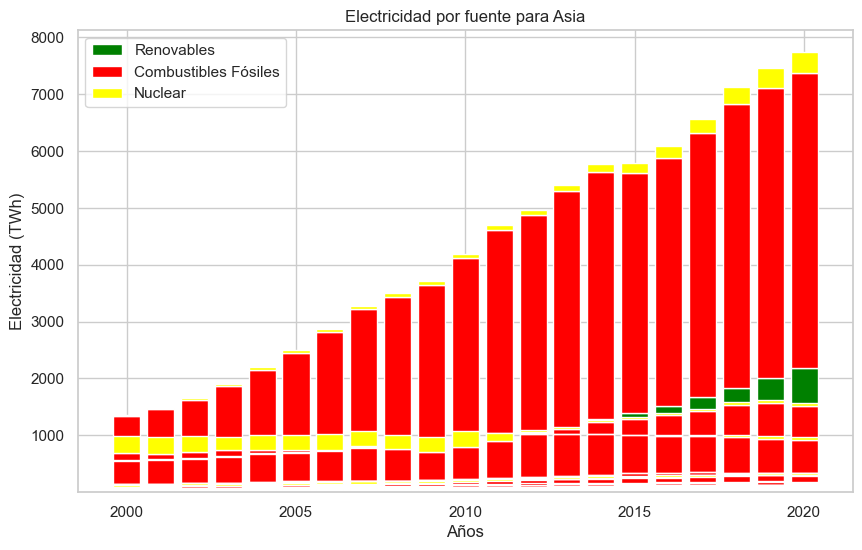

In [559]:
data_continent = df_all[df_all['continent'] == 'Asia']

# Extrae los valores necesarios para el gráfico
years = data_continent['year']
renewables = data_continent['electricity_from_renewables(twh)']
fossil_fuels = data_continent['electricity_from_fossil_fuels(twh)']
nuclear = data_continent['electricity_from_nuclear(twh)']

# Crea el gráfico de barras apiladas
plt.figure(figsize=(10, 6))

# Barra para energía renovable
plt.bar(years, renewables, label='Renovables', color='green')

# Barra para combustibles fósiles, empezando desde el valor de renovables
plt.bar(years, fossil_fuels, bottom=renewables, label='Combustibles Fósiles', color='red')

# Barra para energía nuclear, empezando desde el valor de renovables y fósiles
plt.bar(years, nuclear, bottom=renewables+fossil_fuels, label='Nuclear', color='yellow')

plt.xlabel('Años')
plt.ylabel('Electricidad (TWh)')
plt.title('Electricidad por fuente para Asia')
plt.legend()
plt.grid(True)

# Muestra el gráfico
plt.show()

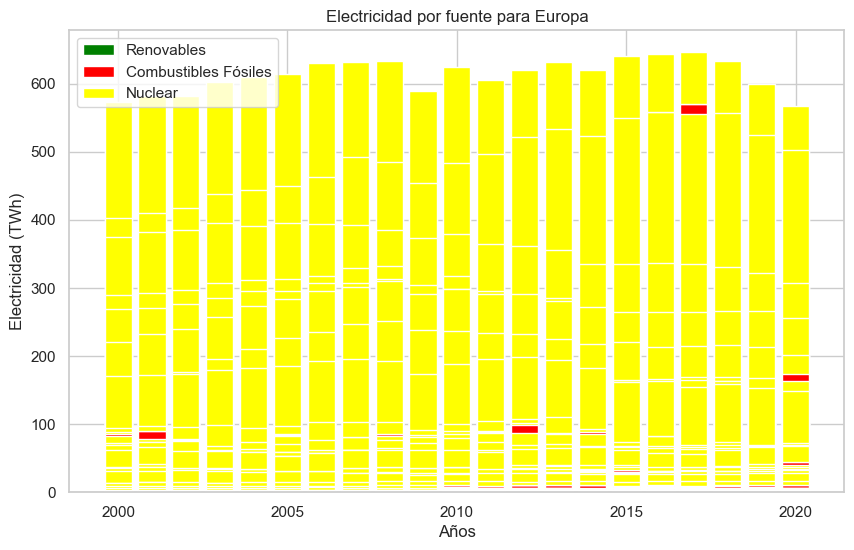

In [560]:
data_continent = df_all[df_all['continent'] == 'Europe']

# Extrae los valores necesarios para el gráfico
years = data_continent['year']
renewables = data_continent['electricity_from_renewables(twh)']
fossil_fuels = data_continent['electricity_from_fossil_fuels(twh)']
nuclear = data_continent['electricity_from_nuclear(twh)']

# Crea el gráfico de barras apiladas
plt.figure(figsize=(10, 6))

# Barra para energía renovable
plt.bar(years, renewables, label='Renovables', color='green')

# Barra para combustibles fósiles, empezando desde el valor de energía renovable
plt.bar(years, fossil_fuels, bottom=renewables, label='Combustibles Fósiles', color='red')

# Barra para energía nuclear, empezando desde el valor de energía renovable y fósiles
plt.bar(years, nuclear, bottom=renewables+fossil_fuels, label='Nuclear', color='yellow')

plt.xlabel('Años')
plt.ylabel('Electricidad (TWh)')
plt.title('Electricidad por fuente para Europa')
plt.legend()
plt.grid(True)

# Muestra el gráfico
plt.show()

## Annual GDP growth rate based on constant local currency by continent

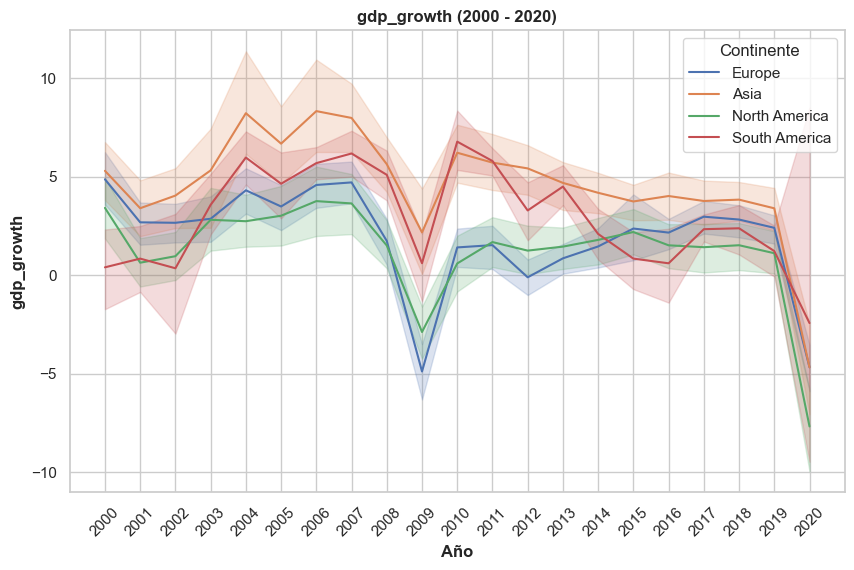

In [561]:
## Electricity generated from renewables
sns.set(style='whitegrid')

# Crear un gráfico de líneas para cada continente
plt.figure(figsize=(10, 6))

# Iterar a través de los nombres únicos de los continentes en df_all
for continente in df_all['continent'].unique():
    df_continente = df_all[df_all['continent'] == continente]
    
    # Crear el gráfico de líneas para el continente actual
    sns.lineplot(data=df_continente, x='year', y='gdp_growth', label=continente)

# Personalizar el diseño del gráfico
plt.xlabel('Año', fontweight='bold')
plt.ylabel('gdp_growth', fontweight='bold')
plt.title('gdp_growth (2000 - 2020)', fontweight='bold')
plt.legend(title='Continente')
plt.xticks(rotation=45, ticks=df_all['year'].unique())
plt.show()

## Gross domestic product per capita by continent

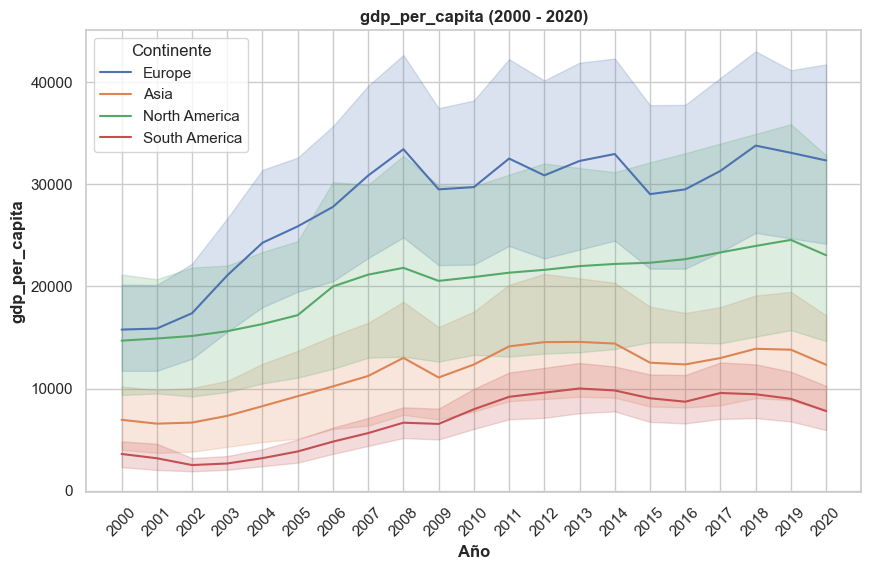

In [562]:
## Electricity generated from renewables
sns.set(style='whitegrid')

# Crear un gráfico de líneas para cada continente
plt.figure(figsize=(10, 6))

# Iterar a través de los nombres únicos de los continentes en df_all
for continente in df_all['continent'].unique():
    df_continente = df_all[df_all['continent'] == continente]
    
    # Crear el gráfico de líneas para el continente actual
    sns.lineplot(data=df_continente, x='year', y='gdp_per_capita', label=continente)

# Personalizar el diseño del gráfico
plt.xlabel('Año', fontweight='bold')
plt.ylabel('gdp_per_capita', fontweight='bold')
plt.title('gdp_per_capita (2000 - 2020)', fontweight='bold')
plt.legend(title='Continente')
plt.xticks(rotation=45, ticks=df_all['year'].unique())
plt.show()

### Primary Energy Consumption Analysis

Primary energy is energy that is extracted directly from its sources, before any transformation or conversion. The energy that is available in its raw or unprocessed form is used to power various sectors and industry

In [563]:
primary_energy_all = df_all[['entity','year','primary_energy_consumption_per_capita(kwh/person)','energy_intensity_level_of_primary_energy(mj/$2017pppgdp)','renewables(%equivalent_primary_energy)','gdp_per_capita']]
primary_energy_all

,entity,year,primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),renewables(%equivalent_primary_energy),gdp_per_capita
0,Albania,2000,9029.43750,4.130000,0.000000,1126.683340
1,Albania,2001,8635.53200,3.890000,0.000000,1281.659826
2,Albania,2002,9443.55500,4.100000,0.000000,1425.124219
3,Albania,2003,10756.61200,3.800000,0.000000,1846.120121
4,Albania,2004,11586.95100,3.960000,0.000000,2373.581292
5,Albania,2005,11545.61600,3.750000,0.000000,2673.786584
6,Albania,2006,10976.72800,3.460000,0.000000,2972.742924
7,Albania,2007,9534.87400,3.120000,0.000000,3595.038057
8,Albania,2008,10499.32800,3.010000,0.000000,4370.539925
9,Albania,2009,11524.42800,2.980000,0.000000,4114.134899


In [564]:
df_all.head(2)

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),continent
0,Albania,2000,100.0,38.2,0.0,0.0,0.0,0.14,0.0,4.55,97.014930,9029.4375,4.13,3170.0,0.0,6.946217,1126.683340,105,28748.0,Europe
1,Albania,2001,100.0,40.5,0.0,0.0,0.0,0.13,0.0,3.52,96.438354,8635.5320,3.89,3230.0,0.0,8.293313,1281.659826,105,28748.0,Europe


### Primary Energy Consumption & Gross Domestic Product (GDP) por pais que mas energia primariaconsume de cada continente

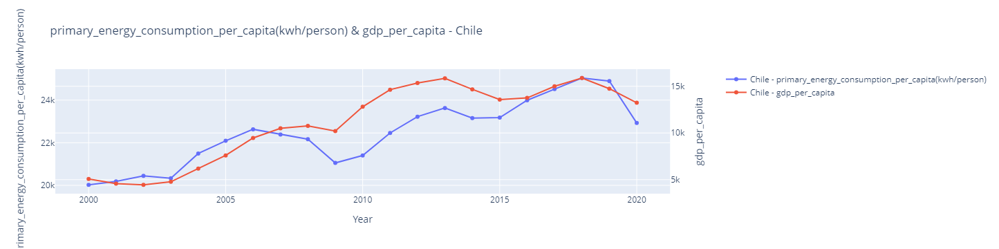

In [565]:
# Selecciona el país que deseas mostrar
country = 'Chile'

# Filtra el DataFrame para el país seleccionado
country_data = df_all[df_all['entity'] == country]

# Especifica las columnas que deseas comparar
column_1 = 'primary_energy_consumption_per_capita(kwh/person)'
column_2 = 'gdp_per_capita'

# Crea el gráfico de líneas con dos ejes
fig = sp.make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_1], name=f'{country} - {column_1}', mode='lines+markers'), secondary_y=False)
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_2], name=f'{country} - {column_2}', mode='lines+markers'), secondary_y=True)
fig.update_layout(title=f'{column_1} & {column_2} - {country}', xaxis_title='Year', yaxis_title='Value')
fig.update_yaxes(title_text=column_1, secondary_y=False)
fig.update_yaxes(title_text=column_2, secondary_y=True)
fig.show()

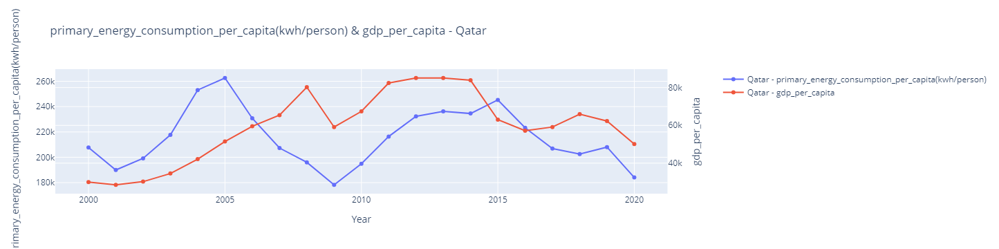

In [566]:
# Selecciona el país que deseas mostrar
country = 'Qatar'

# Filtra el DataFrame para el país seleccionado
country_data = df_all[df_all['entity'] == country]

# Especifica las columnas que deseas comparar
column_1 = 'primary_energy_consumption_per_capita(kwh/person)'
column_2 = 'gdp_per_capita'

# Crea el gráfico de líneas con dos ejes
fig = sp.make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_1], name=f'{country} - {column_1}', mode='lines+markers'), secondary_y=False)
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_2], name=f'{country} - {column_2}', mode='lines+markers'), secondary_y=True)
fig.update_layout(title=f'{column_1} & {column_2} - {country}', xaxis_title='Year', yaxis_title='Value')
fig.update_yaxes(title_text=column_1, secondary_y=False)
fig.update_yaxes(title_text=column_2, secondary_y=True)
fig.show()

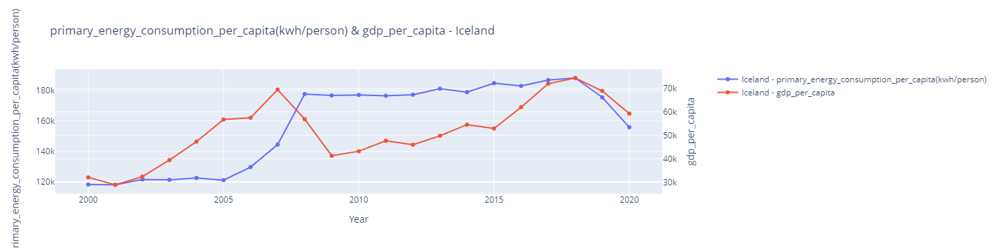

In [567]:
# Selecciona el país que deseas mostrar
country = 'Iceland'

# Filtra el DataFrame para el país seleccionado
country_data = df_all[df_all['entity'] == country]

# Especifica las columnas que deseas comparar
column_1 = 'primary_energy_consumption_per_capita(kwh/person)'
column_2 = 'gdp_per_capita'

# Crea el gráfico de líneas con dos ejes
fig = sp.make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_1], name=f'{country} - {column_1}', mode='lines+markers'), secondary_y=False)
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_2], name=f'{country} - {column_2}', mode='lines+markers'), secondary_y=True)
fig.update_layout(title=f'{column_1} & {column_2} - {country}', xaxis_title='Year', yaxis_title='Value')
fig.update_yaxes(title_text=column_1, secondary_y=False)
fig.update_yaxes(title_text=column_2, secondary_y=True)
fig.show()

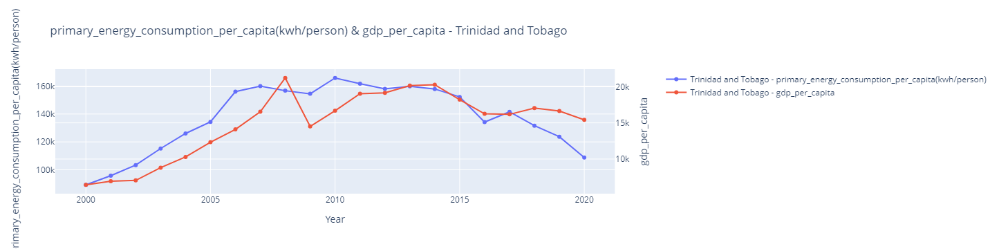

In [568]:
# Selecciona el país que deseas mostrar
country = 'Trinidad and Tobago'

# Filtra el DataFrame para el país seleccionado
country_data = df_all[df_all['entity'] == country]

# Especifica las columnas que deseas comparar
column_1 = 'primary_energy_consumption_per_capita(kwh/person)'
column_2 = 'gdp_per_capita'

# Crea el gráfico de líneas con dos ejes
fig = sp.make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_1], name=f'{country} - {column_1}', mode='lines+markers'), secondary_y=False)
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_2], name=f'{country} - {column_2}', mode='lines+markers'), secondary_y=True)
fig.update_layout(title=f'{column_1} & {column_2} - {country}', xaxis_title='Year', yaxis_title='Value')
fig.update_yaxes(title_text=column_1, secondary_y=False)
fig.update_yaxes(title_text=column_2, secondary_y=True)
fig.show()

## Primary Energy Intensity

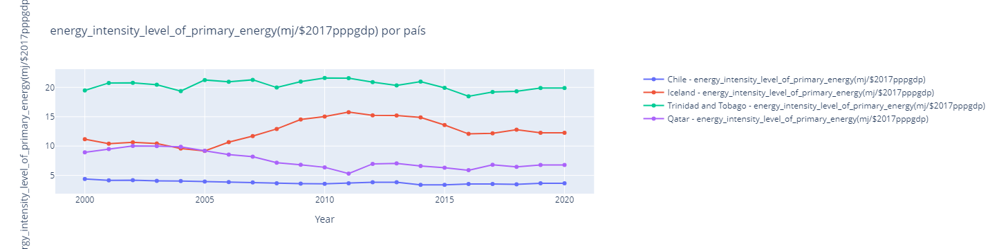

In [569]:
# Selecciona los países que deseas mostrar
countries = ['Chile', 'Iceland', 'Trinidad and Tobago', 'Qatar']

# Filtra el DataFrame para los países seleccionados
selected_data = df_all[df_all['entity'].isin(countries)]

# Especifica la columna que deseas comparar
column = 'energy_intensity_level_of_primary_energy(mj/$2017pppgdp)'

# Crea el gráfico de líneas con dos ejes
fig = sp.make_subplots(specs=[[{"secondary_y": True}]])
for country in countries:
    country_data = selected_data[selected_data['entity'] == country]
    fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column], name=f'{country} - {column}', mode='lines+markers'), secondary_y=False)

fig.update_layout(title=f'{column} por país', xaxis_title='Year', yaxis_title='Valor')
fig.update_yaxes(title_text=column, secondary_y=False)
fig.show()

Energy intensity level of primary energy. Energy intensity is defined as the energy supplied to the economy per unit value of economic output (megajoules per constant 2011 purchasing power parity GDP).TARGET 7.3 By 2030, double the global rate of improvement in energy efficiency. La variable "Energy intensity level of primary energy, MJ/constant 2011 PPP GDP" (Nivel de intensidad energética de la energía primaria, MJ/PIB constante de 2011 en paridad de poder adquisitivo) es una medida que evalúa la eficiencia energética de un país en relación con su Producto Interno Bruto (PIB) ajustado a la paridad de poder adquisitivo (PPA) en términos constantes de 2011. Esta medida se utiliza para cuantificar la cantidad de energía primaria que un país consume para producir un cierto valor de PIB.

En términos simples, indica cuánta energía se necesita para generar una unidad de valor económico en el país. Cuanto menor sea el valor de esta variable, mayor será la eficiencia energética del país, ya que significa que está utilizando menos energía para producir su PIB.

El hecho de que se ajuste a términos constantes de 2011 y se exprese en paridad de poder adquisitivo (PPA) significa que se han tenido en cuenta las variaciones en los precios y el valor del dinero a lo largo del tiempo y entre los países para hacer comparaciones más precisas y equitativas en términos de eficiencia energética.

En resumen, una menor "Energy intensity level of primary energy, MJ/constant 2011 PPP GDP" indica una mayor eficiencia energética en la producción económica de un país, mientras que un valor más alto sugiere que el país consume más energía para generar su PIB.

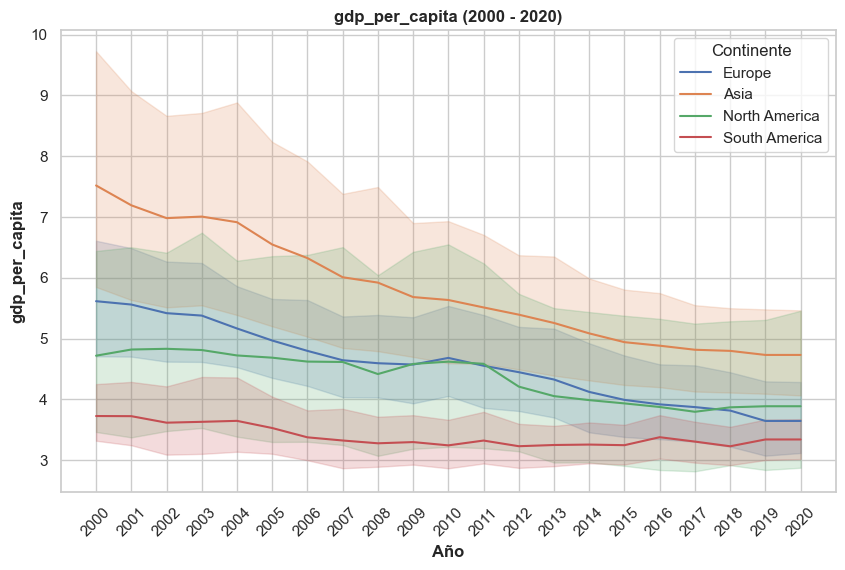

In [570]:
## Electricity generated from renewables
sns.set(style='whitegrid')

# Crear un gráfico de líneas para cada continente
plt.figure(figsize=(10, 6))

# Iterar a través de los nombres únicos de los continentes en df_all
for continente in df_all['continent'].unique():
    df_continente = df_all[df_all['continent'] == continente]
    
    # Crear el gráfico de líneas para el continente actual
    sns.lineplot(data=df_continente, x='year', y='energy_intensity_level_of_primary_energy(mj/$2017pppgdp)', label=continente)

# Personalizar el diseño del gráfico
plt.xlabel('Año', fontweight='bold')
plt.ylabel('gdp_per_capita', fontweight='bold')
plt.title('gdp_per_capita (2000 - 2020)', fontweight='bold')
plt.legend(title='Continente')
plt.xticks(rotation=45, ticks=df_all['year'].unique())
plt.show()

## C02 EMISSIONS ANALYSIS  BY CONTINENT

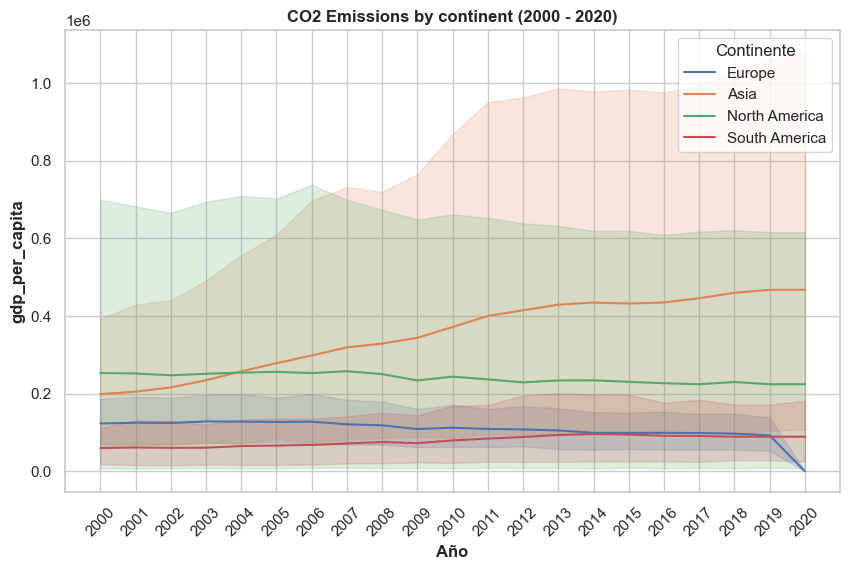

In [571]:
## Electricity generated from renewables
sns.set(style='whitegrid')

# Crear un gráfico de líneas para cada continente
plt.figure(figsize=(10, 6))

# Iterar a través de los nombres únicos de los continentes en df_all
for continente in df_all['continent'].unique():
    df_continente = df_all[df_all['continent'] == continente]
    
    # Crear el gráfico de líneas para el continente actual
    sns.lineplot(data=df_continente, x='year', y='CO2_emissions_value_by_country_kt', label=continente)

# Personalizar el diseño del gráfico
plt.xlabel('Año', fontweight='bold')
plt.ylabel('gdp_per_capita', fontweight='bold')
plt.title('CO2 Emissions by continent (2000 - 2020)', fontweight='bold')
plt.legend(title='Continente')
plt.xticks(rotation=45, ticks=df_all['year'].unique())
plt.show()

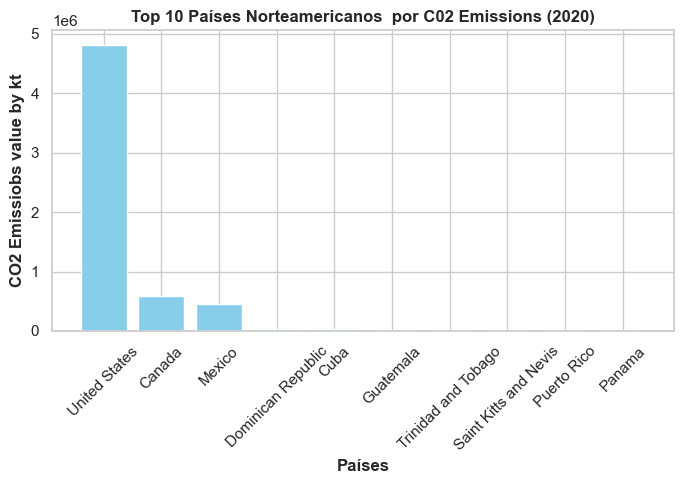

In [572]:
# Top 10 North America countries by C02

nac02_2020 = df_all[(df_all['continent'] == 'North America') & (df_all['year'] == 2020)]
top_10_na_c02 = nac02_2020.sort_values(by='CO2_emissions_value_by_country_kt', ascending=False).head(10)
plt.figure(figsize=(7, 5))
plt.bar(top_10_na_c02['entity'], top_10_na_c02['CO2_emissions_value_by_country_kt'], color='skyblue')
plt.ylabel('CO2 Emissiobs value by kt', fontweight='bold')
plt.xlabel('Países', fontweight='bold')
plt.title('Top 10 Países Norteamericanos  por C02 Emissions (2020)', fontweight='bold')
plt.xticks(rotation=45)  
plt.tight_layout()
plt.show()

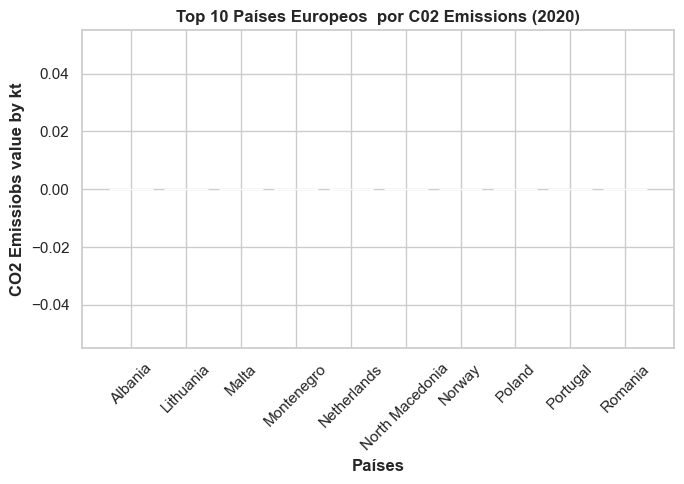

In [573]:

euc02_2020 = df_all[(df_all['continent'] == 'Europe') & (df_all['year'] == 2020)]
top_10_eu_c02 = euc02_2020.sort_values(by='CO2_emissions_value_by_country_kt', ascending=False).head(10)
plt.figure(figsize=(7, 5))
plt.bar(top_10_eu_c02['entity'], top_10_eu_c02['CO2_emissions_value_by_country_kt'], color='skyblue')
plt.ylabel('CO2 Emissiobs value by kt', fontweight='bold')
plt.xlabel('Países', fontweight='bold')
plt.title('Top 10 Países Europeos  por C02 Emissions (2020)', fontweight='bold')
plt.xticks(rotation=45)  
plt.tight_layout()
plt.show()

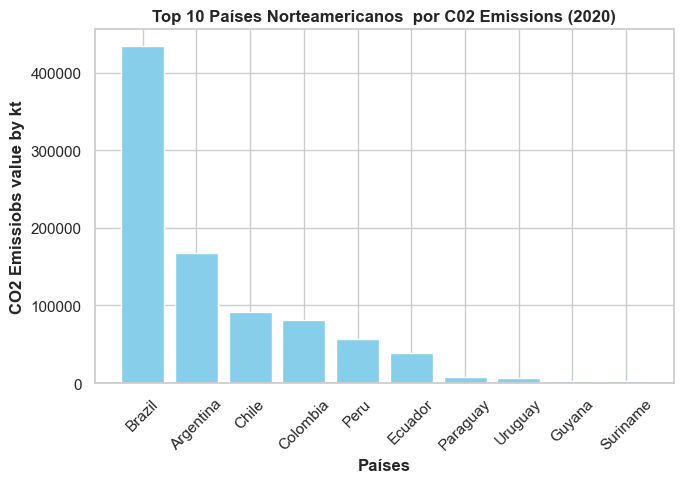

In [574]:
sac02_2020 = df_all[(df_all['continent'] == 'South America') & (df_all['year'] == 2020)]
top_10_sa_c02 = sac02_2020.sort_values(by='CO2_emissions_value_by_country_kt', ascending=False).head(10)
plt.figure(figsize=(7, 5))
plt.bar(top_10_sa_c02['entity'], top_10_sa_c02['CO2_emissions_value_by_country_kt'], color='skyblue')
plt.ylabel('CO2 Emissiobs value by kt', fontweight='bold')
plt.xlabel('Países', fontweight='bold')
plt.title('Top 10 Países Norteamericanos  por C02 Emissions (2020)', fontweight='bold')
plt.xticks(rotation=45)  
plt.tight_layout()
plt.show()

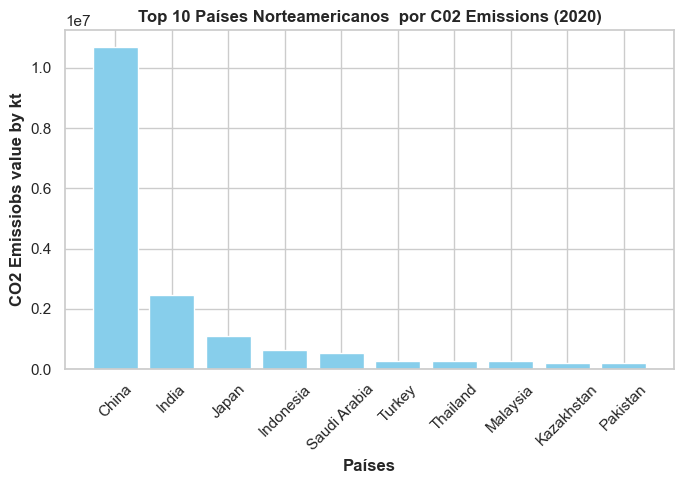

In [575]:
asiac02_2020 = df_all[(df_all['continent'] == 'Asia') & (df_all['year'] == 2020)]
top_10_asia_c02 = asiac02_2020.sort_values(by='CO2_emissions_value_by_country_kt', ascending=False).head(10)
plt.figure(figsize=(7, 5))
plt.bar(top_10_asia_c02['entity'], top_10_asia_c02['CO2_emissions_value_by_country_kt'], color='skyblue')
plt.ylabel('CO2 Emissiobs value by kt', fontweight='bold')
plt.xlabel('Países', fontweight='bold')
plt.title('Top 10 Países Norteamericanos  por C02 Emissions (2020)', fontweight='bold')
plt.xticks(rotation=45)  
plt.tight_layout()
plt.show()

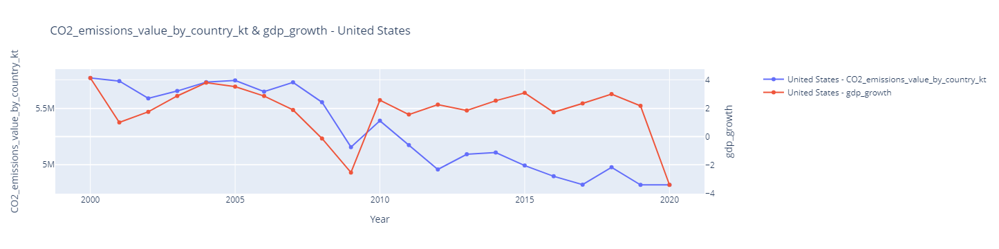

In [576]:
# Selecciona el país que deseas mostrar
country = 'United States'

# Filtra el DataFrame para el país seleccionado
country_data = df_all[df_all['entity'] == country]

# Especifica las columnas que deseas comparar
column_1 = 'CO2_emissions_value_by_country_kt'
column_2 = 'gdp_growth'

# Crea el gráfico de líneas con dos ejes
fig = sp.make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_1], name=f'{country} - {column_1}', mode='lines+markers'), secondary_y=False)
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_2], name=f'{country} - {column_2}', mode='lines+markers'), secondary_y=True)
fig.update_layout(title=f'{column_1} & {column_2} - {country}', xaxis_title='Year', yaxis_title='Value')
fig.update_yaxes(title_text=column_1, secondary_y=False)
fig.update_yaxes(title_text=column_2, secondary_y=True)
fig.show()

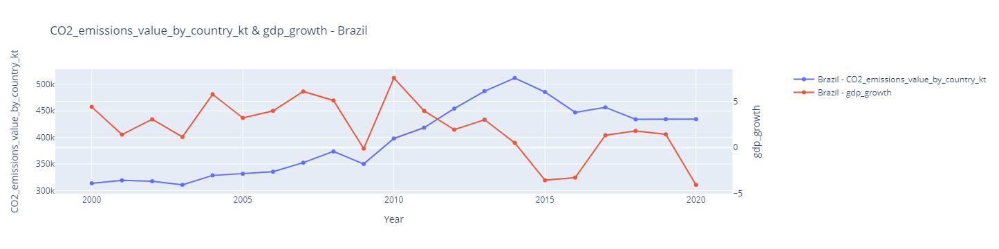

In [577]:
# Selecciona el país que deseas mostrar
country = 'Brazil'

# Filtra el DataFrame para el país seleccionado
country_data = df_all[df_all['entity'] == country]

# Especifica las columnas que deseas comparar
column_1 = 'CO2_emissions_value_by_country_kt'
column_2 = 'gdp_growth'

# Crea el gráfico de líneas con dos ejes
fig = sp.make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_1], name=f'{country} - {column_1}', mode='lines+markers'), secondary_y=False)
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_2], name=f'{country} - {column_2}', mode='lines+markers'), secondary_y=True)
fig.update_layout(title=f'{column_1} & {column_2} - {country}', xaxis_title='Year', yaxis_title='Value')
fig.update_yaxes(title_text=column_1, secondary_y=False)
fig.update_yaxes(title_text=column_2, secondary_y=True)
fig.show()

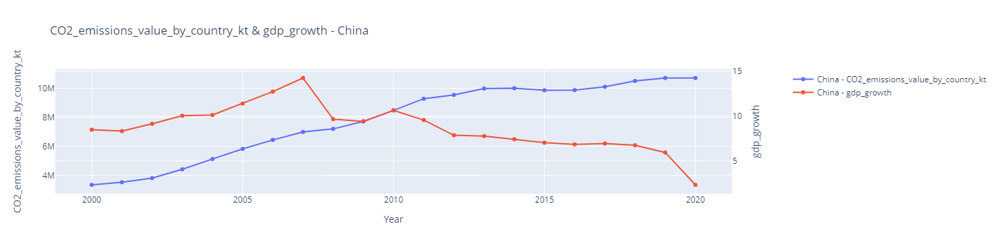

In [578]:
# Selecciona el país que deseas mostrar
country = 'China'

# Filtra el DataFrame para el país seleccionado
country_data = df_all[df_all['entity'] == country]

# Especifica las columnas que deseas comparar
column_1 = 'CO2_emissions_value_by_country_kt'
column_2 = 'gdp_growth'

# Crea el gráfico de líneas con dos ejes
fig = sp.make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_1], name=f'{country} - {column_1}', mode='lines+markers'), secondary_y=False)
fig.add_trace(go.Scatter(x=country_data['year'], y=country_data[column_2], name=f'{country} - {column_2}', mode='lines+markers'), secondary_y=True)
fig.update_layout(title=f'{column_1} & {column_2} - {country}', xaxis_title='Year', yaxis_title='Value')
fig.update_yaxes(title_text=column_1, secondary_y=False)
fig.update_yaxes(title_text=column_2, secondary_y=True)
fig.show()

### Corriente financiera

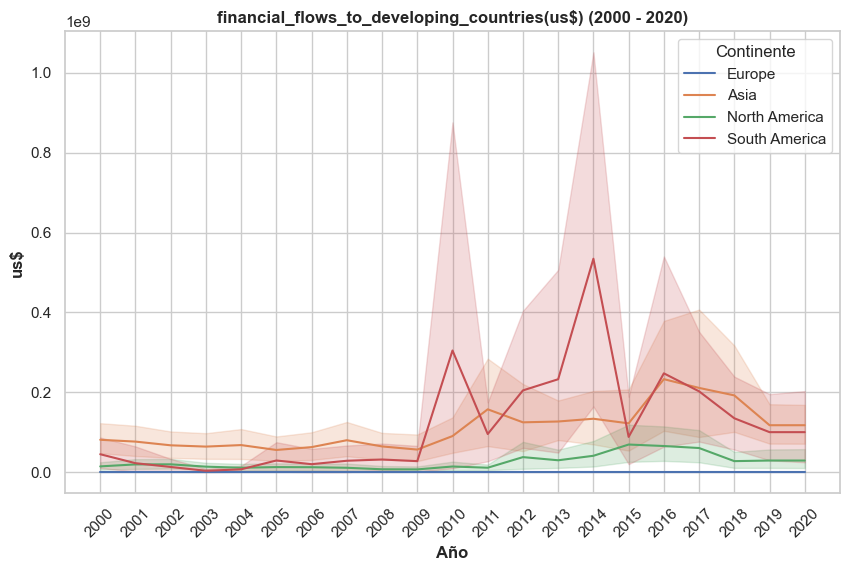

In [579]:
## Electricity generated from renewables
sns.set(style='whitegrid')

# Crear un gráfico de líneas para cada continente
plt.figure(figsize=(10, 6))

# Iterar a través de los nombres únicos de los continentes en df_all
for continente in df_all['continent'].unique():
    df_continente = df_all[df_all['continent'] == continente]
    
    # Crear el gráfico de líneas para el continente actual
    sns.lineplot(data=df_continente, x='year', y='financial_flows_to_developing_countries(us$)', label=continente)

# Personalizar el diseño del gráfico
plt.xlabel('Año', fontweight='bold')
plt.ylabel('us$', fontweight='bold')
plt.title('financial_flows_to_developing_countries(us$) (2000 - 2020)', fontweight='bold')
plt.legend(title='Continente')
plt.xticks(rotation=45, ticks=df_all['year'].unique())
plt.show()

In [580]:
df_all.head()

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2),continent
0,Albania,2000,100.0,38.2,0.0,0.0,0.0,0.14,0.0,4.55,97.014930,9029.4375,4.13,3170.000000,0.0,6.946217,1126.683340,105,28748.0,Europe
1,Albania,2001,100.0,40.5,0.0,0.0,0.0,0.13,0.0,3.52,96.438354,8635.5320,3.89,3230.000000,0.0,8.293313,1281.659826,105,28748.0,Europe
2,Albania,2002,100.0,43.2,0.0,0.0,0.0,0.16,0.0,3.48,95.604390,9443.5550,4.10,3759.999990,0.0,4.536524,1425.124219,105,28748.0,Europe
3,Albania,2003,100.0,46.4,0.0,0.0,0.0,0.10,0.0,5.12,98.084300,10756.6120,3.80,4070.000172,0.0,5.528637,1846.120121,105,28748.0,Europe
4,Albania,2004,100.0,49.0,0.0,0.0,0.0,0.13,0.0,5.41,97.653430,11586.9510,3.96,4250.000000,0.0,5.514668,2373.581292,105,28748.0,Europe


In [589]:
df_all.isnull().sum().sort_values(ascending=False)

entity                                                             0
year                                                               0
landarea(km2)                                                      0
density(P/km2)                                                     0
gdp_per_capita                                                     0
gdp_growth                                                         0
renewables(%equivalent_primary_energy)                             0
CO2_emissions_value_by_country_kt                                  0
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)           0
primary_energy_consumption_per_capita(kwh/person)                  0
low_carbonelectricity(%electricity)                                0
electricity_from_renewables(twh)                                   0
electricity_from_nuclear(twh)                                      0
electricity_from_fossil_fuels(twh)                                 0
renewable_energy_share_in_the_tota

# Feature correlatiomn analysis

In [581]:
df_all_cat=df.select_dtypes(include=['object'])
df_all_cat.head(5)

,entity,density(P/km2),continent
0,Afghanistan,60,Asia
1,Afghanistan,60,Asia
2,Afghanistan,60,Asia
3,Afghanistan,60,Asia
4,Afghanistan,60,Asia


In [582]:
df_all_num= df.select_dtypes(exclude=["object"])
df_all_num.head(5)

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
0,2000,1.613591,6.2,9.22,20000.0,44.99,0.16,0.0,0.31,65.957440,302.59482,1.64,760.000000,NaN,NaN,NaN,652230.0
1,2001,4.074574,7.2,8.86,130000.0,45.60,0.09,0.0,0.50,84.745766,236.89185,1.74,730.000000,NaN,NaN,NaN,652230.0
2,2002,9.409158,8.2,8.47,3950000.0,37.83,0.13,0.0,0.56,81.159424,210.86215,1.40,1029.999971,NaN,NaN,179.426579,652230.0
3,2003,14.738506,9.5,8.09,25970000.0,36.66,0.31,0.0,0.63,67.021280,229.96822,1.40,1220.000029,NaN,8.832278,190.683814,652230.0
4,2004,20.064968,10.9,7.75,NaN,44.24,0.33,0.0,0.56,62.921350,204.23125,1.20,1029.999971,NaN,1.414118,211.382074,652230.0


In [583]:
df_all_num.isnull().sum().sort_values(ascending=False)

financial_flows_to_developing_countries(us$)                       1527
renewables(%equivalent_primary_energy)                              974
renewable_electricity_generating_capacity_per_capita                889
CO2_emissions_value_by_country_kt                                   303
gdp_growth                                                          184
gdp_per_capita                                                      180
renewable_energy_share_in_the_total_final_energy_consumption(%)     133
access_to_clean_fuels_for_cooking                                   127
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)            118
electricity_from_nuclear(twh)                                       105
low_carbonelectricity(%electricity)                                  21
landarea(km2)                                                         1
access_to_electricity(%_of_population)                                1
year                                                            

Text(0.0, 1.0, 'CORRELATIONS HEATMAP FOR NUMERICAL DATA')

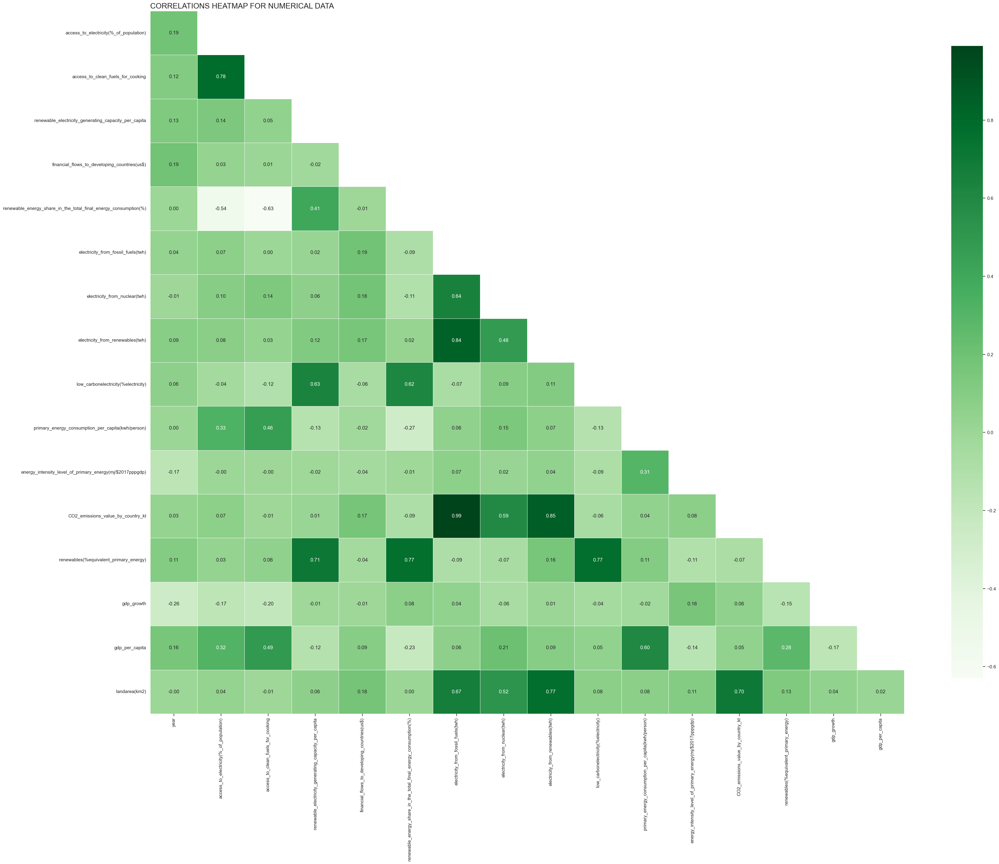

In [458]:
corr = df_all_num.corr()
ones = np.ones_like(corr, dtype="bool")
mask = np.triu(ones)
mask = mask[1:, :-1]
corr = corr.iloc[1:,:-1].copy()
fig, ax = plt.subplots(figsize=(40,30))
sns.heatmap(corr, mask=mask, annot=True, fmt=".2f", cmap="Greens", linewidths=.6, cbar_kws={"shrink":.9})
ax.xaxis.tick_bottom()
plt.title("Correlations heatmap for numerical data".upper(), fontdict={"fontsize": 18}, loc="left")

In [30]:
#High correlation:.80 to 1
#Mean correlation:.60 to .80
#Low correlation: .40 to .60


In [466]:
corr = df_all_num.corr()
high_corr = corr[corr > 0.80]
high_corr = high_corr.unstack().dropna()
high_corr = high_corr[high_corr.index.get_level_values(0) != high_corr.index.get_level_values(1)]

for index, value in high_corr.items():
    variable_1, variable_2 = index
    correlation_value = value
    print("Variables:", variable_1, "and", variable_2)
    print("Correlation:", correlation_value)
    print("------------------------")

Variables: electricity_from_fossil_fuels(twh) and electricity_from_renewables(twh)
Correlation: 0.8438797621769095
------------------------
Variables: electricity_from_fossil_fuels(twh) and CO2_emissions_value_by_country_kt
Correlation: 0.9896008901426897
------------------------
Variables: electricity_from_renewables(twh) and electricity_from_fossil_fuels(twh)
Correlation: 0.8438797621769095
------------------------
Variables: electricity_from_renewables(twh) and CO2_emissions_value_by_country_kt
Correlation: 0.8545410461299255
------------------------
Variables: CO2_emissions_value_by_country_kt and electricity_from_fossil_fuels(twh)
Correlation: 0.9896008901426897
------------------------
Variables: CO2_emissions_value_by_country_kt and electricity_from_renewables(twh)
Correlation: 0.8545410461299255
------------------------


electricity_from_fossil_fuels(twh) and electricity_from_renewables(twh)
electricity_from_fossil_fuels(twh) and CO2_emissions_value_by_country_kt
CO2_emissions_value_by_country_kt and electricity_from_renewables(twh)
CO2_emissions_value_by_country_kt and electricity_from_fossil_fuels(twh)

Correlations Results

- Access to Electricity and Access to Clean Fuels for Cooking: The variables "access_to_electricity(%_of_population)" and "access_to_clean_fuels_for_cooking" have a very high correlation of approximately 0.879. This suggests a strong association between access to electricity and access to clean cooking fuels in the population. Regions or countries with access to electricity are likely to have access to cleaner cooking sources as well, which is positive from a sustainability and quality of life perspective.????

- Fossil Electricity and Renewable Electricity: The variables "electricity_from_fossil_fuels(twh)" and "electricity_from_renewables(twh)" have a correlation of approximately 0.840. This suggests that, in general, an increase in electricity generation from renewable sources is often accompanied by a decrease in electricity generation from fossil fuels. This positive correlation indicates a transition toward cleaner and renewable energy sources.?????

- Fossil Electricity and CO2 Emissions: The variables "electricity_from_fossil_fuels(twh)" and "CO2_emissions_value_by_country_kt)" have an extremely high correlation of approximately 0.990. This suggests a strong relationship between electricity generation from fossil fuels and carbon dioxide (CO2) emissions. As electricity generation from fossil fuels increases, CO2 emissions are likely to increase as well.

- Renewable Electricity and CO2 Emissions: The variables "electricity_from_renewables(twh)" and "CO2_emissions_value_by_country_kt)" have a correlation of approximately 0.857. This suggests that an increase in electricity generation from renewable sources is often associated with a decrease in CO2 emissions. This supports the idea that transitioning to renewable energy sources can contribute to reducing greenhouse gas emissions.???????

In [467]:
df_all_num.head(1)

,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,landarea(km2)
0,2000,1.613591,6.2,9.22,20000.0,44.99,0.16,0.0,0.31,65.95744,302.59482,1.64,760.0,NaN,NaN,NaN,652230.0


In [481]:
df_all.isnull().sum().sort_values(ascending=False)

entity                                                             0
year                                                               0
landarea(km2)                                                      0
density(P/km2)                                                     0
gdp_per_capita                                                     0
gdp_growth                                                         0
renewables(%equivalent_primary_energy)                             0
CO2_emissions_value_by_country_kt                                  0
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)           0
primary_energy_consumption_per_capita(kwh/person)                  0
low_carbonelectricity(%electricity)                                0
electricity_from_renewables(twh)                                   0
electricity_from_nuclear(twh)                                      0
electricity_from_fossil_fuels(twh)                                 0
renewable_energy_share_in_the_tota

In [588]:
df_all_num.isnull().sum().sort_values(ascending=False)

financial_flows_to_developing_countries(us$)                       1527
renewables(%equivalent_primary_energy)                              974
renewable_electricity_generating_capacity_per_capita                889
CO2_emissions_value_by_country_kt                                   303
gdp_growth                                                          184
gdp_per_capita                                                      180
renewable_energy_share_in_the_total_final_energy_consumption(%)     133
access_to_clean_fuels_for_cooking                                   127
energy_intensity_level_of_primary_energy(mj/$2017pppgdp)            118
electricity_from_nuclear(twh)                                       105
low_carbonelectricity(%electricity)                                  21
landarea(km2)                                                         1
access_to_electricity(%_of_population)                                1
year                                                            

In [479]:
#VIF
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

features = ['income', 'mntmeatproducts','mntwines','total_purchases']

def calculate_vif(df, features):    
    vif, tolerance, r2sq = {}, {}, {}
    # all the features that you want to examine
    for feature in features:
        # extract all the other features you will regress against
        X = [f for f in features if f != feature]        
        X, y = df[X], df[feature]
        # extract r-squared from the fit
        r2 = LinearRegression().fit(X, y).score(X, y)                
        
        # calculate tolerance
        r2sq[feature] = r2
        tolerance[feature] = 1 - r2
        # calculate VIF
        vif[feature] = 1/(tolerance[feature])
    # return VIF DataFrame
    return pd.DataFrame({'VIF': vif, 'Tolerance': tolerance, 'R2': r2sq})

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

In [478]:
calculate_vif(df_num, df_num)

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

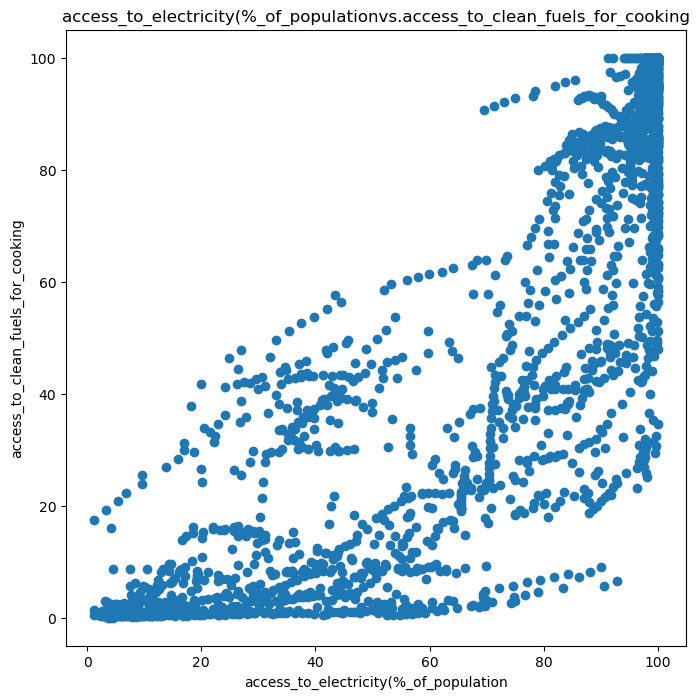

In [32]:
#Plot illustrating access_to_electricity(%_of_population) VS access_to_clean_fuels_for_cooking
plt.figure(figsize=(8, 8))
plt.scatter(df['access_to_electricity(%_of_population)'], df['access_to_clean_fuels_for_cooking'])
plt.title('access_to_electricity(%_of_population' "vs." 'access_to_clean_fuels_for_cooking')
plt.xlabel('access_to_electricity(%_of_population')
plt.ylabel('access_to_clean_fuels_for_cooking')
plt.show()

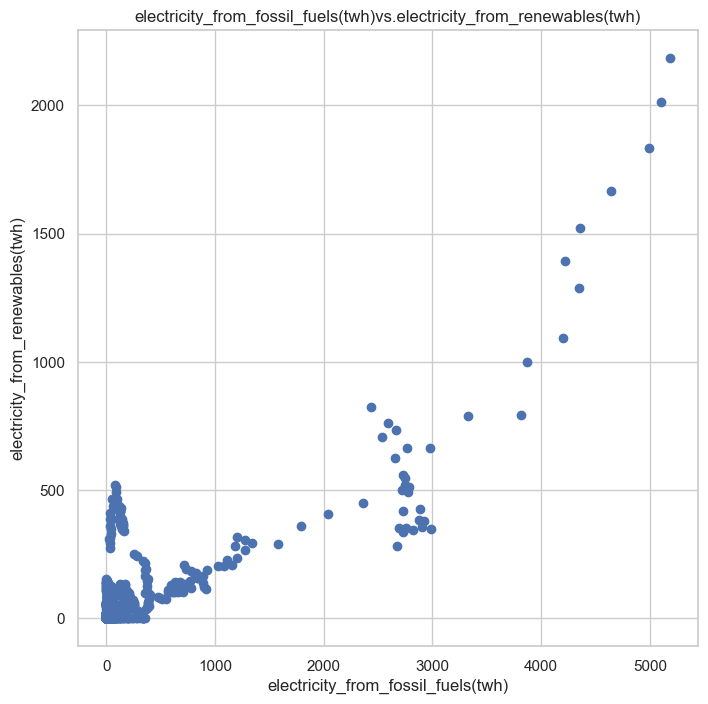

In [408]:
#Plot illustrating electricity_from_fossil_fuels(twh) vs electricity_from_renewables(twh)
plt.figure(figsize=(8, 8))
plt.scatter(df_all['electricity_from_fossil_fuels(twh)'], df_all['electricity_from_renewables(twh)'])
plt.title('electricity_from_fossil_fuels(twh)' "vs." 'electricity_from_renewables(twh)')
plt.xlabel('electricity_from_fossil_fuels(twh)')
plt.ylabel('electricity_from_renewables(twh)')
plt.show()

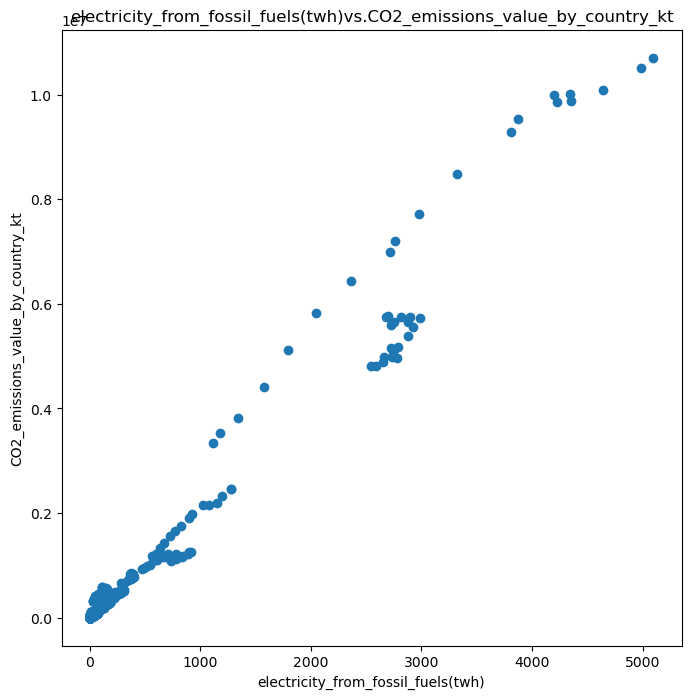

In [34]:
#Plot illustrating electricity_from_fossil_fuels(twh) vs CO2_emissions_value_by_country_kt)
plt.figure(figsize=(8, 8))
plt.scatter(df['electricity_from_fossil_fuels(twh)'], df['CO2_emissions_value_by_country_kt'])
plt.title('electricity_from_fossil_fuels(twh)' "vs." 'CO2_emissions_value_by_country_kt')
plt.xlabel('electricity_from_fossil_fuels(twh)')
plt.ylabel('CO2_emissions_value_by_country_kt')
plt.show()

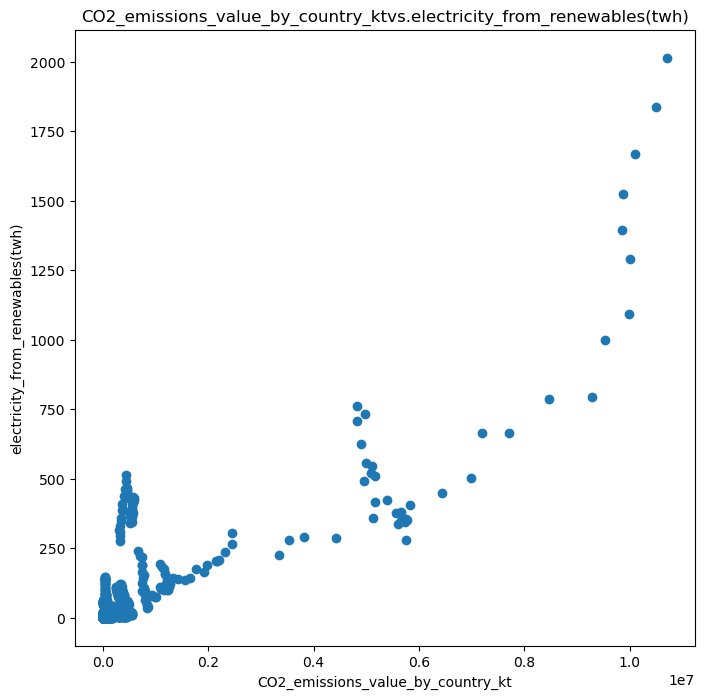

In [35]:
#Plot illustrating CO2_emissions_value_by_country_kt) vs electricity_from_renewables(twh)
plt.figure(figsize=(8, 8))
plt.scatter(df['CO2_emissions_value_by_country_kt'], df['electricity_from_renewables(twh)'])
plt.title('CO2_emissions_value_by_country_kt' "vs." 'electricity_from_renewables(twh)')
plt.xlabel('CO2_emissions_value_by_country_kt')
plt.ylabel('electricity_from_renewables(twh)')
plt.show()

In [36]:
#Drop irrelevant columns 
columnas_a_eliminar = ['latitude', 'longitude']
df = df.drop(columnas_a_eliminar, axis=1)
df

,entity,year,access_to_electricity(%_of_population),access_to_clean_fuels_for_cooking,renewable_electricity_generating_capacity_per_capita,financial_flows_to_developing_countries(us$),renewable_energy_share_in_the_total_final_energy_consumption(%),electricity_from_fossil_fuels(twh),electricity_from_nuclear(twh),electricity_from_renewables(twh),low_carbonelectricity(%electricity),primary_energy_consumption_per_capita(kwh/person),energy_intensity_level_of_primary_energy(mj/$2017pppgdp),CO2_emissions_value_by_country_kt,renewables(%equivalent_primary_energy),gdp_growth,gdp_per_capita,density(P/km2),landarea(km2)
1,Afghanistan,2003,14.738506,9.50,8.09,25970000.0,36.66,0.31,0.0,0.63,67.021280,229.96822,1.40,1220.000029,NaN,8.832278,190.683814,60,652230.0
2,Afghanistan,2004,20.064968,10.90,7.75,NaN,44.24,0.33,0.0,0.56,62.921350,204.23125,1.20,1029.999971,NaN,1.414118,211.382074,60,652230.0
3,Afghanistan,2005,25.390894,12.20,7.51,9830000.0,33.88,0.34,0.0,0.59,63.440857,252.06912,1.41,1549.999952,NaN,11.229715,242.031313,60,652230.0
4,Afghanistan,2006,30.718690,13.85,7.40,10620000.0,31.89,0.20,0.0,0.64,76.190475,304.42090,1.50,1759.999990,NaN,5.357403,263.733602,60,652230.0
5,Afghanistan,2007,36.051010,15.30,7.25,15750000.0,28.78,0.20,0.0,0.75,78.947370,354.27990,1.53,1769.999981,NaN,13.826320,359.693158,60,652230.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2943,Zimbabwe,2016,42.561730,29.80,62.88,30000.0,81.90,3.50,0.0,3.32,48.680350,3227.68020,10.00,11020.000460,NaN,0.755869,1464.588957,38,390757.0
2944,Zimbabwe,2017,44.178635,29.80,62.33,5570000.0,82.46,3.05,0.0,4.30,58.503407,3068.01150,9.51,10340.000150,NaN,4.709492,1235.189032,38,390757.0
2945,Zimbabwe,2018,45.572647,29.90,82.53,10000.0,80.23,3.73,0.0,5.46,59.412407,3441.98580,9.83,12380.000110,NaN,4.824211,1254.642265,38,390757.0
2946,Zimbabwe,2019,46.781475,30.10,81.40,250000.0,81.50,3.66,0.0,4.58,55.582527,3003.65530,10.47,11760.000230,NaN,-6.144236,1316.740657,38,390757.0


#ENERGY CONSUMPTION

In [460]:
# Function to plot features on world map
def plot_world_map(column_name):
    fig = go.Figure()
    for year in range(2000, 2021):
        # Filter the data for the current year
        filtered_df = df_all[df_all['year'] == year]

        # Create a choropleth trace for the current year
        trace = go.Choropleth(
            locations=filtered_df['entity'],
            z=filtered_df[column_name],
            locationmode='country names',
            colorscale='Electric',  # Use a different color scale for better contrast
            colorbar=dict(title=column_name),
            zmin=df[column_name].min(),
            zmax=df[column_name].max(),
            visible=False  # Set the trace to invisible initially
        )

        # Add the trace to the figure
        fig.add_trace(trace)

    # Set the first trace to visible
    fig.data[0].visible = True

    # Create animation steps
    steps = []
    for i in range(len(fig.data)):
        step = dict(
            method='update',
            args=[{'visible': [False] * len(fig.data)},  # Set all traces to invisible
                  {'title_text': f'{column_name} Map - {2000 + i}', 'frame': {'duration': 1000, 'redraw': True}}],
            label=str(2000 + i)  # Set the label for each step
        )
        step['args'][0]['visible'][i] = True  # Set the current trace to visible
        steps.append(step)

    # Create the slider
    sliders = [dict(
        active=0,
        steps=steps,
        currentvalue={"prefix": "Year: ", "font": {"size": 14}},  # Increase font size for slider label
    )]

    # Update the layout of the figure with increased size and change the template
    fig.update_layout(
        title_text=f'{column_name}',  # Set the initial title
        title_font_size=24,  # Increase title font size
        title_x=0.5,  # Center the title
        geo=dict(
            showframe=True,
            showcoastlines=True,
            projection_type='natural earth'
        ),
        sliders=sliders,
        height=500,  # Set the height of the figure in pixels
        width=1000,  # Set the width of the figure in pixels
        font=dict(family='Arial', size=12),  # Customize font family and size for the whole figure
        margin=dict(t=80, l=50, r=50, b=50),  # Add margin for better layout spacing
        template='plotly_dark',  # Change the template to 'plotly_dark'
    )

    # Show the figure
    fig.show()

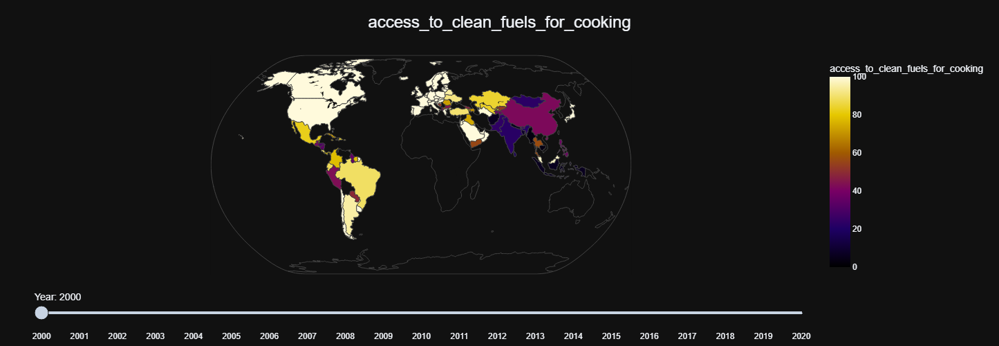

In [461]:
column_name = 'access_to_clean_fuels_for_cooking'
plot_world_map(column_name)

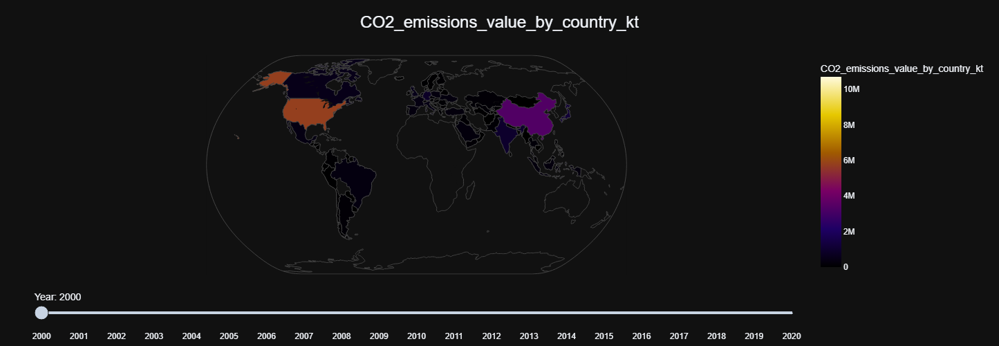

In [462]:
column_name = 'CO2_emissions_value_by_country_kt'
plot_world_map(column_name)

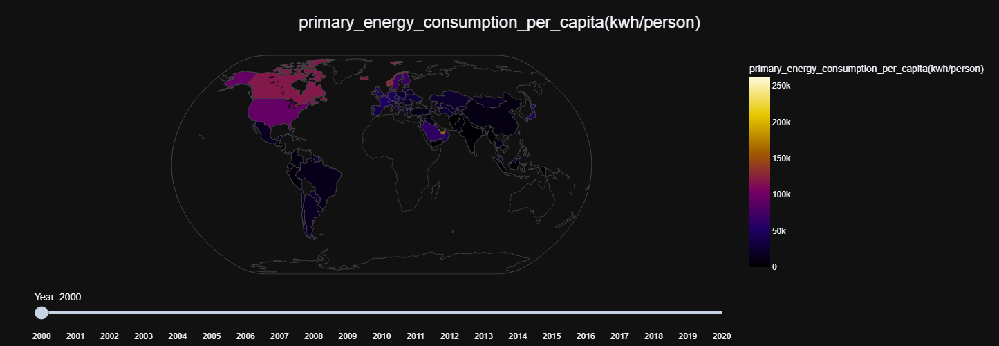

In [463]:
column_name = 'primary_energy_consumption_per_capita(kwh/person)'
plot_world_map(column_name)

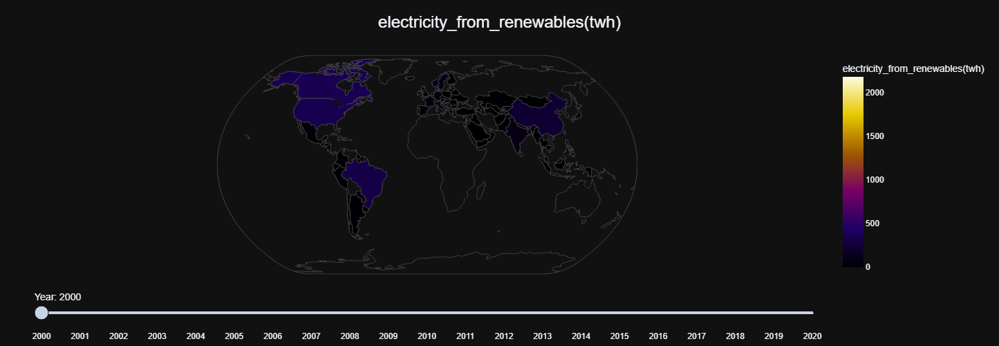

In [464]:
column_name = 'electricity_from_renewables(twh)'
plot_world_map(column_name)   #no aprece nada en Europa y Afric

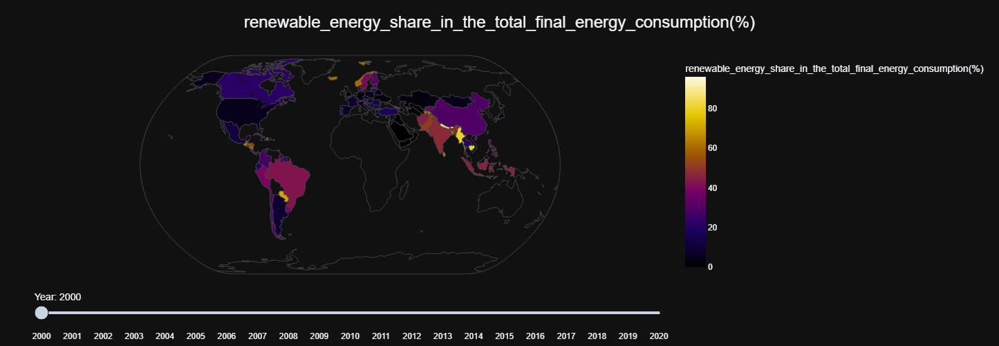

In [465]:
column_name = 'renewable_energy_share_in_the_total_final_energy_consumption(%)'
plot_world_map(column_name)